In [1]:
%run -i 'classes/libraries.py'

In [2]:
# Import all the necessary libraries used inside the system
from classes import ethData, models 

In [3]:
m = models.models()

In [4]:
df_nasdaq = m.getNasdaqData()

In [5]:
from datetime import datetime
from dateutil.relativedelta import relativedelta
# ---------------------------------------------------
# |_______________________________|_________|________|
#           TRAIN                    TEST      PRED
#                                         today

from_data = (datetime.now() - relativedelta(days=60) - relativedelta(years=4)).strftime('%Y-%m-%d')
to_data = (datetime.now() - relativedelta(days=60)).strftime('%Y-%m-%d')
today = (datetime.now()).strftime('%Y-%m-%d')

In [6]:
from_data

'2017-03-01'

In [7]:
to_data

'2021-03-01'

In [8]:
today

'2021-04-30'

In [9]:
# web is an imported library
df = m.getStockQuote(web, df_nasdaq['symbol'][10], 'yahoo', from_data, to_data)

In [10]:
df_nasdaq['symbol'][10]

'AAL'

In [11]:
df_filtered = df.filter(['Close'])

In [12]:
df_filtered.tail(math.ceil(df_filtered.shape[0] * 0.2)).max()

Close    21.82
dtype: float64

In [13]:
models = {}
rmse = {}
perc_train = .8
symbol = df_nasdaq['symbol'][10]
df_test = df_filtered.tail(math.ceil(df_filtered.shape[0] * 1 - perc_train))
models[symbol], rmse[symbol] = m.modelBase(df_filtered, 60, perc_train, 3, False)
print("Accuracy: {0}".format(rmse[symbol] / (df_test.max() - df_test.min())))

Epoch 1/3
746/746 [==============================] - 17s 20ms/step - loss: 0.0101 - mse: 0.0101 - mae: 0.0660 - mape: 24.8331
Epoch 2/3
746/746 [==============================] - 15s 20ms/step - loss: 0.0019 - mse: 0.0019 - mae: 0.0342 - mape: 13.3909
Epoch 3/3
746/746 [==============================] - 15s 20ms/step - loss: 0.0012 - mse: 0.0012 - mae: 0.0266 - mape: 8.6754
Accuracy: Close    0.015146
dtype: float64


In [ ]:
prev_data = m.getStockQuote(web, df_nasdaq['symbol'][10], 'yahoo', to_data, today).values
scaler = MinMaxScaler(feature_range=(0,1))
prev_data_scaled = scaler.fit_transform(prev_data)
X_test = []
X_test.append(prev_data_scaled)
X_test = np.array(X_test)
X_test

In [ ]:
X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1],1))
pred_price = models[symbol].predict(X_test)
pred_price = scaler.invcerse_transform(pred_price)

Ticker Analyzed: A
(1049, 6)
Epoch 1/10
780/780 [==============================] - 18s 21ms/step - loss: 0.0040 - mse: 0.0040 - mae: 0.0393 - mape: 17.9709
Epoch 2/10
780/780 [==============================] - 16s 21ms/step - loss: 7.7441e-04 - mse: 7.7441e-04 - mae: 0.0216 - mape: 10.2157
Epoch 3/10
780/780 [==============================] - 17s 22ms/step - loss: 5.1274e-04 - mse: 5.1274e-04 - mae: 0.0169 - mape: 8.1332
Epoch 4/10
780/780 [==============================] - 17s 22ms/step - loss: 5.0478e-04 - mse: 5.0478e-04 - mae: 0.0167 - mape: 8.0723
Epoch 5/10
780/780 [==============================] - 17s 22ms/step - loss: 4.3734e-04 - mse: 4.3734e-04 - mae: 0.0155 - mape: 7.5906
Epoch 6/10
780/780 [==============================] - 17s 22ms/step - loss: 3.7929e-04 - mse: 3.7929e-04 - mae: 0.0144 - mape: 7.0784
Epoch 7/10
780/780 [==============================] - 17s 22ms/step - loss: 3.5489e-04 - mse: 3.5489e-04 - mae: 0.0138 - mape: 6.4906
Epoch 8/10
780/780 [===================

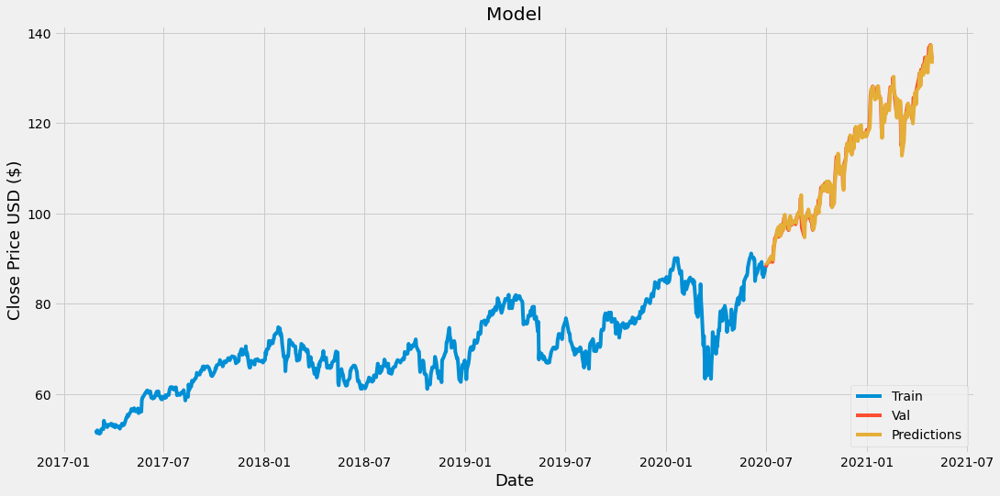

Accuracy: Close    0.001945
dtype: float64
Ticker Analyzed: AA
(1049, 6)
Epoch 1/10
780/780 [==============================] - 18s 21ms/step - loss: 0.0100 - mse: 0.0100 - mae: 0.0593 - mape: 70780.8110
Epoch 2/10
780/780 [==============================] - 16s 21ms/step - loss: 0.0017 - mse: 0.0017 - mae: 0.0306 - mape: 2881.6220
Epoch 3/10
780/780 [==============================] - 16s 21ms/step - loss: 0.0017 - mse: 0.0017 - mae: 0.0306 - mape: 84452.7965
Epoch 4/10
780/780 [==============================] - 16s 21ms/step - loss: 9.9110e-04 - mse: 9.9110e-04 - mae: 0.0239 - mape: 149173.1320
Epoch 5/10
780/780 [==============================] - 16s 21ms/step - loss: 8.1241e-04 - mse: 8.1241e-04 - mae: 0.0209 - mape: 12749.6752
Epoch 6/10
780/780 [==============================] - 16s 21ms/step - loss: 0.0011 - mse: 0.0011 - mae: 0.0247 - mape: 20816.8625
Epoch 7/10
780/780 [==============================] - 16s 21ms/step - loss: 6.4732e-04 - mse: 6.4732e-04 - mae: 0.0178 - mape: 3224

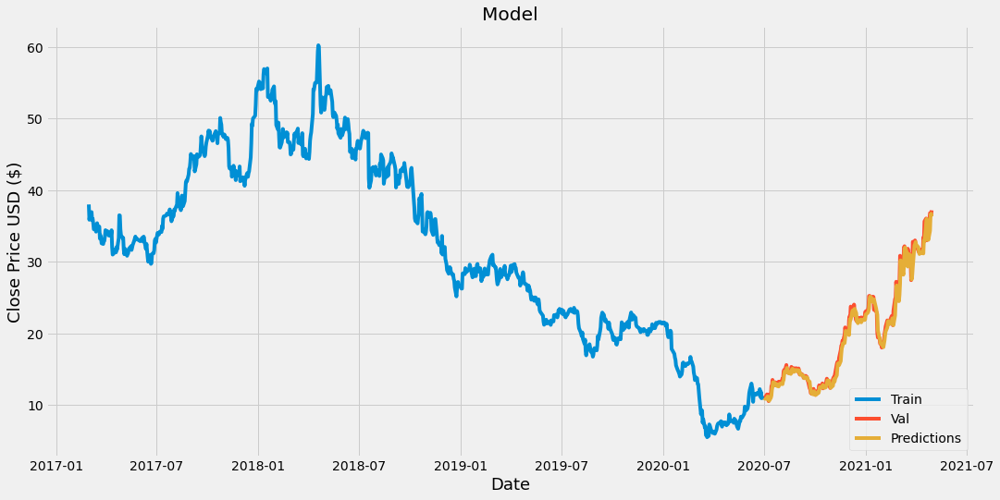

Accuracy: Close    0.005936
dtype: float64
Ticker Analyzed: AACG
(1049, 6)
Epoch 1/10
780/780 [==============================] - 18s 21ms/step - loss: 0.0024 - mse: 0.0024 - mae: 0.0332 - mape: 13097.7678
Epoch 2/10
780/780 [==============================] - 16s 20ms/step - loss: 6.8440e-04 - mse: 6.8440e-04 - mae: 0.0163 - mape: 18422.1365
Epoch 3/10
780/780 [==============================] - 16s 20ms/step - loss: 0.0016 - mse: 0.0016 - mae: 0.0209 - mape: 6986.0946
Epoch 4/10
780/780 [==============================] - 16s 20ms/step - loss: 7.5395e-04 - mse: 7.5395e-04 - mae: 0.0160 - mape: 25736.8952
Epoch 5/10
780/780 [==============================] - 18s 23ms/step - loss: 5.1788e-04 - mse: 5.1788e-04 - mae: 0.0123 - mape: 4747.7582
Epoch 6/10
780/780 [==============================] - 15s 19ms/step - loss: 7.4570e-04 - mse: 7.4570e-04 - mae: 0.0141 - mape: 22956.8558
Epoch 7/10
780/780 [==============================] - 19s 25ms/step - loss: 3.3070e-04 - mse: 3.3070e-04 - mae: 0.0

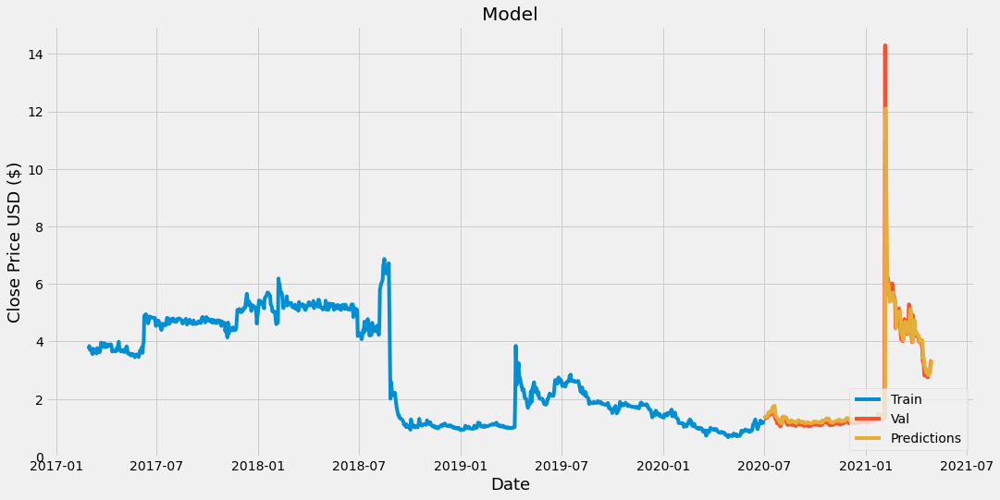

Accuracy: Close    0.001955
dtype: float64
Ticker Analyzed: AACQ
(163, 6)
Epoch 1/10
71/71 [==============================] - 3s 21ms/step - loss: 0.0818 - mse: 0.0818 - mae: 0.1873 - mape: 59.6436
Epoch 2/10
71/71 [==============================] - 1s 20ms/step - loss: 0.0214 - mse: 0.0214 - mae: 0.0931 - mape: 33.8239
Epoch 3/10
71/71 [==============================] - 2s 21ms/step - loss: 0.0316 - mse: 0.0316 - mae: 0.1129 - mape: 39.5875
Epoch 4/10
71/71 [==============================] - 1s 20ms/step - loss: 0.0245 - mse: 0.0245 - mae: 0.0954 - mape: 29.7323
Epoch 5/10
71/71 [==============================] - 1s 20ms/step - loss: 0.0088 - mse: 0.0088 - mae: 0.0571 - mape: 24.0920
Epoch 6/10
71/71 [==============================] - 1s 20ms/step - loss: 0.0161 - mse: 0.0161 - mae: 0.0798 - mape: 29.5882
Epoch 7/10
71/71 [==============================] - 1s 20ms/step - loss: 0.0206 - mse: 0.0206 - mae: 0.0803 - mape: 28.1701
Epoch 8/10
71/71 [==============================] - 1s 20m

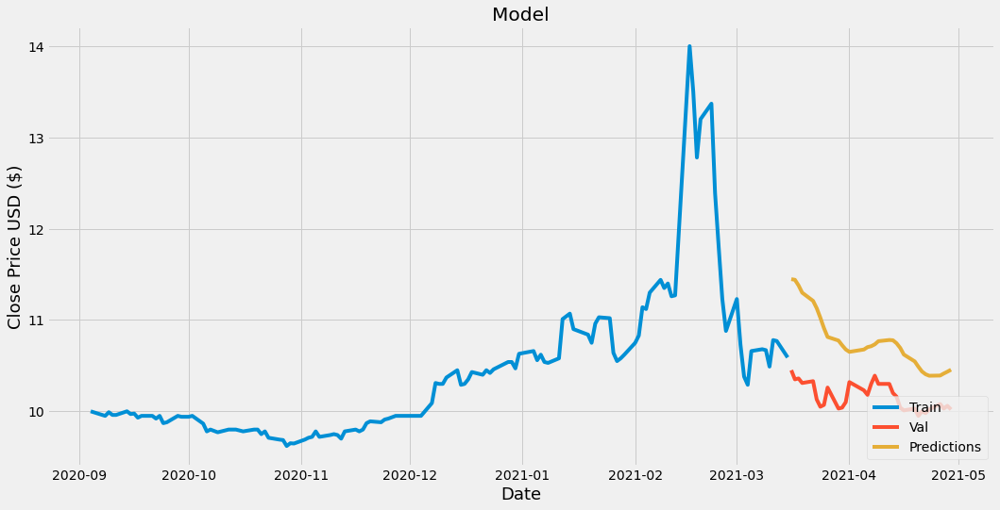

Accuracy: Close    0.139687
dtype: float64
Ticker Analyzed: AACQU
(201, 6)
Epoch 1/10
101/101 [==============================] - 5s 24ms/step - loss: 0.0113 - mse: 0.0113 - mae: 0.0814 - mape: 746554.4513
Epoch 2/10
101/101 [==============================] - 2s 21ms/step - loss: 0.0208 - mse: 0.0208 - mae: 0.0996 - mape: 1370361.5508
Epoch 3/10
101/101 [==============================] - 2s 21ms/step - loss: 0.0267 - mse: 0.0267 - mae: 0.0989 - mape: 726695.4251
Epoch 4/10
101/101 [==============================] - 2s 21ms/step - loss: 0.0135 - mse: 0.0135 - mae: 0.0673 - mape: 694160.0187
Epoch 5/10
101/101 [==============================] - 2s 20ms/step - loss: 0.0089 - mse: 0.0089 - mae: 0.0576 - mape: 1195218.4052
Epoch 6/10
101/101 [==============================] - 2s 20ms/step - loss: 0.0115 - mse: 0.0115 - mae: 0.0641 - mape: 4724385.4877
Epoch 7/10
101/101 [==============================] - 2s 20ms/step - loss: 0.0121 - mse: 0.0121 - mae: 0.0664 - mape: 928029.7440
Epoch 8/10
1

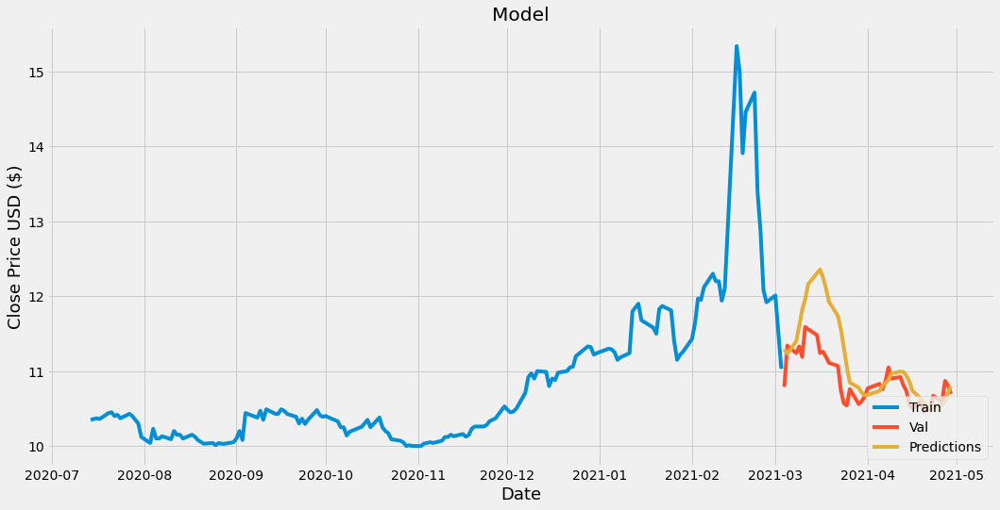

Accuracy: Close    0.050034
dtype: float64
Ticker Analyzed: AAIC
(1049, 6)
Epoch 1/10
780/780 [==============================] - 19s 22ms/step - loss: 0.0110 - mse: 0.0110 - mae: 0.0601 - mape: 70035.8868
Epoch 2/10
780/780 [==============================] - 15s 20ms/step - loss: 0.0015 - mse: 0.0015 - mae: 0.0283 - mape: 726646.3530
Epoch 3/10
780/780 [==============================] - 15s 20ms/step - loss: 9.4027e-04 - mse: 9.4027e-04 - mae: 0.0233 - mape: 191030.4530
Epoch 4/10
780/780 [==============================] - 16s 20ms/step - loss: 6.7468e-04 - mse: 6.7468e-04 - mae: 0.0196 - mape: 92151.9272
Epoch 5/10
780/780 [==============================] - 15s 20ms/step - loss: 6.5683e-04 - mse: 6.5683e-04 - mae: 0.0185 - mape: 419797.1433
Epoch 6/10
780/780 [==============================] - 15s 19ms/step - loss: 5.8230e-04 - mse: 5.8230e-04 - mae: 0.0181 - mape: 17174.9034
Epoch 7/10
780/780 [==============================] - 15s 19ms/step - loss: 7.0380e-04 - mse: 7.0380e-04 - mae

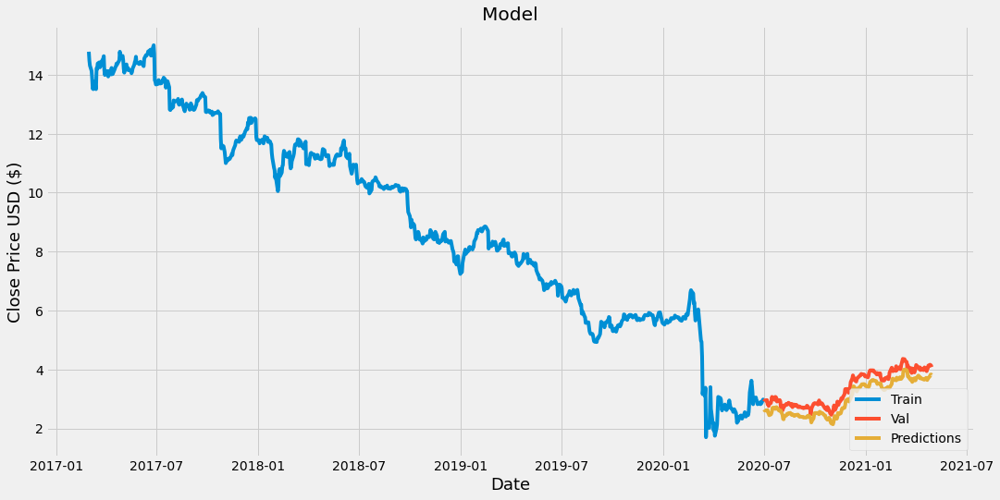

Accuracy: Close    0.0255
dtype: float64
Error on AAIC^B!
Error on AAIC^C!
Ticker Analyzed: AAL
(1049, 6)
Epoch 1/10
780/780 [==============================] - 17s 20ms/step - loss: 0.0101 - mse: 0.0101 - mae: 0.0643 - mape: 8474.8417
Epoch 2/10
780/780 [==============================] - 15s 20ms/step - loss: 0.0015 - mse: 0.0015 - mae: 0.0294 - mape: 12548.3629
Epoch 3/10
780/780 [==============================] - 15s 20ms/step - loss: 0.0011 - mse: 0.0011 - mae: 0.0257 - mape: 7785.8520
Epoch 4/10
780/780 [==============================] - 15s 20ms/step - loss: 0.0011 - mse: 0.0011 - mae: 0.0260 - mape: 1539.7853
Epoch 5/10
780/780 [==============================] - 15s 20ms/step - loss: 7.8362e-04 - mse: 7.8362e-04 - mae: 0.0222 - mape: 1965.8161
Epoch 6/10
780/780 [==============================] - 15s 19ms/step - loss: 9.6450e-04 - mse: 9.6450e-04 - mae: 0.0243 - mape: 9455.4975
Epoch 7/10
780/780 [==============================] - 15s 20ms/step - loss: 8.9081e-04 - mse: 8.9081e-0

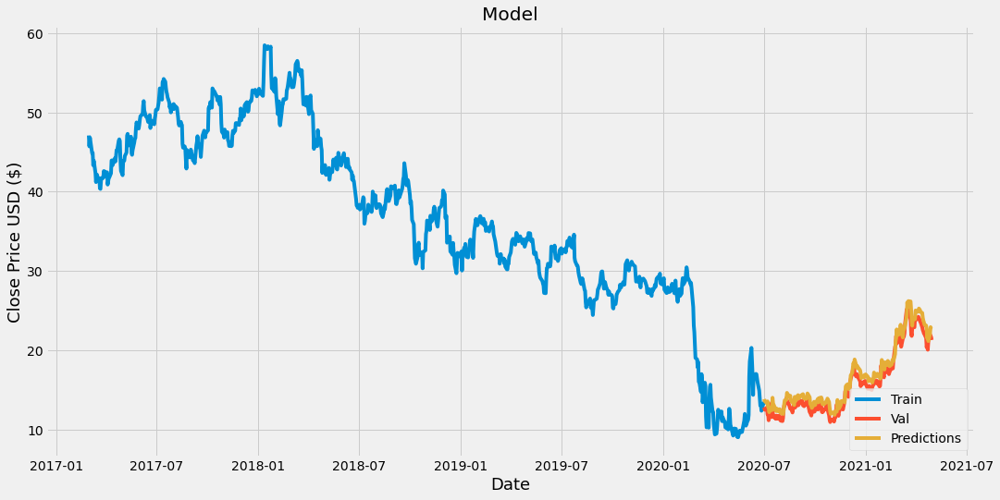

Accuracy: Close    0.017737
dtype: float64
Ticker Analyzed: AAMC
(1049, 6)
Epoch 1/10
780/780 [==============================] - 20s 23ms/step - loss: 0.0125 - mse: 0.0125 - mae: 0.0615 - mape: 40002.4031
Epoch 2/10
780/780 [==============================] - 16s 20ms/step - loss: 0.0020 - mse: 0.0020 - mae: 0.0307 - mape: 37144.3277
Epoch 3/10
780/780 [==============================] - 16s 21ms/step - loss: 0.0012 - mse: 0.0012 - mae: 0.0254 - mape: 1488.6907
Epoch 4/10
780/780 [==============================] - 18s 23ms/step - loss: 0.0020 - mse: 0.0020 - mae: 0.0318 - mape: 40019.5166
Epoch 5/10
780/780 [==============================] - 19s 25ms/step - loss: 9.9109e-04 - mse: 9.9109e-04 - mae: 0.0225 - mape: 1627.2342
Epoch 6/10
780/780 [==============================] - 15s 20ms/step - loss: 6.7832e-04 - mse: 6.7832e-04 - mae: 0.0191 - mape: 22701.9791
Epoch 7/10
780/780 [==============================] - 15s 20ms/step - loss: 7.3861e-04 - mse: 7.3861e-04 - mae: 0.0197 - mape: 1034

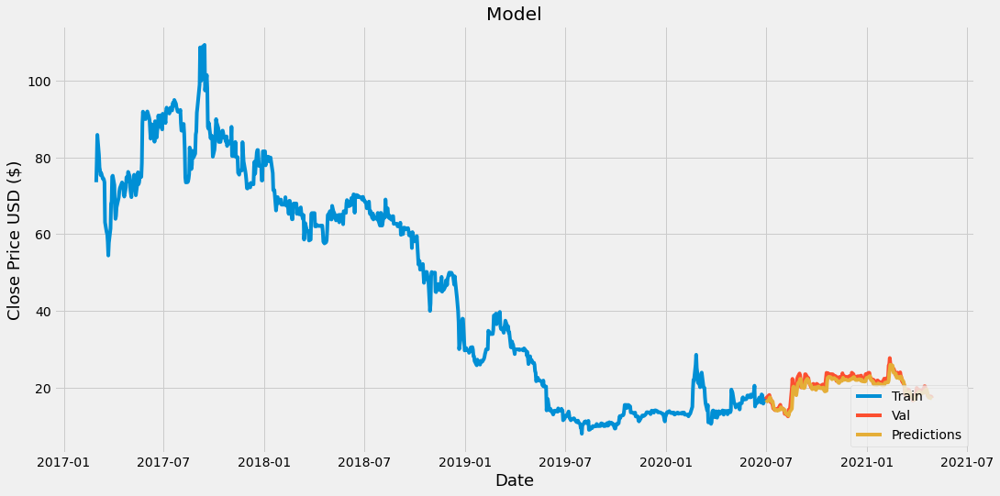

Accuracy: Close    0.006325
dtype: float64
Ticker Analyzed: AAME
(1049, 6)
Epoch 1/10
780/780 [==============================] - 18s 20ms/step - loss: 0.0031 - mse: 0.0031 - mae: 0.0404 - mape: 32039.9267
Epoch 2/10
780/780 [==============================] - 17s 22ms/step - loss: 9.8470e-04 - mse: 9.8470e-04 - mae: 0.0248 - mape: 169011.9430
Epoch 3/10
780/780 [==============================] - 21s 27ms/step - loss: 0.0010 - mse: 0.0010 - mae: 0.0245 - mape: 246869.3618
Epoch 4/10
780/780 [==============================] - 19s 25ms/step - loss: 8.8417e-04 - mse: 8.8417e-04 - mae: 0.0227 - mape: 41218.0156
Epoch 5/10
780/780 [==============================] - 17s 22ms/step - loss: 9.7190e-04 - mse: 9.7190e-04 - mae: 0.0233 - mape: 282736.4791
Epoch 6/10
780/780 [==============================] - 17s 22ms/step - loss: 9.0423e-04 - mse: 9.0423e-04 - mae: 0.0231 - mape: 20348.3001
Epoch 7/10
780/780 [==============================] - 17s 21ms/step - loss: 8.0227e-04 - mse: 8.0227e-04 - mae

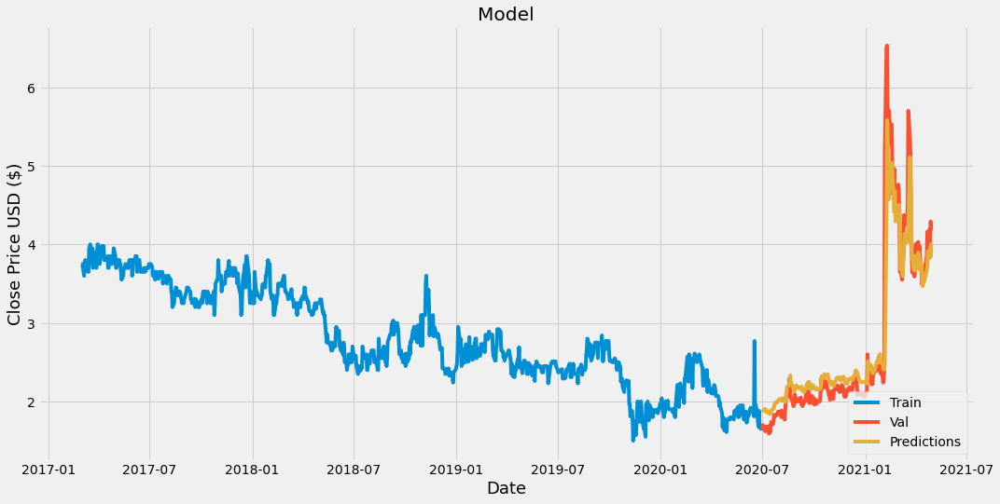

Accuracy: Close    0.004673
dtype: float64
Ticker Analyzed: AAN
(106, 6)
Epoch 1/10
25/25 [==============================] - 3s 22ms/step - loss: 0.0808 - mse: 0.0808 - mae: 0.2366 - mape: 54.0186
Epoch 2/10
25/25 [==============================] - 1s 21ms/step - loss: 0.0097 - mse: 0.0097 - mae: 0.0799 - mape: 17.1050
Epoch 3/10
25/25 [==============================] - 1s 21ms/step - loss: 0.0036 - mse: 0.0036 - mae: 0.0477 - mape: 10.6542
Epoch 4/10
25/25 [==============================] - 1s 23ms/step - loss: 0.0043 - mse: 0.0043 - mae: 0.0525 - mape: 12.4329
Epoch 5/10
25/25 [==============================] - 1s 21ms/step - loss: 0.0039 - mse: 0.0039 - mae: 0.0474 - mape: 9.9836
Epoch 6/10
25/25 [==============================] - 1s 21ms/step - loss: 0.0072 - mse: 0.0072 - mae: 0.0731 - mape: 16.4668
Epoch 7/10
25/25 [==============================] - 1s 21ms/step - loss: 0.0063 - mse: 0.0063 - mae: 0.0643 - mape: 13.1888
Epoch 8/10
25/25 [==============================] - 1s 20ms/

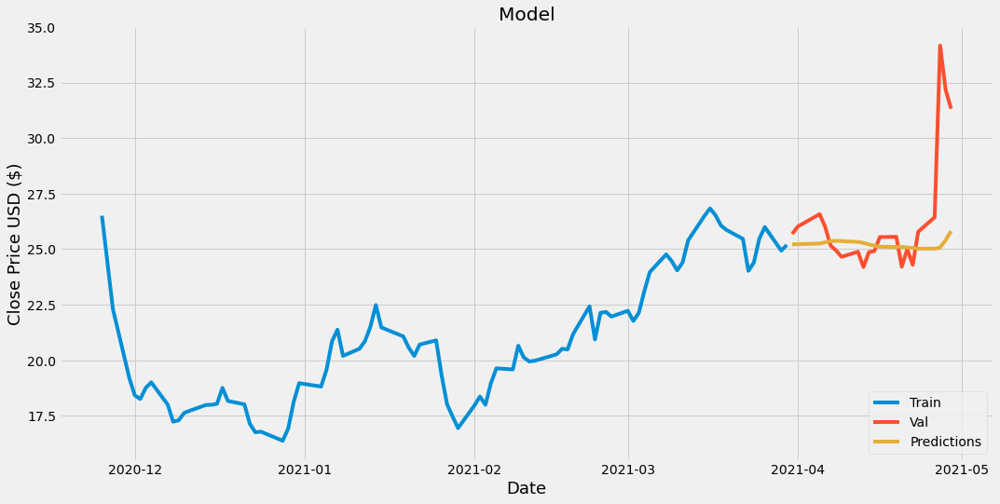

Accuracy: Close    0.060384
dtype: float64
Ticker Analyzed: AAOI
(1049, 6)
Epoch 1/10
780/780 [==============================] - 18s 21ms/step - loss: 0.0055 - mse: 0.0055 - mae: 0.0533 - mape: 555062.6229
Epoch 2/10
780/780 [==============================] - 17s 21ms/step - loss: 0.0016 - mse: 0.0016 - mae: 0.0256 - mape: 113246.4668
Epoch 3/10
780/780 [==============================] - 17s 21ms/step - loss: 0.0014 - mse: 0.0014 - mae: 0.0223 - mape: 342.6968
Epoch 4/10
780/780 [==============================] - 17s 21ms/step - loss: 0.0013 - mse: 0.0013 - mae: 0.0225 - mape: 5794.7589
Epoch 5/10
780/780 [==============================] - 17s 22ms/step - loss: 0.0012 - mse: 0.0012 - mae: 0.0224 - mape: 15045.8893
Epoch 6/10
780/780 [==============================] - 19s 24ms/step - loss: 6.1421e-04 - mse: 6.1421e-04 - mae: 0.0171 - mape: 160.4088
Epoch 7/10
780/780 [==============================] - 17s 22ms/step - loss: 5.9998e-04 - mse: 5.9998e-04 - mae: 0.0153 - mape: 1626.8561
Epo

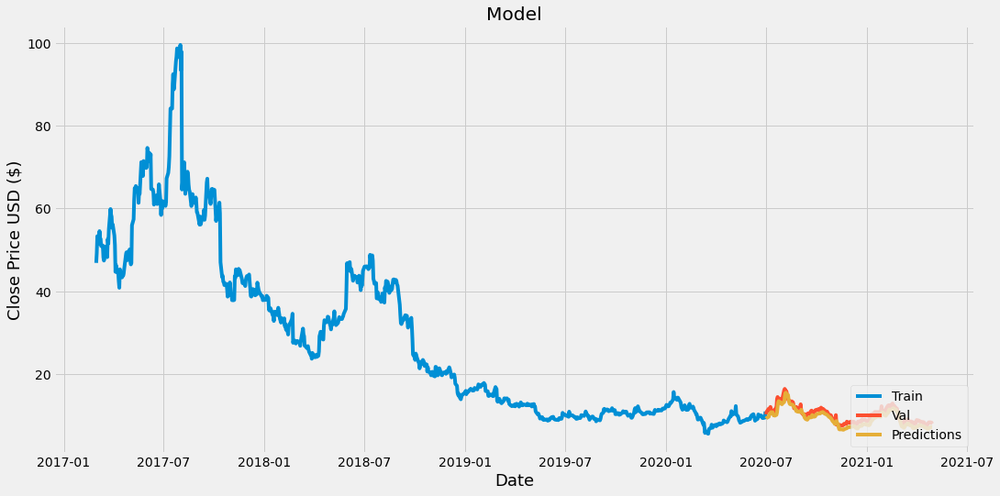

Accuracy: Close    0.009961
dtype: float64
Ticker Analyzed: AAON
(1049, 6)
Epoch 1/10
780/780 [==============================] - 19s 21ms/step - loss: 0.0049 - mse: 0.0049 - mae: 0.0440 - mape: 318613.4846
Epoch 2/10
780/780 [==============================] - 17s 22ms/step - loss: 0.0018 - mse: 0.0018 - mae: 0.0321 - mape: 31504.3439
Epoch 3/10
780/780 [==============================] - 16s 21ms/step - loss: 9.1677e-04 - mse: 9.1677e-04 - mae: 0.0216 - mape: 15314.7236
Epoch 4/10
780/780 [==============================] - 16s 21ms/step - loss: 7.3168e-04 - mse: 7.3168e-04 - mae: 0.0199 - mape: 93686.9977
Epoch 5/10
780/780 [==============================] - 17s 22ms/step - loss: 7.8871e-04 - mse: 7.8871e-04 - mae: 0.0205 - mape: 1948.1469
Epoch 6/10
780/780 [==============================] - 17s 22ms/step - loss: 0.0010 - mse: 0.0010 - mae: 0.0218 - mape: 18444.0888
Epoch 7/10
780/780 [==============================] - 17s 22ms/step - loss: 7.5278e-04 - mse: 7.5278e-04 - mae: 0.0193 - 

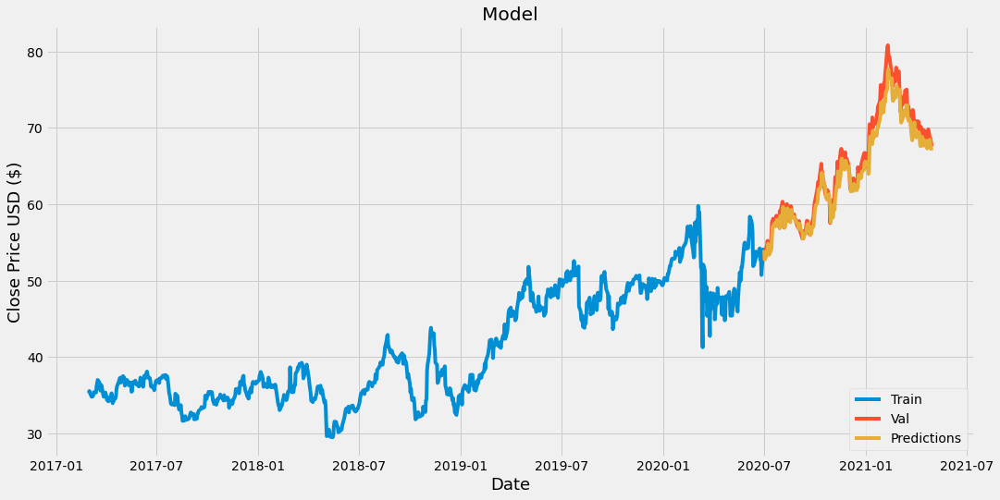

Accuracy: Close    0.020903
dtype: float64
Ticker Analyzed: AAP
(1049, 6)
Epoch 1/10
780/780 [==============================] - 19s 22ms/step - loss: 0.0135 - mse: 0.0135 - mae: 0.0763 - mape: 138521.6522
Epoch 2/10
780/780 [==============================] - 17s 22ms/step - loss: 0.0022 - mse: 0.0022 - mae: 0.0353 - mape: 150653.1392
Epoch 3/10
780/780 [==============================] - 18s 23ms/step - loss: 0.0016 - mse: 0.0016 - mae: 0.0301 - mape: 4389.4317
Epoch 4/10
780/780 [==============================] - 17s 22ms/step - loss: 0.0013 - mse: 0.0013 - mae: 0.0277 - mape: 27912.5762
Epoch 5/10
780/780 [==============================] - 18s 24ms/step - loss: 0.0011 - mse: 0.0011 - mae: 0.0247 - mape: 40268.6346
Epoch 6/10
780/780 [==============================] - 21s 26ms/step - loss: 0.0011 - mse: 0.0011 - mae: 0.0244 - mape: 85866.4015
Epoch 7/10
780/780 [==============================] - 18s 24ms/step - loss: 9.9481e-04 - mse: 9.9481e-04 - mae: 0.0235 - mape: 57673.5810
Epoch 8

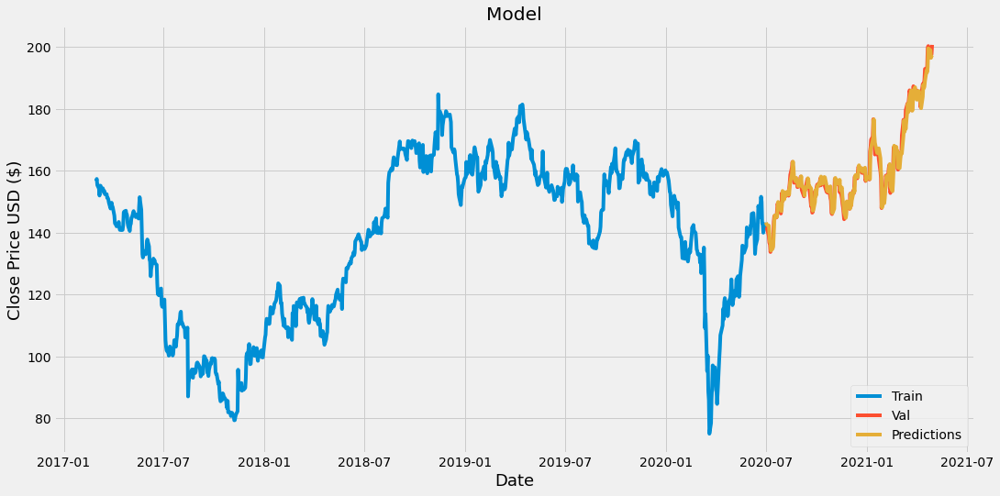

Accuracy: Close    0.000467
dtype: float64
Ticker Analyzed: AAPL
(1049, 6)
Epoch 1/10
780/780 [==============================] - 20s 22ms/step - loss: 0.0014 - mse: 0.0014 - mae: 0.0271 - mape: 29.6225
Epoch 2/10
780/780 [==============================] - 16s 21ms/step - loss: 5.0470e-04 - mse: 5.0470e-04 - mae: 0.0165 - mape: 16.4605
Epoch 3/10
780/780 [==============================] - 17s 21ms/step - loss: 4.6589e-04 - mse: 4.6589e-04 - mae: 0.0158 - mape: 15.9026
Epoch 4/10
780/780 [==============================] - 17s 21ms/step - loss: 2.2856e-04 - mse: 2.2856e-04 - mae: 0.0110 - mape: 11.0449
Epoch 5/10
780/780 [==============================] - 17s 21ms/step - loss: 2.8375e-04 - mse: 2.8375e-04 - mae: 0.0123 - mape: 13.2564
Epoch 6/10
780/780 [==============================] - 16s 21ms/step - loss: 2.8116e-04 - mse: 2.8116e-04 - mae: 0.0123 - mape: 14.7604
Epoch 7/10
780/780 [==============================] - 16s 21ms/step - loss: 2.0266e-04 - mse: 2.0266e-04 - mae: 0.0109 - ma

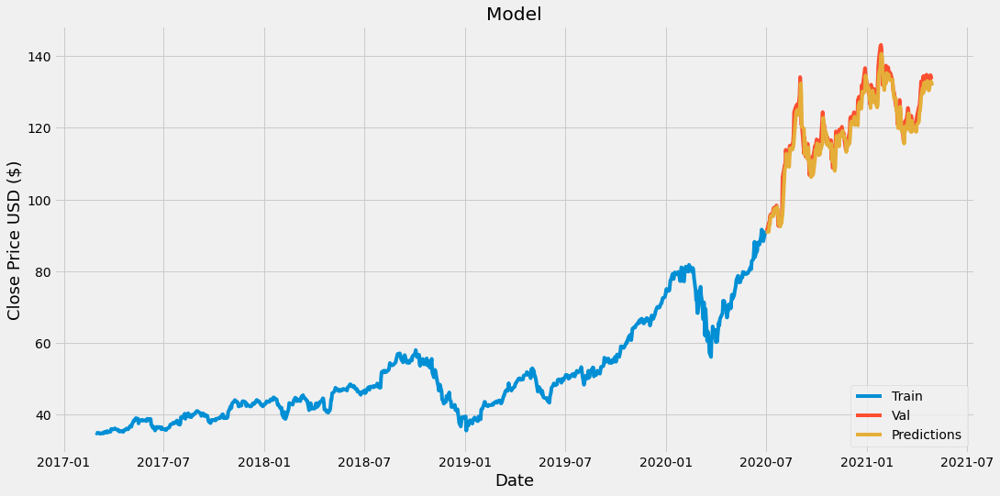

Accuracy: Close    0.012504
dtype: float64
Ticker Analyzed: AAT
(1049, 6)
Epoch 1/10
780/780 [==============================] - 21s 24ms/step - loss: 0.0188 - mse: 0.0188 - mae: 0.0728 - mape: 14.3443
Epoch 2/10
780/780 [==============================] - 21s 26ms/step - loss: 0.0022 - mse: 0.0022 - mae: 0.0342 - mape: 8.2244
Epoch 3/10
780/780 [==============================] - 20s 26ms/step - loss: 0.0023 - mse: 0.0023 - mae: 0.0342 - mape: 10.0074
Epoch 4/10
780/780 [==============================] - 19s 24ms/step - loss: 0.0023 - mse: 0.0023 - mae: 0.0313 - mape: 9.0329
Epoch 5/10
780/780 [==============================] - 16s 21ms/step - loss: 0.0015 - mse: 0.0015 - mae: 0.0259 - mape: 5.7708
Epoch 6/10
780/780 [==============================] - 16s 20ms/step - loss: 0.0015 - mse: 0.0015 - mae: 0.0268 - mape: 6.0375
Epoch 7/10
780/780 [==============================] - 16s 20ms/step - loss: 0.0014 - mse: 0.0014 - mae: 0.0272 - mape: 6.4520
Epoch 8/10
780/780 [======================

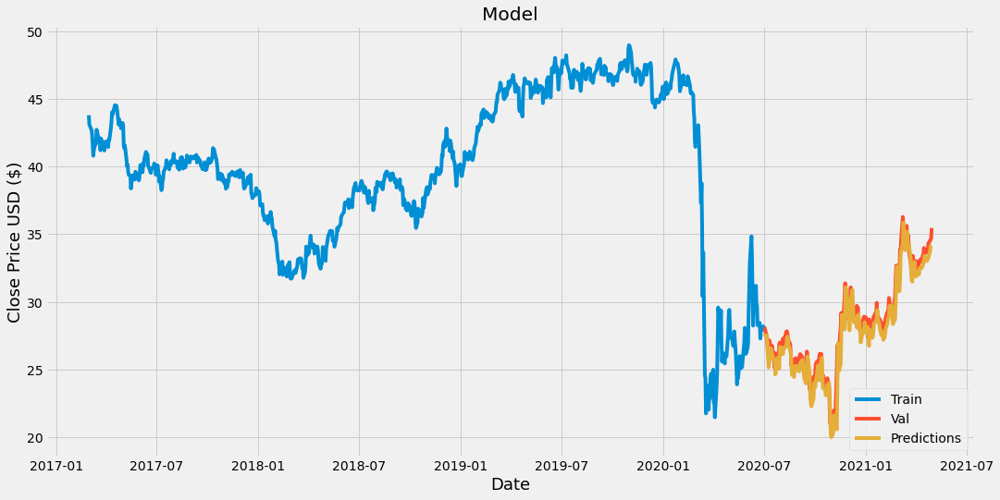

Accuracy: Close    0.020572
dtype: float64
Ticker Analyzed: AAU
(1049, 6)
Epoch 1/10
780/780 [==============================] - 19s 21ms/step - loss: 0.0038 - mse: 0.0038 - mae: 0.0431 - mape: 354837.2010
Epoch 2/10
780/780 [==============================] - 16s 21ms/step - loss: 0.0011 - mse: 0.0011 - mae: 0.0252 - mape: 43560.7466
Epoch 3/10
780/780 [==============================] - 16s 20ms/step - loss: 0.0011 - mse: 0.0011 - mae: 0.0253 - mape: 145685.8509
Epoch 4/10
780/780 [==============================] - 16s 21ms/step - loss: 8.3902e-04 - mse: 8.3902e-04 - mae: 0.0226 - mape: 65620.9579
Epoch 5/10
780/780 [==============================] - 16s 20ms/step - loss: 6.2422e-04 - mse: 6.2422e-04 - mae: 0.0188 - mape: 7442.2539
Epoch 6/10
780/780 [==============================] - 16s 21ms/step - loss: 6.0186e-04 - mse: 6.0186e-04 - mae: 0.0186 - mape: 352408.8678
Epoch 7/10
780/780 [==============================] - 16s 20ms/step - loss: 6.2680e-04 - mse: 6.2680e-04 - mae: 0.0186 -

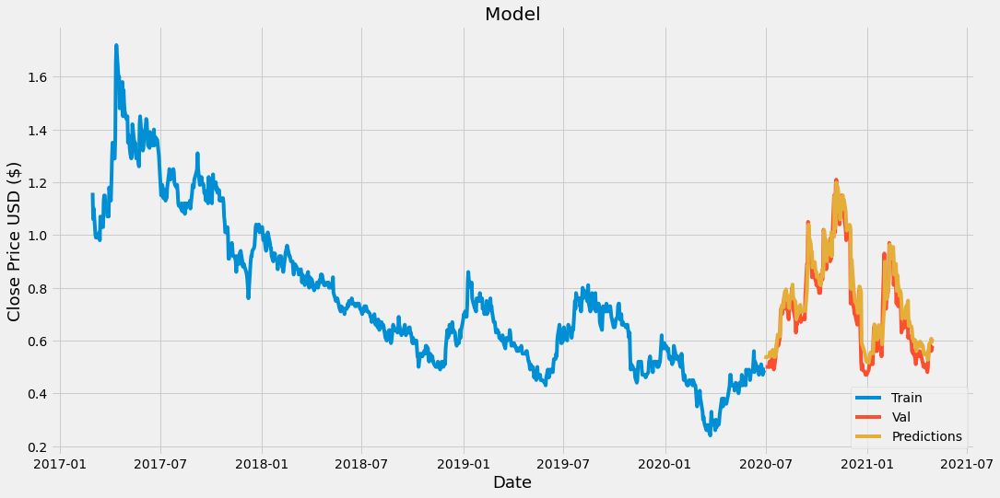

Accuracy: Close    0.020148
dtype: float64
Ticker Analyzed: AAWW
(1049, 6)
Epoch 1/10
780/780 [==============================] - 21s 24ms/step - loss: 0.0282 - mse: 0.0282 - mae: 0.0855 - mape: 147316.7510
Epoch 2/10
780/780 [==============================] - 29s 37ms/step - loss: 0.0031 - mse: 0.0031 - mae: 0.0409 - mape: 386943.0624
Epoch 3/10
780/780 [==============================] - 20s 25ms/step - loss: 0.0021 - mse: 0.0021 - mae: 0.0361 - mape: 320036.0512
Epoch 4/10
780/780 [==============================] - 17s 22ms/step - loss: 0.0018 - mse: 0.0018 - mae: 0.0314 - mape: 23462.8964
Epoch 5/10
780/780 [==============================] - 17s 22ms/step - loss: 0.0012 - mse: 0.0012 - mae: 0.0260 - mape: 652850.2330
Epoch 6/10
780/780 [==============================] - 18s 23ms/step - loss: 0.0011 - mse: 0.0011 - mae: 0.0245 - mape: 83320.3951
Epoch 7/10
780/780 [==============================] - 19s 24ms/step - loss: 8.5840e-04 - mse: 8.5840e-04 - mae: 0.0222 - mape: 134656.6340
Ep

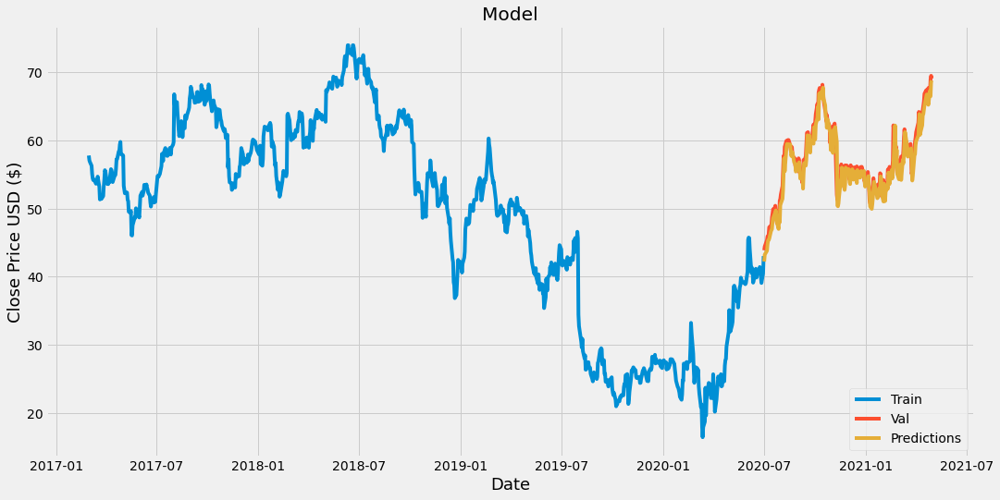

Accuracy: Close    0.013448
dtype: float64
Ticker Analyzed: AB
(1049, 6)
Epoch 1/10
780/780 [==============================] - 19s 21ms/step - loss: 0.0095 - mse: 0.0095 - mae: 0.0540 - mape: 593464.8987
Epoch 2/10
780/780 [==============================] - 16s 21ms/step - loss: 0.0014 - mse: 0.0014 - mae: 0.0263 - mape: 11303.5389
Epoch 3/10
780/780 [==============================] - 16s 20ms/step - loss: 0.0014 - mse: 0.0014 - mae: 0.0264 - mape: 415827.9324
Epoch 4/10
780/780 [==============================] - 18s 24ms/step - loss: 0.0010 - mse: 0.0010 - mae: 0.0233 - mape: 98617.3103
Epoch 5/10
780/780 [==============================] - 17s 22ms/step - loss: 7.8067e-04 - mse: 7.8067e-04 - mae: 0.0205 - mape: 353357.4458
Epoch 6/10
780/780 [==============================] - 16s 21ms/step - loss: 8.0640e-04 - mse: 8.0640e-04 - mae: 0.0199 - mape: 256816.6076
Epoch 7/10
780/780 [==============================] - 17s 22ms/step - loss: 8.2150e-04 - mse: 8.2150e-04 - mae: 0.0210 - mape: 

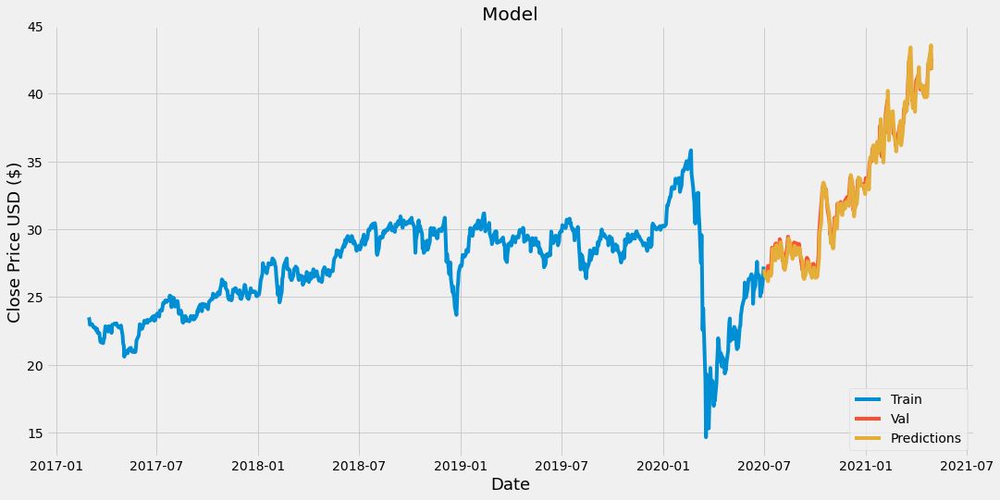

Accuracy: Close    0.006624
dtype: float64
Ticker Analyzed: ABB
(1049, 6)
Epoch 1/10
780/780 [==============================] - 18s 21ms/step - loss: 0.0094 - mse: 0.0094 - mae: 0.0591 - mape: 208131.7387
Epoch 2/10
780/780 [==============================] - 17s 21ms/step - loss: 0.0017 - mse: 0.0017 - mae: 0.0305 - mape: 74760.7492
Epoch 3/10
780/780 [==============================] - 16s 21ms/step - loss: 0.0011 - mse: 0.0011 - mae: 0.0257 - mape: 23870.0901
Epoch 4/10
780/780 [==============================] - 16s 21ms/step - loss: 8.2240e-04 - mse: 8.2240e-04 - mae: 0.0211 - mape: 13888.4727
Epoch 5/10
780/780 [==============================] - 16s 21ms/step - loss: 6.9075e-04 - mse: 6.9075e-04 - mae: 0.0198 - mape: 242471.8781
Epoch 6/10
780/780 [==============================] - 16s 21ms/step - loss: 6.0406e-04 - mse: 6.0406e-04 - mae: 0.0183 - mape: 81268.6073
Epoch 7/10
780/780 [==============================] - 16s 21ms/step - loss: 5.9760e-04 - mse: 5.9760e-04 - mae: 0.0179 -

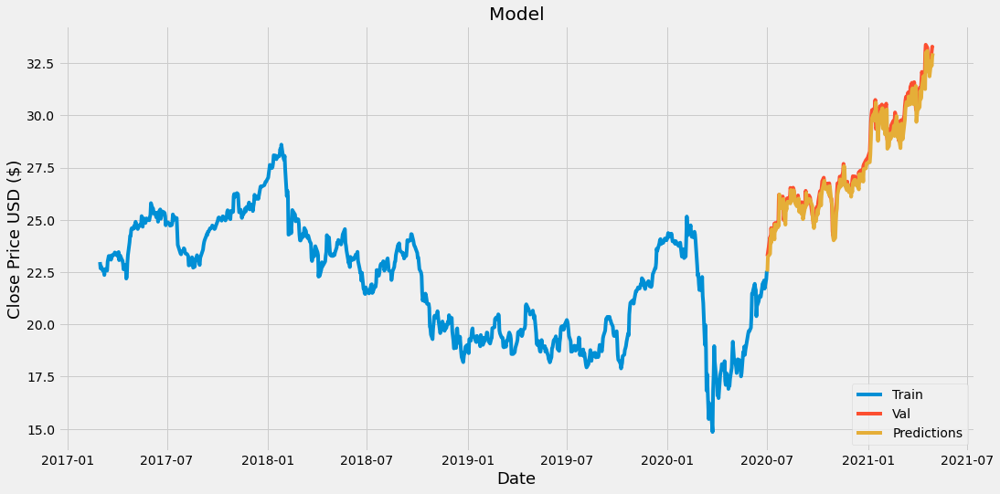

Accuracy: Close    0.013825
dtype: float64
Ticker Analyzed: ABBV
(1049, 6)
Epoch 1/10
780/780 [==============================] - 19s 21ms/step - loss: 0.0138 - mse: 0.0138 - mae: 0.0705 - mape: 29.0103
Epoch 2/10
780/780 [==============================] - 16s 21ms/step - loss: 0.0032 - mse: 0.0032 - mae: 0.0421 - mape: 19.4451
Epoch 3/10
780/780 [==============================] - 16s 21ms/step - loss: 0.0020 - mse: 0.0020 - mae: 0.0319 - mape: 13.2532
Epoch 4/10
780/780 [==============================] - 16s 21ms/step - loss: 0.0017 - mse: 0.0017 - mae: 0.0305 - mape: 17.3261
Epoch 5/10
780/780 [==============================] - 17s 22ms/step - loss: 0.0015 - mse: 0.0015 - mae: 0.0276 - mape: 11.2501
Epoch 6/10
780/780 [==============================] - 17s 22ms/step - loss: 0.0019 - mse: 0.0019 - mae: 0.0295 - mape: 14.3580
Epoch 7/10
780/780 [==============================] - 16s 21ms/step - loss: 0.0013 - mse: 0.0013 - mae: 0.0259 - mape: 14.9271
Epoch 8/10
780/780 [================

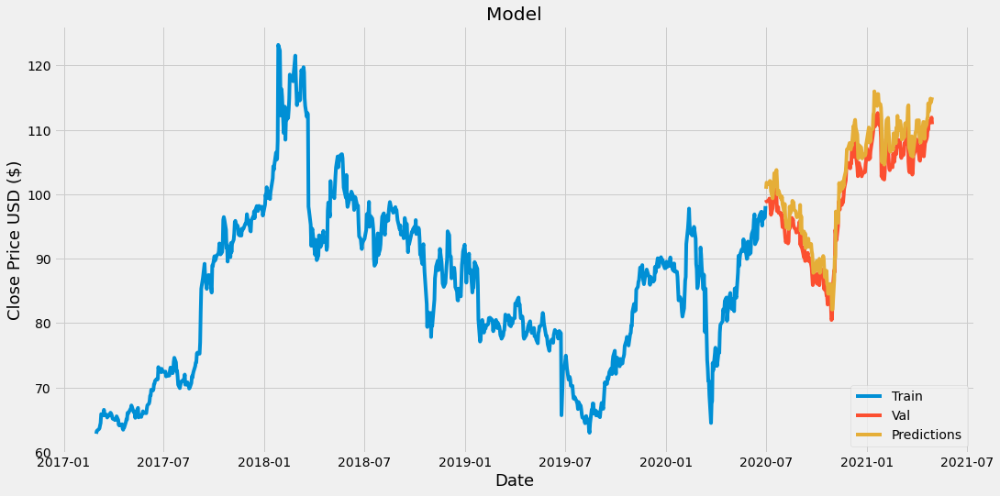

Accuracy: Close    0.042865
dtype: float64
Ticker Analyzed: ABC
(1049, 6)
Epoch 1/10
780/780 [==============================] - 18s 21ms/step - loss: 0.0092 - mse: 0.0092 - mae: 0.0710 - mape: 36361.1917
Epoch 2/10
780/780 [==============================] - 17s 22ms/step - loss: 0.0031 - mse: 0.0031 - mae: 0.0425 - mape: 108266.3210
Epoch 3/10
780/780 [==============================] - 16s 21ms/step - loss: 0.0020 - mse: 0.0020 - mae: 0.0328 - mape: 11281.7308
Epoch 4/10
780/780 [==============================] - 16s 21ms/step - loss: 0.0021 - mse: 0.0021 - mae: 0.0334 - mape: 95030.9185
Epoch 5/10
780/780 [==============================] - 16s 21ms/step - loss: 0.0015 - mse: 0.0015 - mae: 0.0305 - mape: 48036.6183
Epoch 6/10
780/780 [==============================] - 16s 21ms/step - loss: 0.0017 - mse: 0.0017 - mae: 0.0306 - mape: 81411.2664
Epoch 7/10
780/780 [==============================] - 17s 21ms/step - loss: 0.0018 - mse: 0.0018 - mae: 0.0311 - mape: 20772.3468
Epoch 8/10
780/

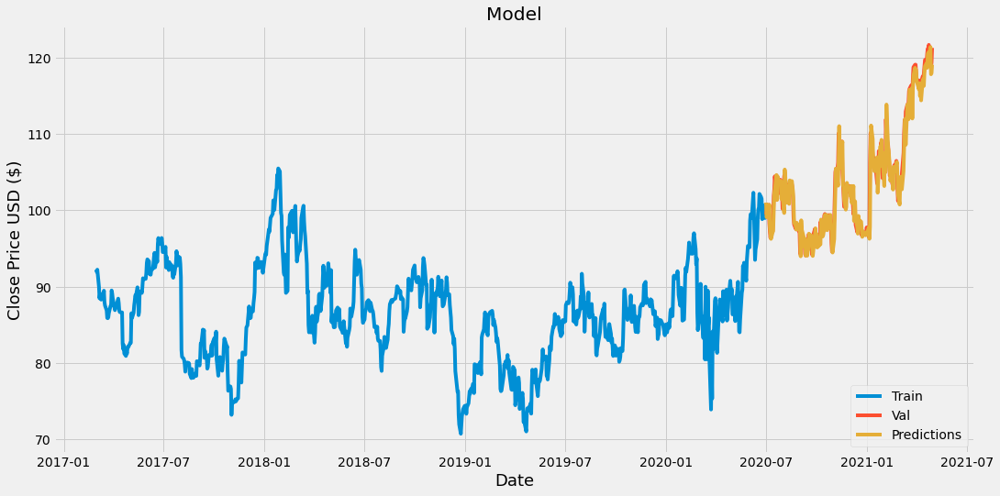

Accuracy: Close    0.005588
dtype: float64
Ticker Analyzed: ABCB
(1049, 6)
Epoch 1/10
780/780 [==============================] - 18s 21ms/step - loss: 0.0132 - mse: 0.0132 - mae: 0.0719 - mape: 144164.4195
Epoch 2/10
780/780 [==============================] - 17s 22ms/step - loss: 0.0018 - mse: 0.0018 - mae: 0.0321 - mape: 198879.9567
Epoch 3/10
780/780 [==============================] - 17s 21ms/step - loss: 0.0019 - mse: 0.0019 - mae: 0.0333 - mape: 43408.3856
Epoch 4/10
780/780 [==============================] - 18s 23ms/step - loss: 0.0013 - mse: 0.0013 - mae: 0.0276 - mape: 43369.5265
Epoch 5/10
780/780 [==============================] - 16s 21ms/step - loss: 0.0016 - mse: 0.0016 - mae: 0.0309 - mape: 33472.6806
Epoch 6/10
780/780 [==============================] - 16s 21ms/step - loss: 9.6956e-04 - mse: 9.6956e-04 - mae: 0.0242 - mape: 3360.0481
Epoch 7/10
780/780 [==============================] - 17s 22ms/step - loss: 0.0012 - mse: 0.0012 - mae: 0.0274 - mape: 333315.4169
Epoch

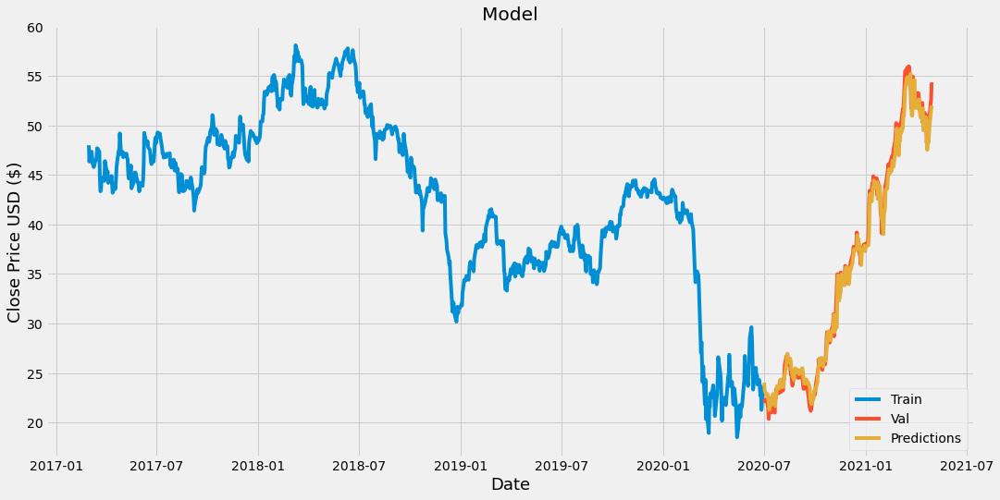

Accuracy: Close    0.005476
dtype: float64
Ticker Analyzed: ABCL
(95, 6)
Epoch 1/10
16/16 [==============================] - 2s 21ms/step - loss: 0.0413 - mse: 0.0413 - mae: 0.1568 - mape: 6261942.0100
Epoch 2/10
16/16 [==============================] - 0s 20ms/step - loss: 0.0172 - mse: 0.0172 - mae: 0.1093 - mape: 10705589.1083
Epoch 3/10
16/16 [==============================] - 0s 20ms/step - loss: 0.0145 - mse: 0.0145 - mae: 0.1022 - mape: 14525415.5359
Epoch 4/10
16/16 [==============================] - 0s 19ms/step - loss: 0.0119 - mse: 0.0119 - mae: 0.0872 - mape: 9324713.3986
Epoch 5/10
16/16 [==============================] - 0s 19ms/step - loss: 0.0124 - mse: 0.0124 - mae: 0.0978 - mape: 5347511.1101
Epoch 6/10
16/16 [==============================] - 0s 18ms/step - loss: 0.0122 - mse: 0.0122 - mae: 0.0881 - mape: 8545469.4887
Epoch 7/10
16/16 [==============================] - 0s 19ms/step - loss: 0.0135 - mse: 0.0135 - mae: 0.0995 - mape: 7360161.4795
Epoch 8/10
16/16 [====

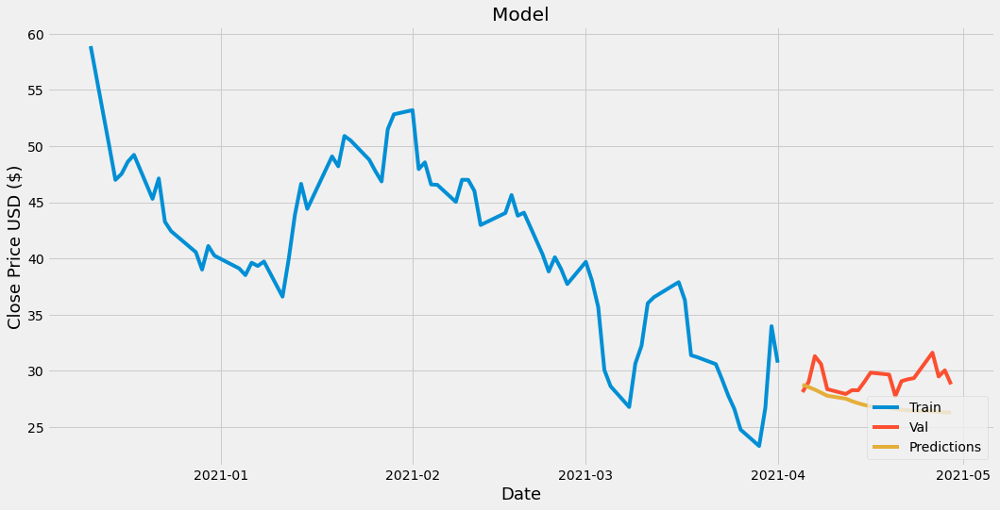

Accuracy: Close    0.059765
dtype: float64
Ticker Analyzed: ABCM
(130, 6)
Epoch 1/10
44/44 [==============================] - 3s 19ms/step - loss: 0.1707 - mse: 0.1707 - mae: 0.3183 - mape: 50.4344
Epoch 2/10
44/44 [==============================] - 1s 19ms/step - loss: 0.0229 - mse: 0.0229 - mae: 0.1206 - mape: 19.5465
Epoch 3/10
44/44 [==============================] - 1s 21ms/step - loss: 0.0254 - mse: 0.0254 - mae: 0.1262 - mape: 22.2094
Epoch 4/10
44/44 [==============================] - 1s 19ms/step - loss: 0.0210 - mse: 0.0210 - mae: 0.1150 - mape: 17.1574
Epoch 5/10
44/44 [==============================] - 1s 19ms/step - loss: 0.0260 - mse: 0.0260 - mae: 0.1298 - mape: 20.3541
Epoch 6/10
44/44 [==============================] - 1s 20ms/step - loss: 0.0168 - mse: 0.0168 - mae: 0.0979 - mape: 16.9360
Epoch 7/10
44/44 [==============================] - 1s 20ms/step - loss: 0.0248 - mse: 0.0248 - mae: 0.1247 - mape: 23.6560
Epoch 8/10
44/44 [==============================] - 1s 20m

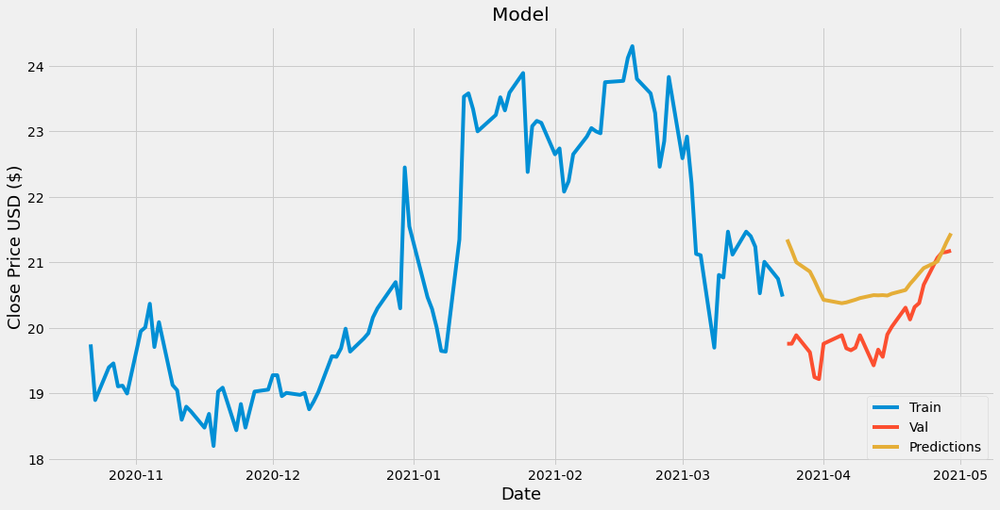

Accuracy: Close    0.115681
dtype: float64
Ticker Analyzed: ABEO
(1049, 6)
Epoch 1/10
780/780 [==============================] - 17s 19ms/step - loss: 0.0111 - mse: 0.0111 - mae: 0.0698 - mape: 28.4836
Epoch 2/10
780/780 [==============================] - 15s 19ms/step - loss: 0.0034 - mse: 0.0034 - mae: 0.0389 - mape: 15.9171
Epoch 3/10
780/780 [==============================] - 16s 21ms/step - loss: 0.0020 - mse: 0.0020 - mae: 0.0321 - mape: 13.3265
Epoch 4/10
780/780 [==============================] - 16s 21ms/step - loss: 0.0017 - mse: 0.0017 - mae: 0.0295 - mape: 13.5598
Epoch 5/10
780/780 [==============================] - 16s 21ms/step - loss: 0.0015 - mse: 0.0015 - mae: 0.0278 - mape: 12.4092
Epoch 6/10
780/780 [==============================] - 16s 20ms/step - loss: 0.0013 - mse: 0.0013 - mae: 0.0255 - mape: 10.8233
Epoch 7/10
780/780 [==============================] - 15s 20ms/step - loss: 0.0010 - mse: 0.0010 - mae: 0.0227 - mape: 8.9535
Epoch 8/10
780/780 [=================

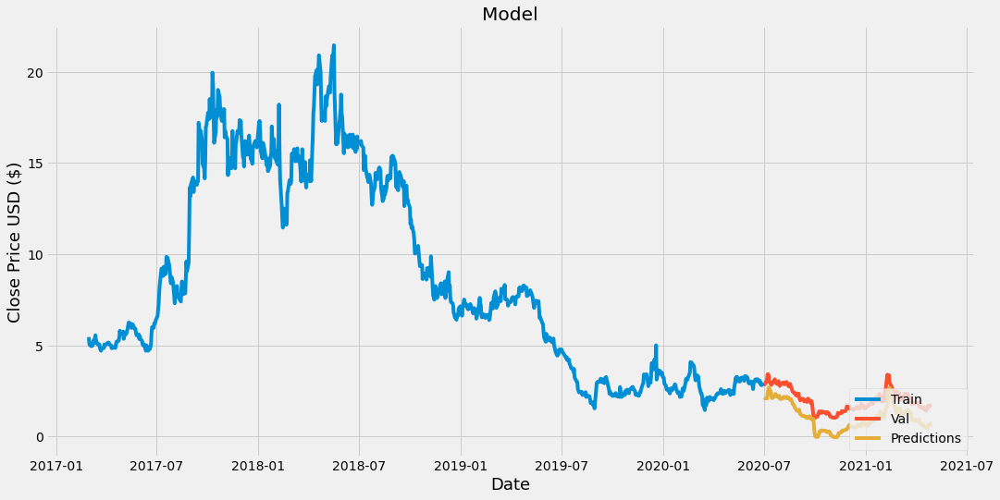

Accuracy: Close    0.04435
dtype: float64
Ticker Analyzed: ABEV
(1049, 6)
Epoch 1/10
780/780 [==============================] - 17s 20ms/step - loss: 0.0096 - mse: 0.0096 - mae: 0.0587 - mape: 50273.8929
Epoch 2/10
780/780 [==============================] - 15s 19ms/step - loss: 0.0013 - mse: 0.0013 - mae: 0.0278 - mape: 6602.3761
Epoch 3/10
780/780 [==============================] - 15s 19ms/step - loss: 0.0011 - mse: 0.0011 - mae: 0.0260 - mape: 45.0337
Epoch 4/10
780/780 [==============================] - 14s 18ms/step - loss: 8.7778e-04 - mse: 8.7778e-04 - mae: 0.0230 - mape: 53423.1744
Epoch 5/10
780/780 [==============================] - 14s 18ms/step - loss: 8.3105e-04 - mse: 8.3105e-04 - mae: 0.0225 - mape: 81198.6750
Epoch 6/10
780/780 [==============================] - 15s 19ms/step - loss: 7.4302e-04 - mse: 7.4302e-04 - mae: 0.0212 - mape: 8209.1990
Epoch 7/10
780/780 [==============================] - 14s 18ms/step - loss: 6.2766e-04 - mse: 6.2766e-04 - mae: 0.0202 - mape: 

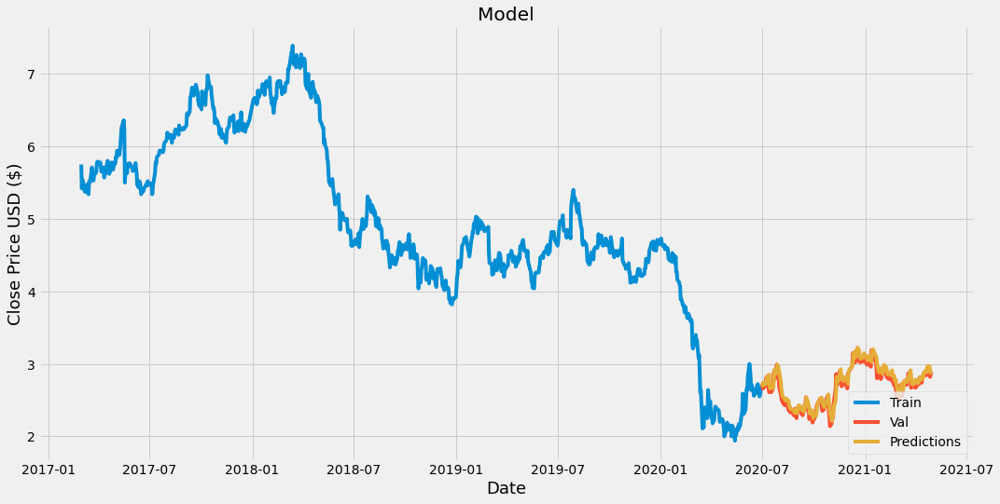

Accuracy: Close    0.006646
dtype: float64
Ticker Analyzed: ABG
(1049, 6)
Epoch 1/10
780/780 [==============================] - 17s 19ms/step - loss: 0.0024 - mse: 0.0024 - mae: 0.0309 - mape: 3805.0010
Epoch 2/10
780/780 [==============================] - 15s 19ms/step - loss: 5.0618e-04 - mse: 5.0618e-04 - mae: 0.0161 - mape: 56240.6751
Epoch 3/10
780/780 [==============================] - 15s 19ms/step - loss: 5.7579e-04 - mse: 5.7579e-04 - mae: 0.0177 - mape: 158011.6701
Epoch 4/10
780/780 [==============================] - 15s 20ms/step - loss: 4.4461e-04 - mse: 4.4461e-04 - mae: 0.0152 - mape: 27422.0923
Epoch 5/10
780/780 [==============================] - 15s 19ms/step - loss: 2.5003e-04 - mse: 2.5003e-04 - mae: 0.0123 - mape: 19754.7056
Epoch 6/10
780/780 [==============================] - 15s 19ms/step - loss: 3.4026e-04 - mse: 3.4026e-04 - mae: 0.0137 - mape: 126948.5195
Epoch 7/10
780/780 [==============================] - 15s 19ms/step - loss: 2.4108e-04 - mse: 2.4108e-04 

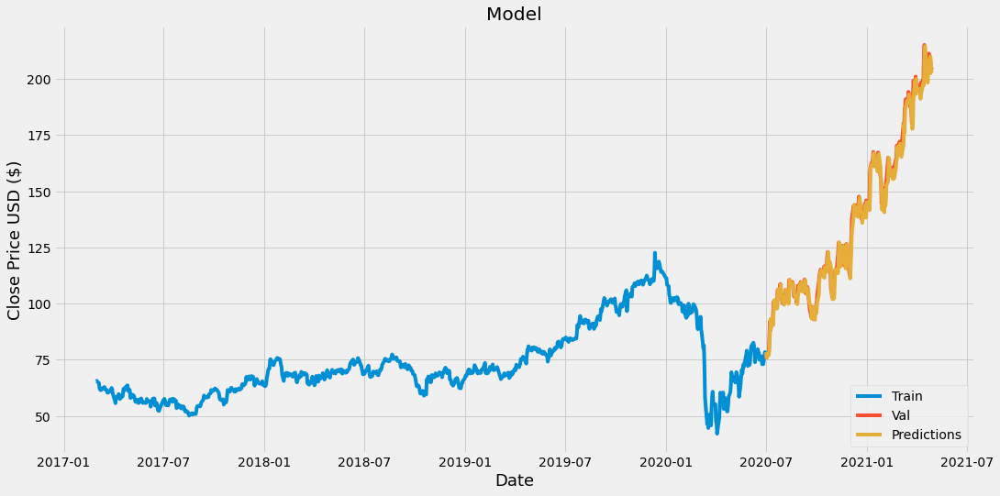

Accuracy: Close    0.00772
dtype: float64
Ticker Analyzed: ABIO
(1049, 6)
Epoch 1/10
780/780 [==============================] - 18s 20ms/step - loss: 0.0060 - mse: 0.0060 - mae: 0.0510 - mape: 65797.6791
Epoch 2/10
780/780 [==============================] - 15s 19ms/step - loss: 0.0023 - mse: 0.0023 - mae: 0.0316 - mape: 228.4097
Epoch 3/10
780/780 [==============================] - 15s 19ms/step - loss: 0.0020 - mse: 0.0020 - mae: 0.0291 - mape: 1460.8638
Epoch 4/10
780/780 [==============================] - 15s 19ms/step - loss: 0.0016 - mse: 0.0016 - mae: 0.0237 - mape: 19474.7959
Epoch 5/10
780/780 [==============================] - 15s 20ms/step - loss: 0.0011 - mse: 0.0011 - mae: 0.0202 - mape: 20966.4542
Epoch 6/10
780/780 [==============================] - 15s 19ms/step - loss: 0.0018 - mse: 0.0018 - mae: 0.0227 - mape: 102.6398
Epoch 7/10
780/780 [==============================] - 15s 19ms/step - loss: 8.5098e-04 - mse: 8.5098e-04 - mae: 0.0181 - mape: 1022.0076
Epoch 8/10
780

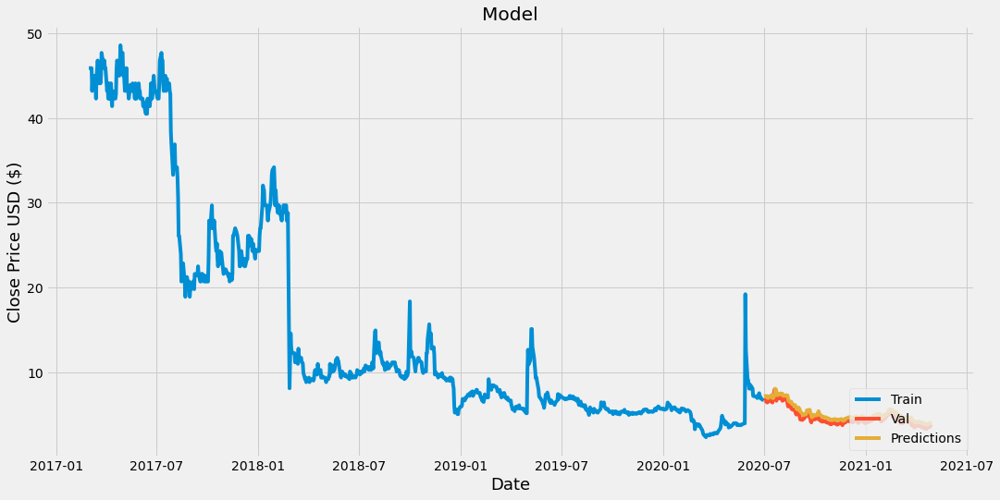

Accuracy: Close    0.010338
dtype: float64
Ticker Analyzed: ABM
(1049, 6)
Epoch 1/10
780/780 [==============================] - 17s 20ms/step - loss: 0.0106 - mse: 0.0106 - mae: 0.0659 - mape: 51671.7089
Epoch 2/10
780/780 [==============================] - 15s 20ms/step - loss: 0.0023 - mse: 0.0023 - mae: 0.0368 - mape: 76260.1945
Epoch 3/10
780/780 [==============================] - 16s 20ms/step - loss: 0.0025 - mse: 0.0025 - mae: 0.0342 - mape: 407309.7475
Epoch 4/10
780/780 [==============================] - 16s 20ms/step - loss: 0.0013 - mse: 0.0013 - mae: 0.0263 - mape: 85461.9262
Epoch 5/10
780/780 [==============================] - 15s 19ms/step - loss: 0.0012 - mse: 0.0012 - mae: 0.0249 - mape: 61572.3587
Epoch 6/10
780/780 [==============================] - 15s 19ms/step - loss: 0.0011 - mse: 0.0011 - mae: 0.0238 - mape: 6205.9200
Epoch 7/10
780/780 [==============================] - 15s 20ms/step - loss: 8.8121e-04 - mse: 8.8121e-04 - mae: 0.0219 - mape: 26391.6574
Epoch 8/

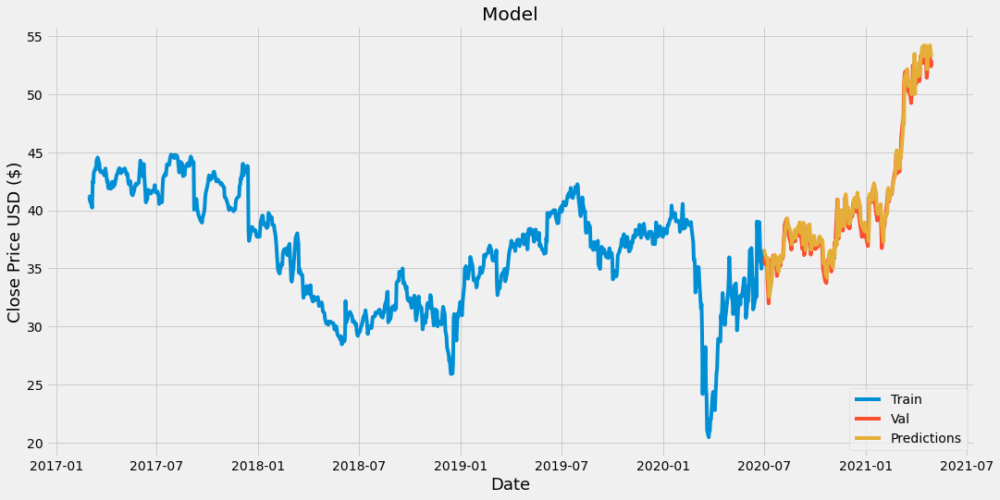

Accuracy: Close    0.008976
dtype: float64
Ticker Analyzed: ABMD
(1049, 6)
Epoch 1/10
780/780 [==============================] - 22s 26ms/step - loss: 0.0132 - mse: 0.0132 - mae: 0.0720 - mape: 23.7958
Epoch 2/10
780/780 [==============================] - 23s 29ms/step - loss: 0.0033 - mse: 0.0033 - mae: 0.0403 - mape: 13.1558
Epoch 3/10
780/780 [==============================] - 27s 34ms/step - loss: 0.0019 - mse: 0.0019 - mae: 0.0310 - mape: 11.5651
Epoch 4/10
780/780 [==============================] - 28s 36ms/step - loss: 0.0014 - mse: 0.0014 - mae: 0.0274 - mape: 9.3792
Epoch 5/10
780/780 [==============================] - 31s 39ms/step - loss: 0.0015 - mse: 0.0015 - mae: 0.0274 - mape: 9.8415
Epoch 6/10
780/780 [==============================] - 32s 41ms/step - loss: 0.0012 - mse: 0.0012 - mae: 0.0256 - mape: 8.1618
Epoch 7/10
780/780 [==============================] - 34s 43ms/step - loss: 8.4785e-04 - mse: 8.4785e-04 - mae: 0.0195 - mape: 6.7280
Epoch 8/10
780/780 [============

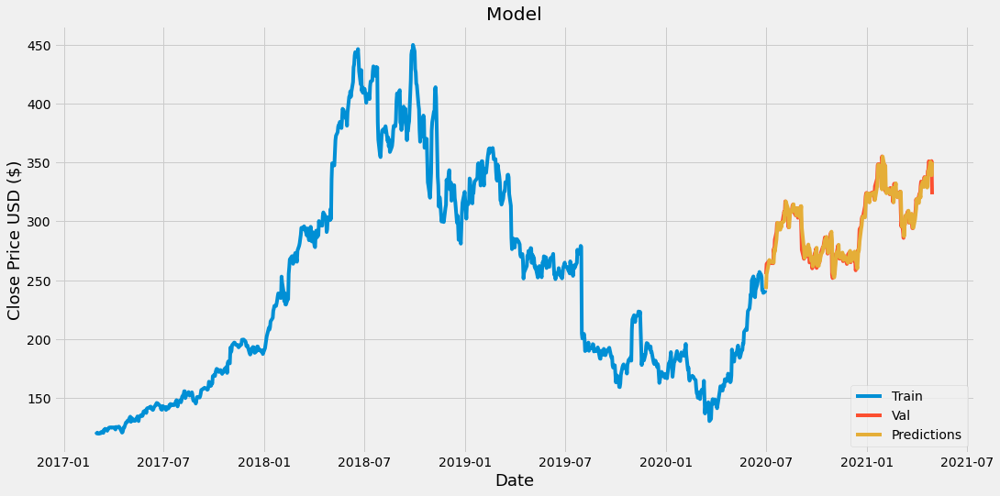

Accuracy: Close    0.000257
dtype: float64
Ticker Analyzed: ABNB
(96, 6)
Epoch 1/10
17/17 [==============================] - 5s 46ms/step - loss: 0.1872 - mse: 0.1872 - mae: 0.3640 - mape: 53.2643
Epoch 2/10
17/17 [==============================] - 1s 44ms/step - loss: 0.0193 - mse: 0.0193 - mae: 0.1054 - mape: 14.3733
Epoch 3/10
17/17 [==============================] - 1s 43ms/step - loss: 0.0261 - mse: 0.0261 - mae: 0.1271 - mape: 16.5785
Epoch 4/10
17/17 [==============================] - 1s 44ms/step - loss: 0.0083 - mse: 0.0083 - mae: 0.0774 - mape: 10.6754
Epoch 5/10
17/17 [==============================] - 1s 44ms/step - loss: 0.0251 - mse: 0.0251 - mae: 0.1406 - mape: 18.9590
Epoch 6/10
17/17 [==============================] - 1s 47ms/step - loss: 0.0237 - mse: 0.0237 - mae: 0.1375 - mape: 20.3329
Epoch 7/10
17/17 [==============================] - 1s 43ms/step - loss: 0.0138 - mse: 0.0138 - mae: 0.1015 - mape: 14.6517
Epoch 8/10
17/17 [==============================] - 1s 44ms

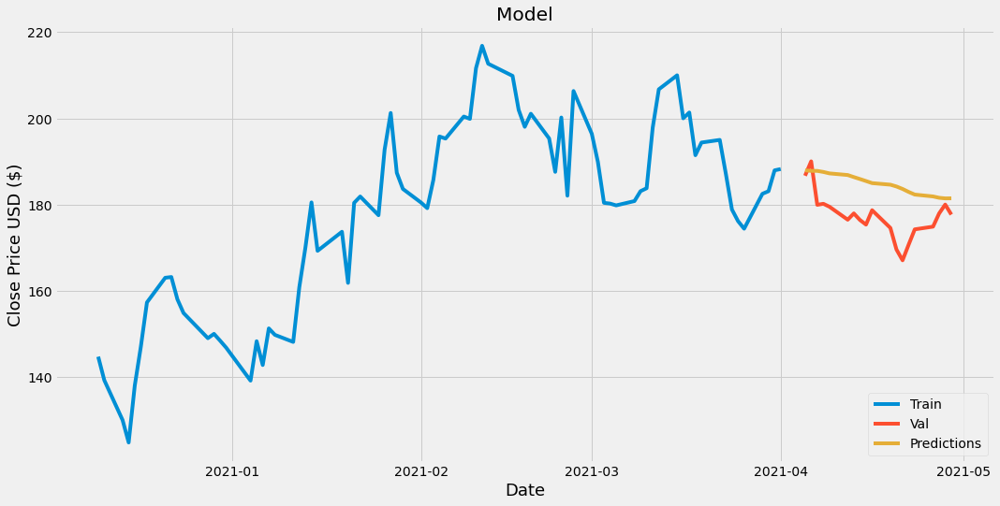

Accuracy: Close    0.082374
dtype: float64
Ticker Analyzed: ABR
(1049, 6)
Epoch 1/10
780/780 [==============================] - 40s 46ms/step - loss: 0.0097 - mse: 0.0097 - mae: 0.0580 - mape: 62604.2081
Epoch 2/10
780/780 [==============================] - 35s 45ms/step - loss: 0.0019 - mse: 0.0019 - mae: 0.0292 - mape: 229843.2019
Epoch 3/10
780/780 [==============================] - 35s 45ms/step - loss: 0.0011 - mse: 0.0011 - mae: 0.0221 - mape: 7902.6699
Epoch 4/10
780/780 [==============================] - 55s 71ms/step - loss: 9.7449e-04 - mse: 9.7449e-04 - mae: 0.0222 - mape: 146102.2568
Epoch 5/10
780/780 [==============================] - 91s 116ms/step - loss: 8.5947e-04 - mse: 8.5947e-04 - mae: 0.0205 - mape: 14695.8760
Epoch 6/10
780/780 [==============================] - 16s 21ms/step - loss: 8.2381e-04 - mse: 8.2381e-04 - mae: 0.0198 - mape: 4891.1191
Epoch 7/10
780/780 [==============================] - 926s 1s/step - loss: 7.0059e-04 - mse: 7.0059e-04 - mae: 0.0182 - m

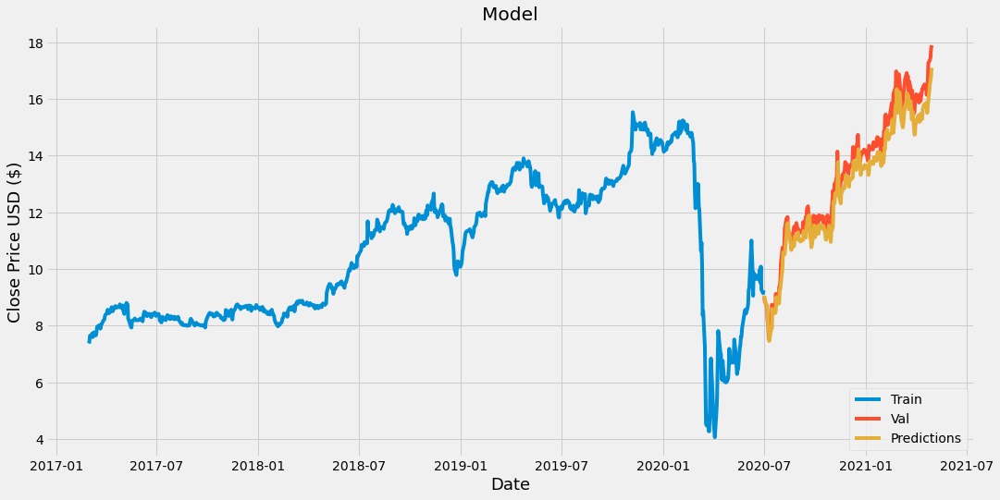

Accuracy: Close    0.03416
dtype: float64
Error on ABR^A!
Error on ABR^B!
Error on ABR^C!
Ticker Analyzed: ABST
(1049, 6)
Epoch 1/10
780/780 [==============================] - 18s 20ms/step - loss: 0.0019 - mse: 0.0019 - mae: 0.0298 - mape: 122430.1043
Epoch 2/10
780/780 [==============================] - 16s 21ms/step - loss: 4.4983e-04 - mse: 4.4983e-04 - mae: 0.0156 - mape: 4543.9208
Epoch 3/10
780/780 [==============================] - 17s 22ms/step - loss: 2.9288e-04 - mse: 2.9288e-04 - mae: 0.0124 - mape: 30025.3049
Epoch 4/10
780/780 [==============================] - 16s 21ms/step - loss: 2.2564e-04 - mse: 2.2564e-04 - mae: 0.0112 - mape: 6730.7209
Epoch 5/10
780/780 [==============================] - 17s 21ms/step - loss: 2.3093e-04 - mse: 2.3093e-04 - mae: 0.0109 - mape: 6301.3411
Epoch 6/10
780/780 [==============================] - 16s 21ms/step - loss: 1.9299e-04 - mse: 1.9299e-04 - mae: 0.0101 - mape: 21836.0059
Epoch 7/10
780/780 [==============================] - 17s 22

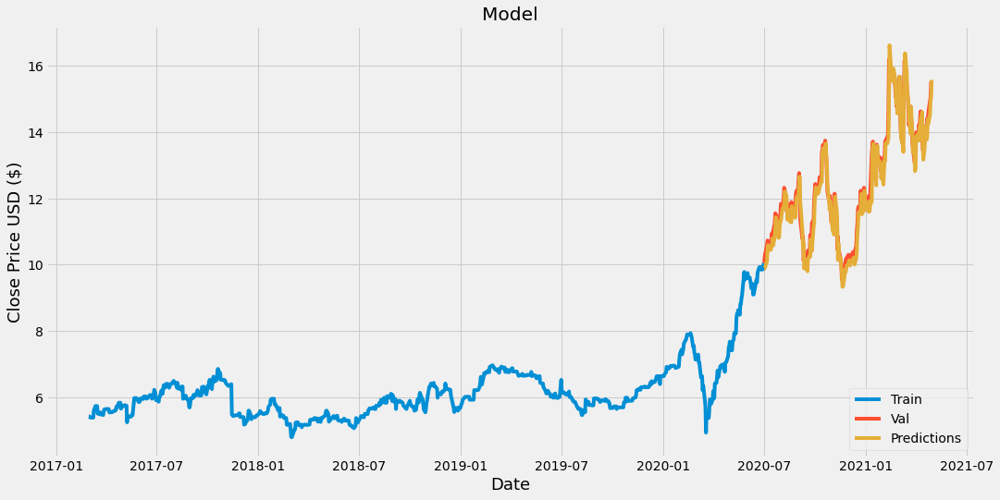

Accuracy: Close    0.015176
dtype: float64
Ticker Analyzed: ABT
(1049, 6)
Epoch 1/10
780/780 [==============================] - 18s 20ms/step - loss: 0.0074 - mse: 0.0074 - mae: 0.0460 - mape: 16.3359
Epoch 2/10
780/780 [==============================] - 16s 20ms/step - loss: 0.0011 - mse: 0.0011 - mae: 0.0238 - mape: 9.9243
Epoch 3/10
780/780 [==============================] - 18s 23ms/step - loss: 8.2800e-04 - mse: 8.2800e-04 - mae: 0.0211 - mape: 8.5852
Epoch 4/10
780/780 [==============================] - 17s 21ms/step - loss: 5.9296e-04 - mse: 5.9296e-04 - mae: 0.0182 - mape: 6.9493
Epoch 5/10
780/780 [==============================] - 16s 20ms/step - loss: 5.5987e-04 - mse: 5.5987e-04 - mae: 0.0172 - mape: 6.2584
Epoch 6/10
780/780 [==============================] - 17s 22ms/step - loss: 4.2060e-04 - mse: 4.2060e-04 - mae: 0.0156 - mape: 6.4261
Epoch 7/10
780/780 [==============================] - 15s 19ms/step - loss: 3.7990e-04 - mse: 3.7990e-04 - mae: 0.0145 - mape: 5.8728
Epo

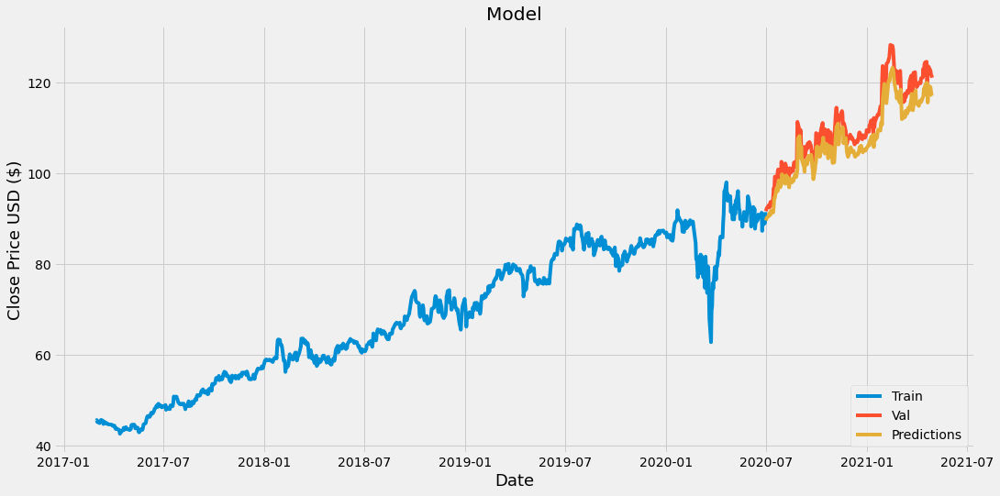

Accuracy: Close    0.039591
dtype: float64
Ticker Analyzed: ABTX
(1049, 6)
Epoch 1/10
780/780 [==============================] - 19s 20ms/step - loss: 0.0109 - mse: 0.0109 - mae: 0.0694 - mape: 86450.6135
Epoch 2/10
780/780 [==============================] - 16s 20ms/step - loss: 0.0023 - mse: 0.0023 - mae: 0.0368 - mape: 152017.7060
Epoch 3/10
780/780 [==============================] - 16s 21ms/step - loss: 0.0019 - mse: 0.0019 - mae: 0.0323 - mape: 139181.6924
Epoch 4/10
780/780 [==============================] - 17s 22ms/step - loss: 0.0017 - mse: 0.0017 - mae: 0.0319 - mape: 114912.7020
Epoch 5/10
780/780 [==============================] - 17s 21ms/step - loss: 0.0014 - mse: 0.0014 - mae: 0.0287 - mape: 14427.5964
Epoch 6/10
780/780 [==============================] - 17s 21ms/step - loss: 0.0013 - mse: 0.0013 - mae: 0.0280 - mape: 154569.6010
Epoch 7/10
780/780 [==============================] - 17s 21ms/step - loss: 0.0014 - mse: 0.0014 - mae: 0.0280 - mape: 589.5837
Epoch 8/10
78

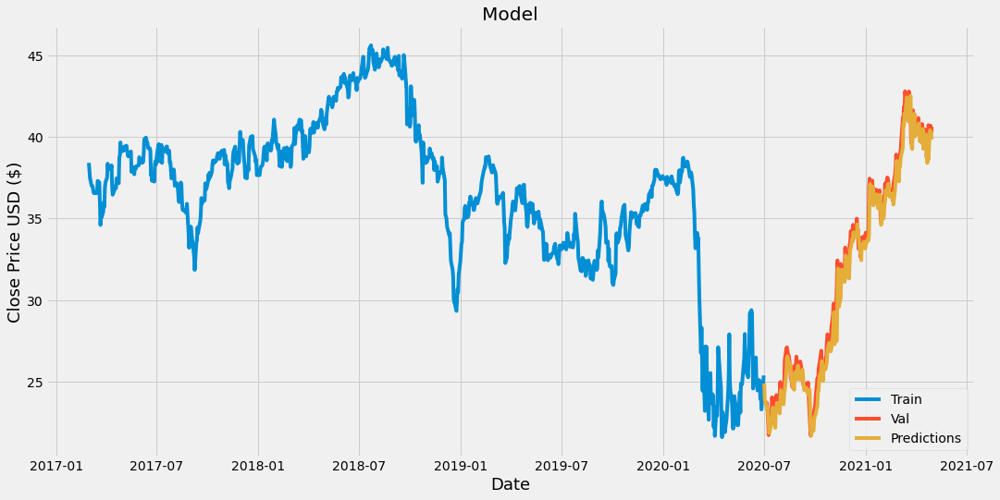

Accuracy: Close    0.017742
dtype: float64
Ticker Analyzed: ABUS
(1049, 6)
Epoch 1/10
780/780 [==============================] - 17s 20ms/step - loss: 0.0099 - mse: 0.0099 - mae: 0.0559 - mape: 92732.6528
Epoch 2/10
780/780 [==============================] - 16s 20ms/step - loss: 0.0024 - mse: 0.0024 - mae: 0.0330 - mape: 11578.1165
Epoch 3/10
780/780 [==============================] - 16s 21ms/step - loss: 0.0012 - mse: 0.0012 - mae: 0.0236 - mape: 72475.2970
Epoch 4/10
780/780 [==============================] - 16s 21ms/step - loss: 0.0018 - mse: 0.0018 - mae: 0.0291 - mape: 18573.2339
Epoch 5/10
780/780 [==============================] - 17s 22ms/step - loss: 0.0027 - mse: 0.0027 - mae: 0.0290 - mape: 77477.2412
Epoch 6/10
780/780 [==============================] - 17s 21ms/step - loss: 9.1860e-04 - mse: 9.1860e-04 - mae: 0.0214 - mape: 28558.9516
Epoch 7/10
780/780 [==============================] - 16s 21ms/step - loss: 0.0014 - mse: 0.0014 - mae: 0.0236 - mape: 84348.6194
Epoch 8

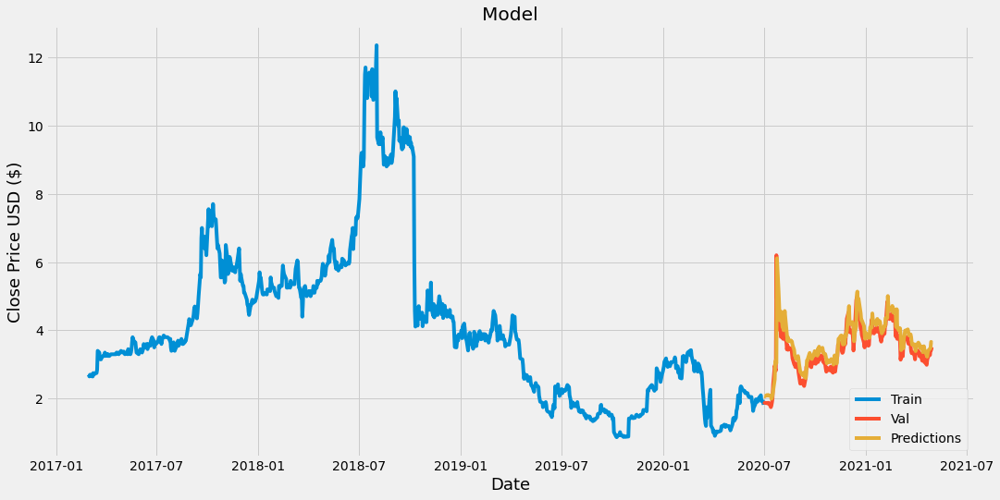

Accuracy: Close    0.018974
dtype: float64
Ticker Analyzed: AC
(1049, 6)
Epoch 1/10
780/780 [==============================] - 18s 20ms/step - loss: 0.0073 - mse: 0.0073 - mae: 0.0568 - mape: 1329852.7804
Epoch 2/10
780/780 [==============================] - 17s 22ms/step - loss: 0.0025 - mse: 0.0025 - mae: 0.0350 - mape: 157328.7338
Epoch 3/10
780/780 [==============================] - 16s 20ms/step - loss: 0.0023 - mse: 0.0023 - mae: 0.0337 - mape: 366601.7635
Epoch 4/10
780/780 [==============================] - 16s 20ms/step - loss: 0.0017 - mse: 0.0017 - mae: 0.0280 - mape: 714232.8334
Epoch 5/10
780/780 [==============================] - 18s 23ms/step - loss: 0.0026 - mse: 0.0026 - mae: 0.0321 - mape: 226994.8602
Epoch 6/10
780/780 [==============================] - 17s 22ms/step - loss: 0.0010 - mse: 0.0010 - mae: 0.0217 - mape: 253875.9005
Epoch 7/10
780/780 [==============================] - 17s 22ms/step - loss: 0.0021 - mse: 0.0021 - mae: 0.0306 - mape: 149339.8166
Epoch 8/1

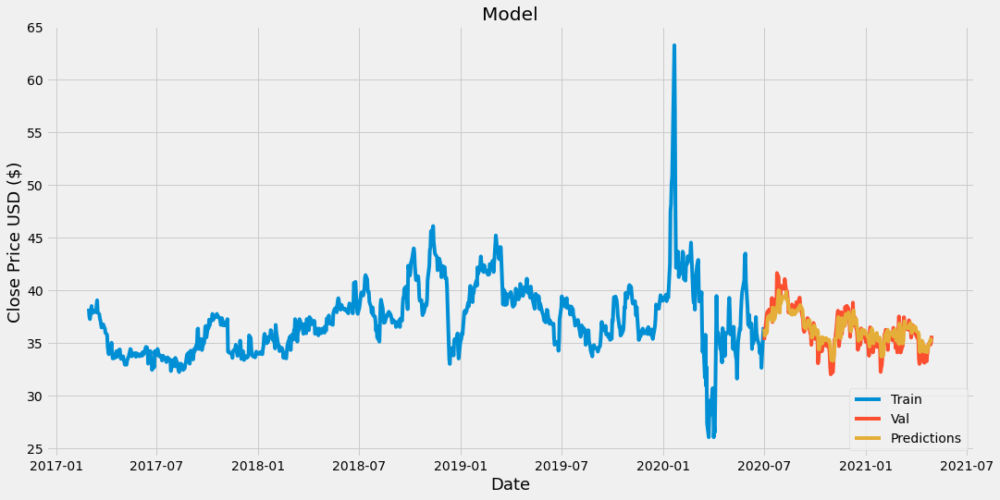

Accuracy: Close    0.002791
dtype: float64
Ticker Analyzed: ACA
(624, 6)
Epoch 1/10
440/440 [==============================] - 10s 18ms/step - loss: 0.0067 - mse: 0.0067 - mae: 0.0568 - mape: 19.0913
Epoch 2/10
440/440 [==============================] - 8s 18ms/step - loss: 0.0021 - mse: 0.0021 - mae: 0.0347 - mape: 11.6797
Epoch 3/10
440/440 [==============================] - 8s 19ms/step - loss: 0.0019 - mse: 0.0019 - mae: 0.0343 - mape: 11.2378
Epoch 4/10
440/440 [==============================] - 10s 22ms/step - loss: 0.0012 - mse: 0.0012 - mae: 0.0259 - mape: 8.5608
Epoch 5/10
440/440 [==============================] - 9s 20ms/step - loss: 0.0011 - mse: 0.0011 - mae: 0.0253 - mape: 8.1824
Epoch 6/10
440/440 [==============================] - 9s 20ms/step - loss: 0.0011 - mse: 0.0011 - mae: 0.0250 - mape: 8.2329
Epoch 7/10
440/440 [==============================] - 9s 20ms/step - loss: 0.0010 - mse: 0.0010 - mae: 0.0225 - mape: 7.4303
Epoch 8/10
440/440 [===========================

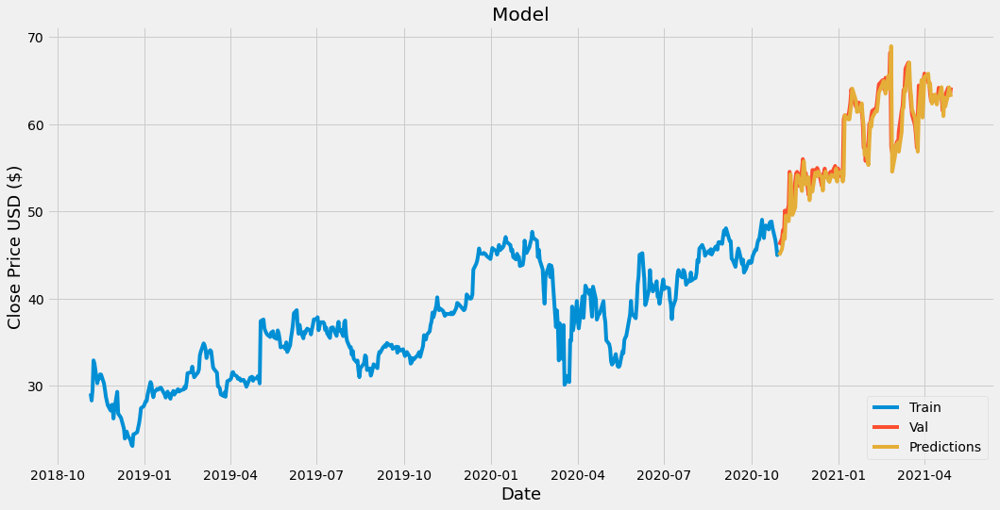

Accuracy: Close    0.009768
dtype: float64
Ticker Analyzed: ACAC
(89, 6)
Epoch 1/10
12/12 [==============================] - 2s 24ms/step - loss: 0.0012 - mse: 0.0012 - mae: 0.0256 - mape: 5701444.0239 
Epoch 2/10
12/12 [==============================] - 0s 23ms/step - loss: 0.0012 - mse: 0.0012 - mae: 0.0280 - mape: 3770925.8835 
Epoch 3/10
12/12 [==============================] - 0s 23ms/step - loss: 0.0015 - mse: 0.0015 - mae: 0.0306 - mape: 1909406.9216
Epoch 4/10
12/12 [==============================] - 0s 22ms/step - loss: 0.0014 - mse: 0.0014 - mae: 0.0267 - mape: 758030.7223
Epoch 5/10
12/12 [==============================] - 0s 21ms/step - loss: 0.0018 - mse: 0.0018 - mae: 0.0357 - mape: 1587664.9577
Epoch 6/10
12/12 [==============================] - 0s 27ms/step - loss: 0.0020 - mse: 0.0020 - mae: 0.0349 - mape: 2511699.4607
Epoch 7/10
12/12 [==============================] - 0s 30ms/step - loss: 0.0017 - mse: 0.0017 - mae: 0.0355 - mape: 7246832.0032
Epoch 8/10
12/12 [=====

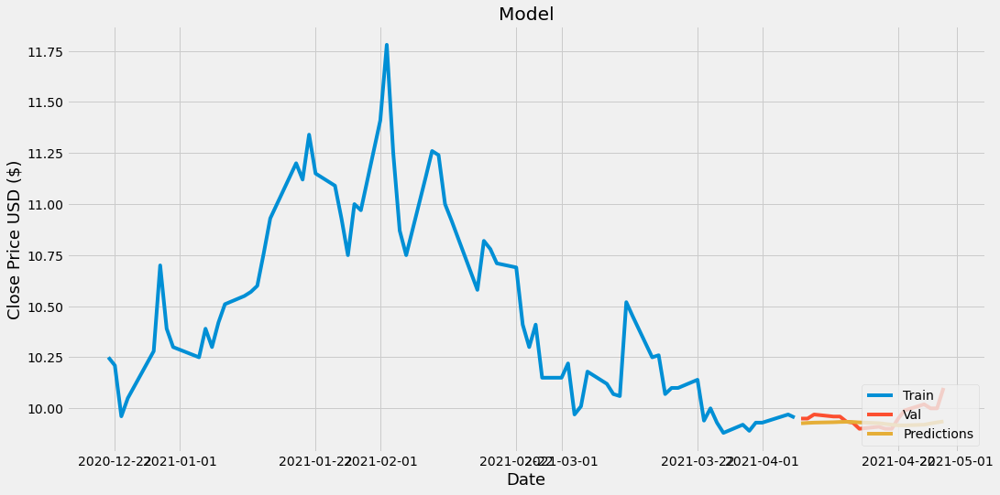

Accuracy: Close    0.017236
dtype: float64
Ticker Analyzed: ACACU
(129, 6)
Epoch 1/10
44/44 [==============================] - 3s 22ms/step - loss: 0.0642 - mse: 0.0642 - mae: 0.2051 - mape: 49.8373
Epoch 2/10
44/44 [==============================] - 1s 19ms/step - loss: 0.0178 - mse: 0.0178 - mae: 0.1059 - mape: 27.5433
Epoch 3/10
44/44 [==============================] - 1s 18ms/step - loss: 0.0182 - mse: 0.0182 - mae: 0.1102 - mape: 24.2193
Epoch 4/10
44/44 [==============================] - 1s 18ms/step - loss: 0.0350 - mse: 0.0350 - mae: 0.1394 - mape: 28.4432
Epoch 5/10
44/44 [==============================] - 1s 20ms/step - loss: 0.0192 - mse: 0.0192 - mae: 0.1051 - mape: 28.8289
Epoch 6/10
44/44 [==============================] - 1s 20ms/step - loss: 0.0162 - mse: 0.0162 - mae: 0.1043 - mape: 25.2652
Epoch 7/10
44/44 [==============================] - 1s 18ms/step - loss: 0.0087 - mse: 0.0087 - mae: 0.0705 - mape: 17.6435
Epoch 8/10
44/44 [==============================] - 1s 18

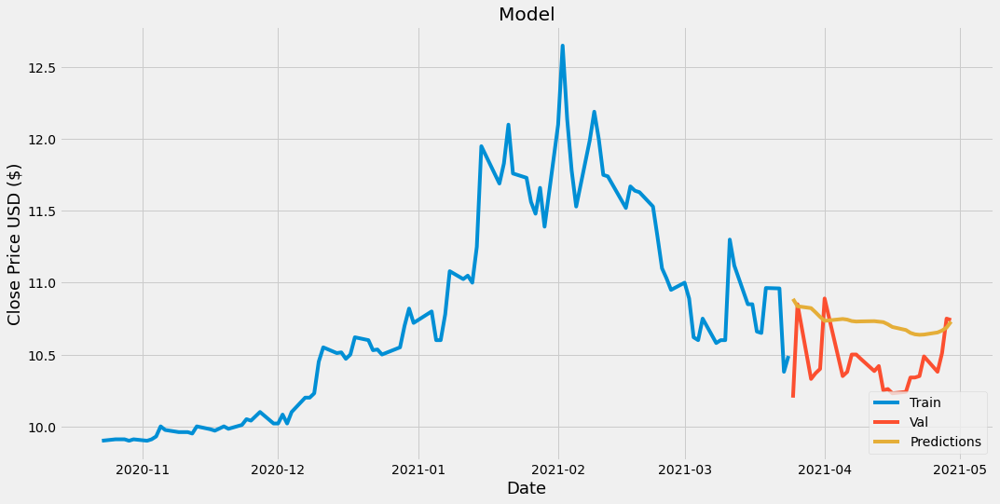

Accuracy: Close    0.104195
dtype: float64
Ticker Analyzed: ACACW
(90, 6)
Epoch 1/10
12/12 [==============================] - 2s 20ms/step - loss: 0.0208 - mse: 0.0208 - mae: 0.1353 - mape: 88.2705
Epoch 2/10
12/12 [==============================] - 0s 20ms/step - loss: 0.0099 - mse: 0.0099 - mae: 0.0865 - mape: 39.3940
Epoch 3/10
12/12 [==============================] - 0s 18ms/step - loss: 0.0090 - mse: 0.0090 - mae: 0.0841 - mape: 70.9476
Epoch 4/10
12/12 [==============================] - 0s 18ms/step - loss: 0.0083 - mse: 0.0083 - mae: 0.0753 - mape: 71.5697
Epoch 5/10
12/12 [==============================] - 0s 18ms/step - loss: 0.0056 - mse: 0.0056 - mae: 0.0631 - mape: 37.9709
Epoch 6/10
12/12 [==============================] - 0s 19ms/step - loss: 0.0059 - mse: 0.0059 - mae: 0.0654 - mape: 54.2066
Epoch 7/10
12/12 [==============================] - 0s 18ms/step - loss: 0.0055 - mse: 0.0055 - mae: 0.0653 - mape: 36.1520
Epoch 8/10
12/12 [==============================] - 0s 18m

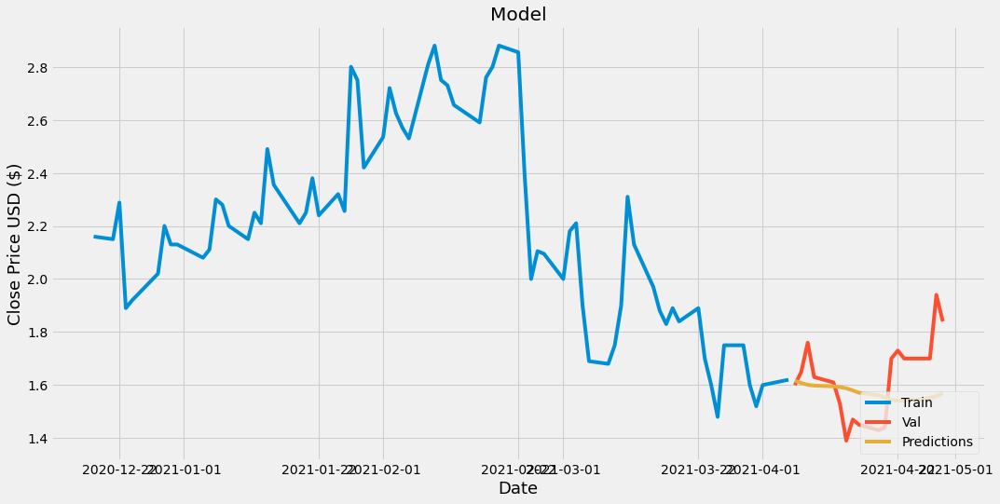

Accuracy: Close    0.035614
dtype: float64
Ticker Analyzed: ACAD
(1049, 6)
Epoch 1/10
780/780 [==============================] - 17s 20ms/step - loss: 0.0082 - mse: 0.0082 - mae: 0.0607 - mape: 54728.4011
Epoch 2/10
780/780 [==============================] - 15s 20ms/step - loss: 0.0038 - mse: 0.0038 - mae: 0.0426 - mape: 19555.2116
Epoch 3/10
780/780 [==============================] - 17s 22ms/step - loss: 0.0020 - mse: 0.0020 - mae: 0.0306 - mape: 27668.4277
Epoch 4/10
780/780 [==============================] - 17s 22ms/step - loss: 0.0016 - mse: 0.0016 - mae: 0.0272 - mape: 3823.6233
Epoch 5/10
780/780 [==============================] - 16s 20ms/step - loss: 0.0013 - mse: 0.0013 - mae: 0.0268 - mape: 17703.8976
Epoch 6/10
780/780 [==============================] - 20s 26ms/step - loss: 0.0013 - mse: 0.0013 - mae: 0.0252 - mape: 9311.5929
Epoch 7/10
780/780 [==============================] - 16s 21ms/step - loss: 0.0013 - mse: 0.0013 - mae: 0.0246 - mape: 148914.4684
Epoch 8/10
780/7

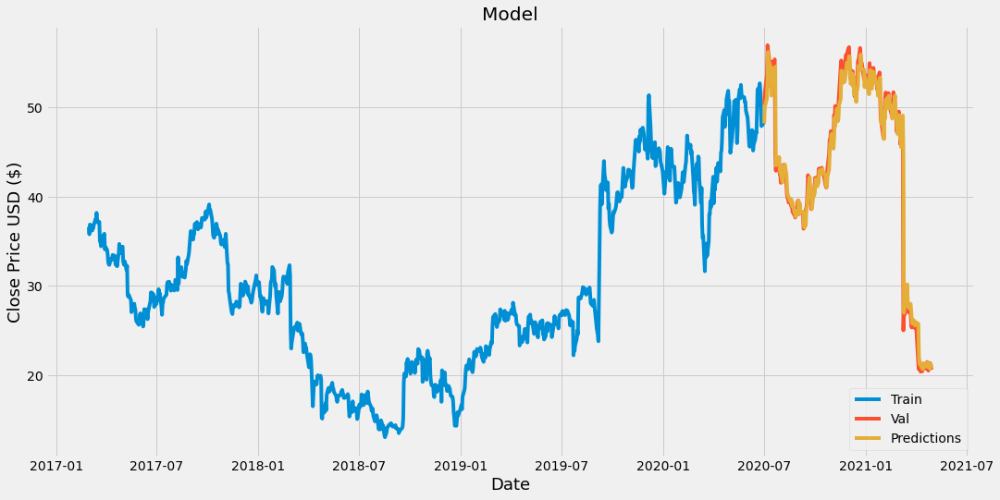

Accuracy: Close    0.001912
dtype: float64
Ticker Analyzed: ACB
(1049, 6)
Epoch 1/10
780/780 [==============================] - 17s 19ms/step - loss: 0.0113 - mse: 0.0113 - mae: 0.0686 - mape: 29.8529
Epoch 2/10
780/780 [==============================] - 15s 19ms/step - loss: 0.0023 - mse: 0.0023 - mae: 0.0345 - mape: 11.1255
Epoch 3/10
780/780 [==============================] - 15s 19ms/step - loss: 0.0024 - mse: 0.0024 - mae: 0.0365 - mape: 14.2586
Epoch 4/10
780/780 [==============================] - 15s 19ms/step - loss: 0.0018 - mse: 0.0018 - mae: 0.0302 - mape: 11.9477
Epoch 5/10
780/780 [==============================] - 15s 19ms/step - loss: 0.0014 - mse: 0.0014 - mae: 0.0251 - mape: 10.1809
Epoch 6/10
780/780 [==============================] - 15s 19ms/step - loss: 0.0012 - mse: 0.0012 - mae: 0.0251 - mape: 9.6735
Epoch 7/10
780/780 [==============================] - 15s 19ms/step - loss: 0.0011 - mse: 0.0011 - mae: 0.0239 - mape: 10.5391
Epoch 8/10
780/780 [==================

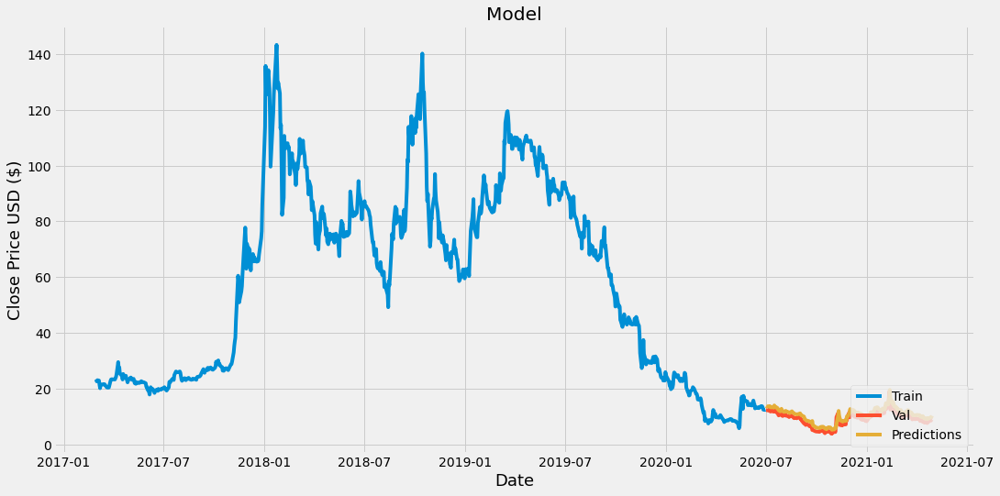

Accuracy: Close    0.009821
dtype: float64
Ticker Analyzed: ACBI
(1049, 6)
Epoch 1/10
780/780 [==============================] - 16s 18ms/step - loss: 0.0088 - mse: 0.0088 - mae: 0.0572 - mape: 454045.7861
Epoch 2/10
780/780 [==============================] - 15s 19ms/step - loss: 0.0015 - mse: 0.0015 - mae: 0.0291 - mape: 123578.5881
Epoch 3/10
780/780 [==============================] - 15s 19ms/step - loss: 0.0012 - mse: 0.0012 - mae: 0.0249 - mape: 24858.7716
Epoch 4/10
780/780 [==============================] - 15s 19ms/step - loss: 9.5381e-04 - mse: 9.5381e-04 - mae: 0.0225 - mape: 283811.6225
Epoch 5/10
780/780 [==============================] - 15s 20ms/step - loss: 9.0937e-04 - mse: 9.0937e-04 - mae: 0.0217 - mape: 83052.0214
Epoch 6/10
780/780 [==============================] - 15s 19ms/step - loss: 7.1912e-04 - mse: 7.1912e-04 - mae: 0.0193 - mape: 70956.1160
Epoch 7/10
780/780 [==============================] - 15s 19ms/step - loss: 5.7287e-04 - mse: 5.7287e-04 - mae: 0.0167

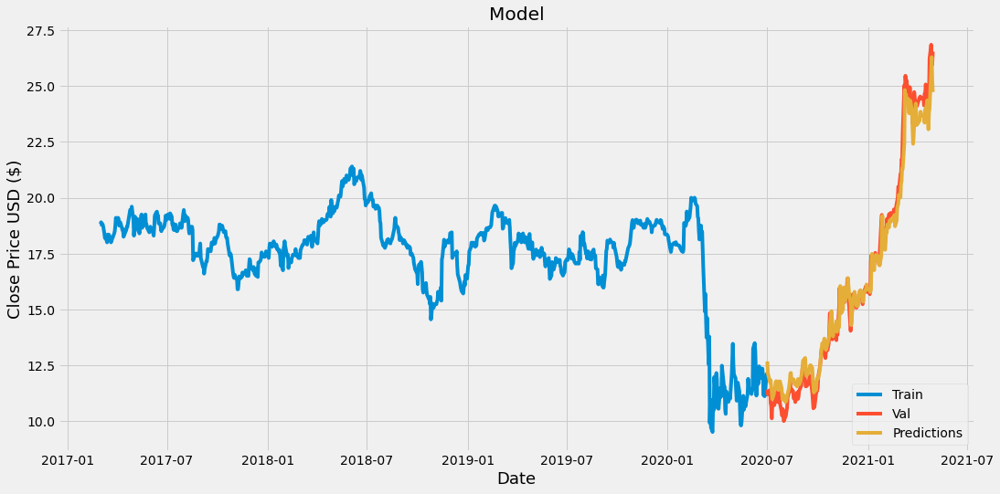

Accuracy: Close    0.00033
dtype: float64
Ticker Analyzed: ACC
(1049, 6)
Epoch 1/10
780/780 [==============================] - 16s 18ms/step - loss: 0.0137 - mse: 0.0137 - mae: 0.0717 - mape: 51544.8727
Epoch 2/10
780/780 [==============================] - 14s 18ms/step - loss: 0.0034 - mse: 0.0034 - mae: 0.0415 - mape: 98999.1004
Epoch 3/10
780/780 [==============================] - 15s 19ms/step - loss: 0.0016 - mse: 0.0016 - mae: 0.0281 - mape: 77832.7633
Epoch 4/10
780/780 [==============================] - 14s 18ms/step - loss: 0.0017 - mse: 0.0017 - mae: 0.0284 - mape: 259137.6491
Epoch 5/10
780/780 [==============================] - 14s 18ms/step - loss: 0.0012 - mse: 0.0012 - mae: 0.0244 - mape: 530594.9873
Epoch 6/10
780/780 [==============================] - 15s 19ms/step - loss: 0.0019 - mse: 0.0019 - mae: 0.0285 - mape: 214346.8839
Epoch 7/10
780/780 [==============================] - 15s 19ms/step - loss: 0.0013 - mse: 0.0013 - mae: 0.0236 - mape: 42941.0899
Epoch 8/10
780

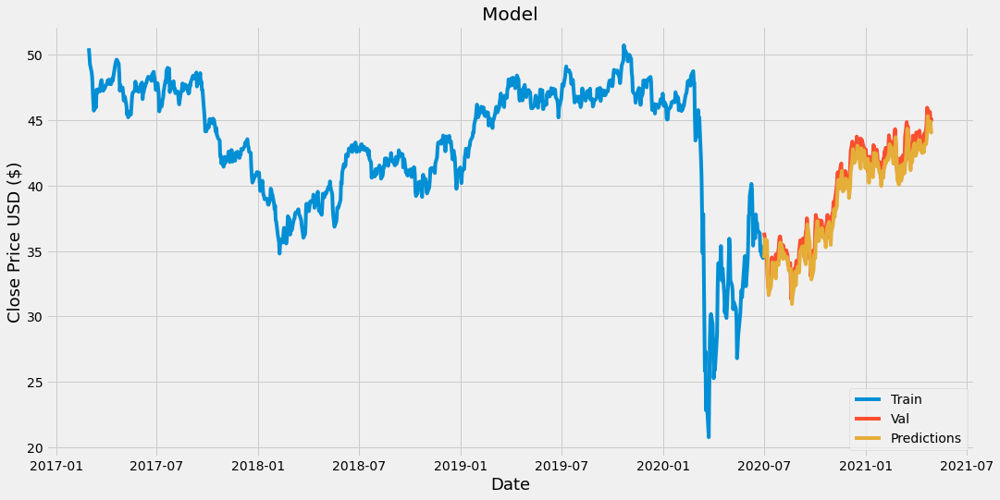

Accuracy: Close    0.021958
dtype: float64
Ticker Analyzed: ACCD
(209, 6)
Epoch 1/10
108/108 [==============================] - 4s 18ms/step - loss: 0.0844 - mse: 0.0844 - mae: 0.2014 - mape: 25.7719
Epoch 2/10
108/108 [==============================] - 2s 18ms/step - loss: 0.0104 - mse: 0.0104 - mae: 0.0847 - mape: 10.9045
Epoch 3/10
108/108 [==============================] - 2s 18ms/step - loss: 0.0071 - mse: 0.0071 - mae: 0.0663 - mape: 8.5087
Epoch 4/10
108/108 [==============================] - 2s 18ms/step - loss: 0.0046 - mse: 0.0046 - mae: 0.0523 - mape: 6.8934
Epoch 5/10
108/108 [==============================] - 2s 19ms/step - loss: 0.0064 - mse: 0.0064 - mae: 0.0632 - mape: 8.3555
Epoch 6/10
108/108 [==============================] - 2s 22ms/step - loss: 0.0075 - mse: 0.0075 - mae: 0.0693 - mape: 9.1307
Epoch 7/10
108/108 [==============================] - 2s 19ms/step - loss: 0.0065 - mse: 0.0065 - mae: 0.0660 - mape: 8.5673
Epoch 8/10
108/108 [=============================

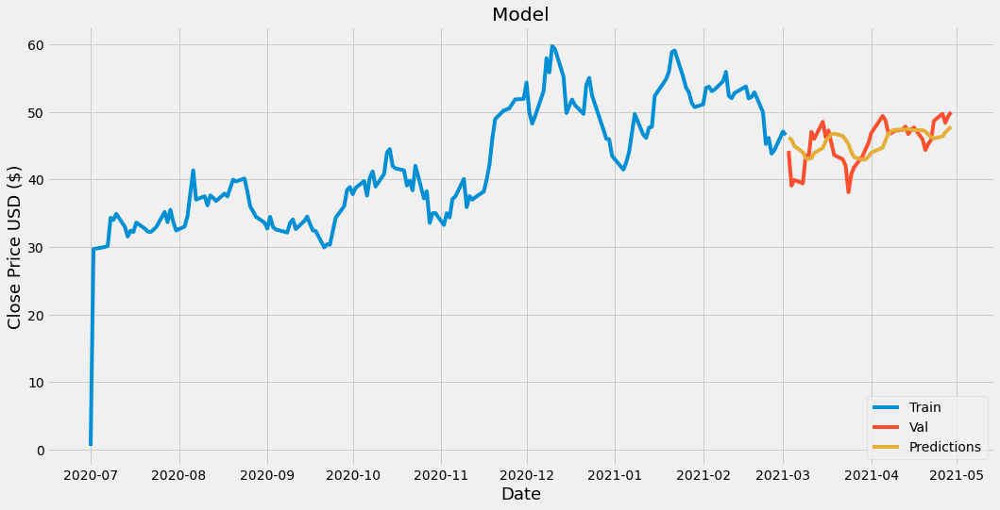

Accuracy: Close    0.004143
dtype: float64
Ticker Analyzed: ACCO
(1049, 6)
Epoch 1/10
780/780 [==============================] - 16s 18ms/step - loss: 0.0139 - mse: 0.0139 - mae: 0.0713 - mape: 59554.0729
Epoch 2/10
780/780 [==============================] - 15s 19ms/step - loss: 0.0025 - mse: 0.0025 - mae: 0.0372 - mape: 663991.9473
Epoch 3/10
780/780 [==============================] - 14s 19ms/step - loss: 0.0017 - mse: 0.0017 - mae: 0.0299 - mape: 176206.4248
Epoch 4/10
780/780 [==============================] - 15s 19ms/step - loss: 0.0015 - mse: 0.0015 - mae: 0.0293 - mape: 98064.1857
Epoch 5/10
780/780 [==============================] - 15s 19ms/step - loss: 0.0011 - mse: 0.0011 - mae: 0.0244 - mape: 39317.8148
Epoch 6/10
780/780 [==============================] - 14s 19ms/step - loss: 9.8548e-04 - mse: 9.8548e-04 - mae: 0.0237 - mape: 3856.3462
Epoch 7/10
780/780 [==============================] - 14s 19ms/step - loss: 0.0011 - mse: 0.0011 - mae: 0.0228 - mape: 3254.9376
Epoch 8

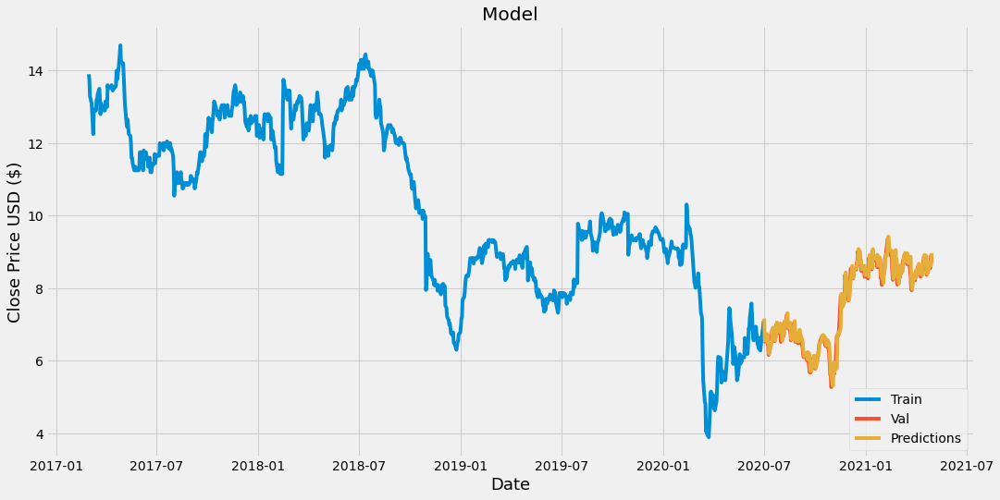

Accuracy: Close    0.003353
dtype: float64
Ticker Analyzed: ACEL
(926, 6)
Epoch 1/10
681/681 [==============================] - 14s 18ms/step - loss: 0.0142 - mse: 0.0142 - mae: 0.0709 - mape: 69840.9968
Epoch 2/10
681/681 [==============================] - 12s 18ms/step - loss: 0.0021 - mse: 0.0021 - mae: 0.0302 - mape: 209661.0356
Epoch 3/10
681/681 [==============================] - 12s 18ms/step - loss: 0.0012 - mse: 0.0012 - mae: 0.0220 - mape: 134521.2766
Epoch 4/10
681/681 [==============================] - 12s 18ms/step - loss: 0.0013 - mse: 0.0013 - mae: 0.0236 - mape: 370544.5921
Epoch 5/10
681/681 [==============================] - 13s 19ms/step - loss: 0.0012 - mse: 0.0012 - mae: 0.0223 - mape: 99192.3168
Epoch 6/10
681/681 [==============================] - 12s 18ms/step - loss: 0.0011 - mse: 0.0011 - mae: 0.0218 - mape: 328172.3504
Epoch 7/10
681/681 [==============================] - 13s 19ms/step - loss: 7.1071e-04 - mse: 7.1071e-04 - mae: 0.0178 - mape: 60134.9255
Epoc

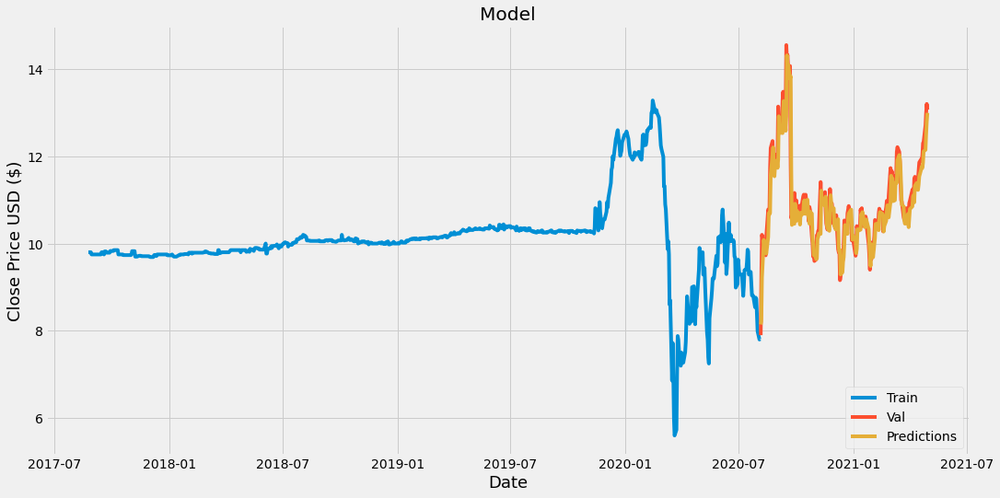

Accuracy: Close    0.013166
dtype: float64
Ticker Analyzed: ACER
(1049, 6)
Epoch 1/10
780/780 [==============================] - 16s 18ms/step - loss: 0.0102 - mse: 0.0102 - mae: 0.0652 - mape: 19203.6813
Epoch 2/10
780/780 [==============================] - 14s 18ms/step - loss: 0.0025 - mse: 0.0025 - mae: 0.0328 - mape: 23139.1240
Epoch 3/10
780/780 [==============================] - 14s 18ms/step - loss: 0.0024 - mse: 0.0024 - mae: 0.0331 - mape: 29379.6264
Epoch 4/10
780/780 [==============================] - 14s 19ms/step - loss: 0.0019 - mse: 0.0019 - mae: 0.0258 - mape: 2419.5767
Epoch 5/10
780/780 [==============================] - 14s 19ms/step - loss: 0.0017 - mse: 0.0017 - mae: 0.0259 - mape: 5170.1594
Epoch 6/10
780/780 [==============================] - 15s 19ms/step - loss: 0.0016 - mse: 0.0016 - mae: 0.0235 - mape: 1384.3834
Epoch 7/10
780/780 [==============================] - 14s 18ms/step - loss: 0.0014 - mse: 0.0014 - mae: 0.0215 - mape: 4634.6737
Epoch 8/10
780/780 

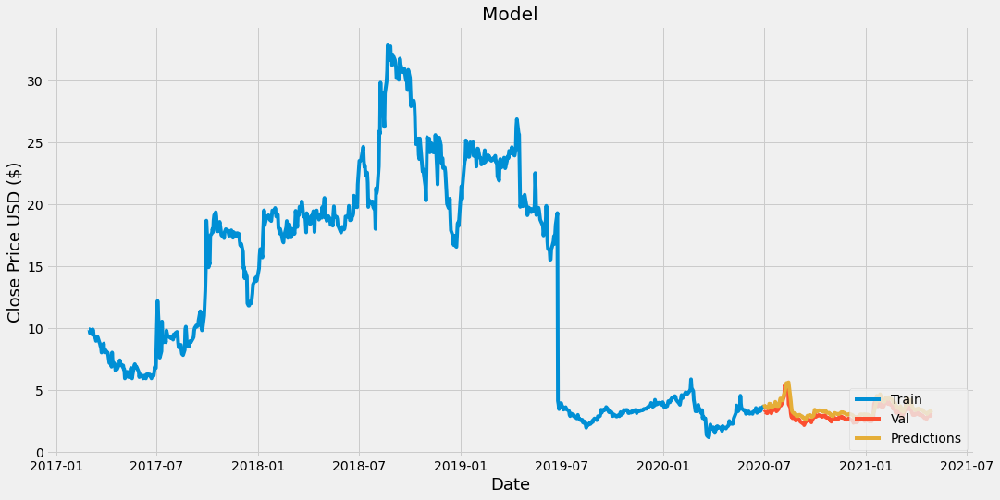

Accuracy: Close    0.012093
dtype: float64
Ticker Analyzed: ACET
(820, 6)
Epoch 1/10
596/596 [==============================] - 12s 18ms/step - loss: 0.0128 - mse: 0.0128 - mae: 0.0670 - mape: 29214.0415
Epoch 2/10
596/596 [==============================] - 11s 18ms/step - loss: 0.0028 - mse: 0.0028 - mae: 0.0346 - mape: 123604.0975
Epoch 3/10
596/596 [==============================] - 11s 18ms/step - loss: 0.0029 - mse: 0.0029 - mae: 0.0349 - mape: 22557.9368
Epoch 4/10
596/596 [==============================] - 11s 18ms/step - loss: 0.0015 - mse: 0.0015 - mae: 0.0254 - mape: 908.2458
Epoch 5/10
596/596 [==============================] - 11s 19ms/step - loss: 0.0011 - mse: 0.0011 - mae: 0.0221 - mape: 25317.7487
Epoch 6/10
596/596 [==============================] - 11s 18ms/step - loss: 9.1924e-04 - mse: 9.1924e-04 - mae: 0.0200 - mape: 912.0454
Epoch 7/10
596/596 [==============================] - 11s 18ms/step - loss: 0.0012 - mse: 0.0012 - mae: 0.0190 - mape: 12728.6172
Epoch 8/10


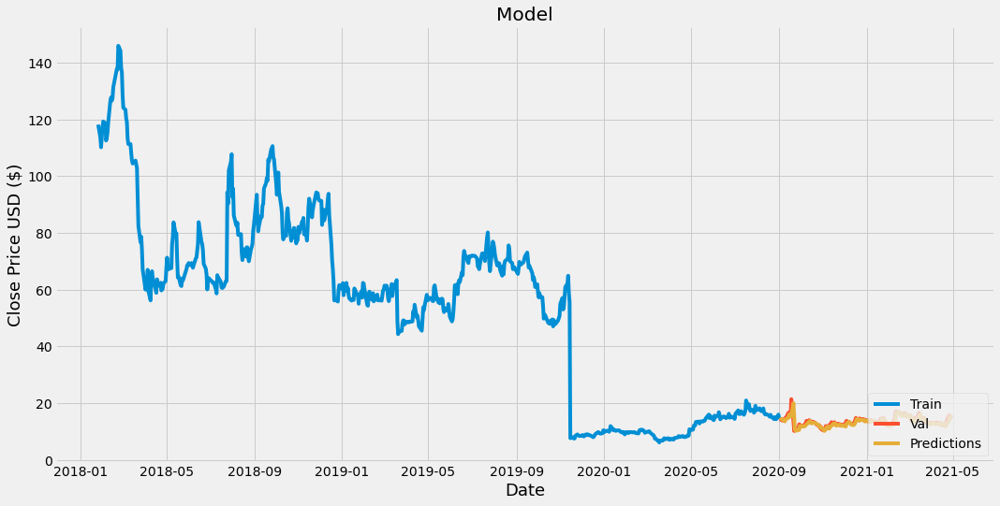

Accuracy: Close    0.001972
dtype: float64
Ticker Analyzed: ACEV
(153, 6)
Epoch 1/10
63/63 [==============================] - 3s 19ms/step - loss: 0.0778 - mse: 0.0778 - mae: 0.2124 - mape: 49.5243
Epoch 2/10
63/63 [==============================] - 1s 17ms/step - loss: 0.0460 - mse: 0.0460 - mae: 0.1506 - mape: 38.8103
Epoch 3/10
63/63 [==============================] - 1s 18ms/step - loss: 0.0308 - mse: 0.0308 - mae: 0.1221 - mape: 40.1636
Epoch 4/10
63/63 [==============================] - 1s 18ms/step - loss: 0.0312 - mse: 0.0312 - mae: 0.1300 - mape: 40.1645
Epoch 5/10
63/63 [==============================] - 1s 18ms/step - loss: 0.0306 - mse: 0.0306 - mae: 0.1387 - mape: 42.3245
Epoch 6/10
63/63 [==============================] - 1s 18ms/step - loss: 0.0222 - mse: 0.0222 - mae: 0.1177 - mape: 35.5886
Epoch 7/10
63/63 [==============================] - 1s 18ms/step - loss: 0.0226 - mse: 0.0226 - mae: 0.1127 - mape: 31.7707
Epoch 8/10
63/63 [==============================] - 1s 18m

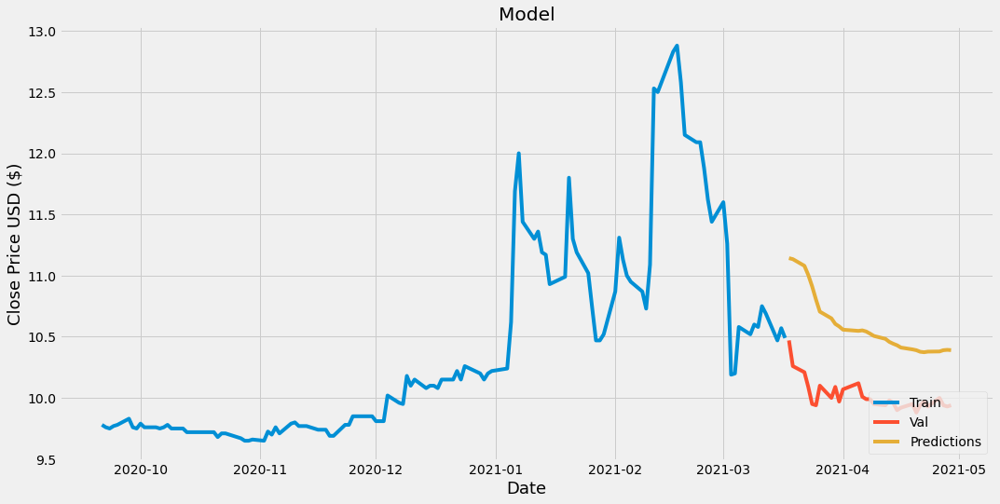

Accuracy: Close    0.177103
dtype: float64
Ticker Analyzed: ACEVU
(190, 6)
Epoch 1/10
92/92 [==============================] - 4s 20ms/step - loss: 0.0445 - mse: 0.0445 - mae: 0.1513 - mape: 3313359.2959
Epoch 2/10
92/92 [==============================] - 2s 18ms/step - loss: 0.0221 - mse: 0.0221 - mae: 0.1062 - mape: 1156540.1827
Epoch 3/10
92/92 [==============================] - 2s 18ms/step - loss: 0.0400 - mse: 0.0400 - mae: 0.1398 - mape: 1929305.6013
Epoch 4/10
92/92 [==============================] - 2s 18ms/step - loss: 0.0197 - mse: 0.0197 - mae: 0.0910 - mape: 1651783.4645
Epoch 5/10
92/92 [==============================] - 2s 18ms/step - loss: 0.0182 - mse: 0.0182 - mae: 0.0892 - mape: 598322.4834
Epoch 6/10
92/92 [==============================] - 2s 18ms/step - loss: 0.0129 - mse: 0.0129 - mae: 0.0768 - mape: 743459.2189
Epoch 7/10
92/92 [==============================] - 2s 18ms/step - loss: 0.0094 - mse: 0.0094 - mae: 0.0623 - mape: 2018745.3946
Epoch 8/10
92/92 [======

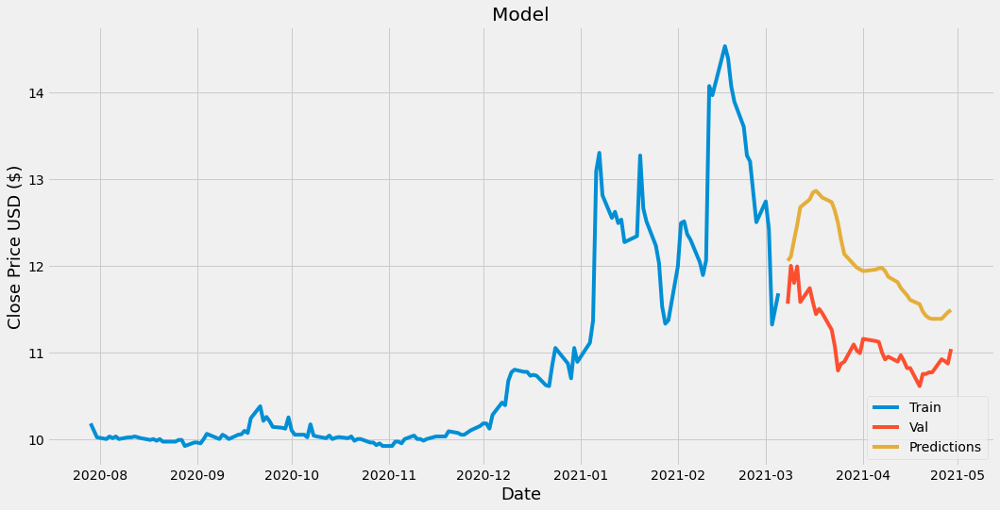

Accuracy: Close    0.196261
dtype: float64
Ticker Analyzed: ACGL
(1049, 6)
Epoch 1/10
780/780 [==============================] - 16s 18ms/step - loss: 0.0109 - mse: 0.0109 - mae: 0.0678 - mape: 230238.4098
Epoch 2/10
780/780 [==============================] - 14s 19ms/step - loss: 0.0029 - mse: 0.0029 - mae: 0.0386 - mape: 190537.4782
Epoch 3/10
780/780 [==============================] - 14s 18ms/step - loss: 0.0015 - mse: 0.0015 - mae: 0.0267 - mape: 141538.8717
Epoch 4/10
780/780 [==============================] - 14s 18ms/step - loss: 0.0012 - mse: 0.0012 - mae: 0.0246 - mape: 14002.6161
Epoch 5/10
780/780 [==============================] - 14s 18ms/step - loss: 0.0013 - mse: 0.0013 - mae: 0.0264 - mape: 95422.6433
Epoch 6/10
780/780 [==============================] - 14s 18ms/step - loss: 9.4810e-04 - mse: 9.4810e-04 - mae: 0.0221 - mape: 562718.9800
Epoch 7/10
780/780 [==============================] - 14s 18ms/step - loss: 8.6076e-04 - mse: 8.6076e-04 - mae: 0.0207 - mape: 81863.

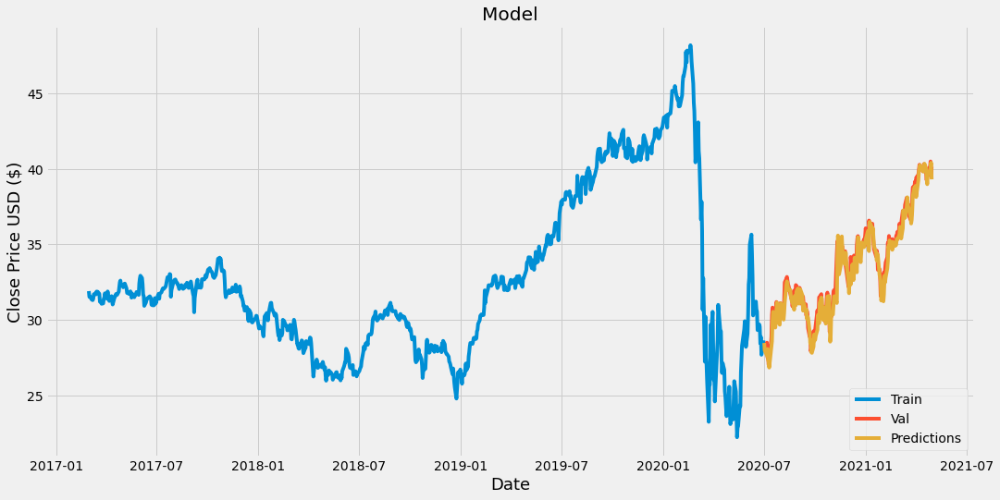

Accuracy: Close    0.011283
dtype: float64
Ticker Analyzed: ACGLO
(929, 6)
Epoch 1/10
684/684 [==============================] - 14s 18ms/step - loss: 0.0208 - mse: 0.0208 - mae: 0.0859 - mape: 1383331.0686
Epoch 2/10
684/684 [==============================] - 12s 18ms/step - loss: 0.0048 - mse: 0.0048 - mae: 0.0441 - mape: 263413.2386
Epoch 3/10
684/684 [==============================] - 12s 18ms/step - loss: 0.0033 - mse: 0.0033 - mae: 0.0342 - mape: 906499.6175
Epoch 4/10
684/684 [==============================] - 12s 18ms/step - loss: 0.0020 - mse: 0.0020 - mae: 0.0273 - mape: 429480.2277
Epoch 5/10
684/684 [==============================] - 12s 18ms/step - loss: 0.0013 - mse: 0.0013 - mae: 0.0224 - mape: 480661.3628
Epoch 6/10
684/684 [==============================] - 12s 18ms/step - loss: 0.0013 - mse: 0.0013 - mae: 0.0224 - mape: 392080.1682
Epoch 7/10
684/684 [==============================] - 12s 18ms/step - loss: 0.0011 - mse: 0.0011 - mae: 0.0224 - mape: 37943.4562
Epoch 8/

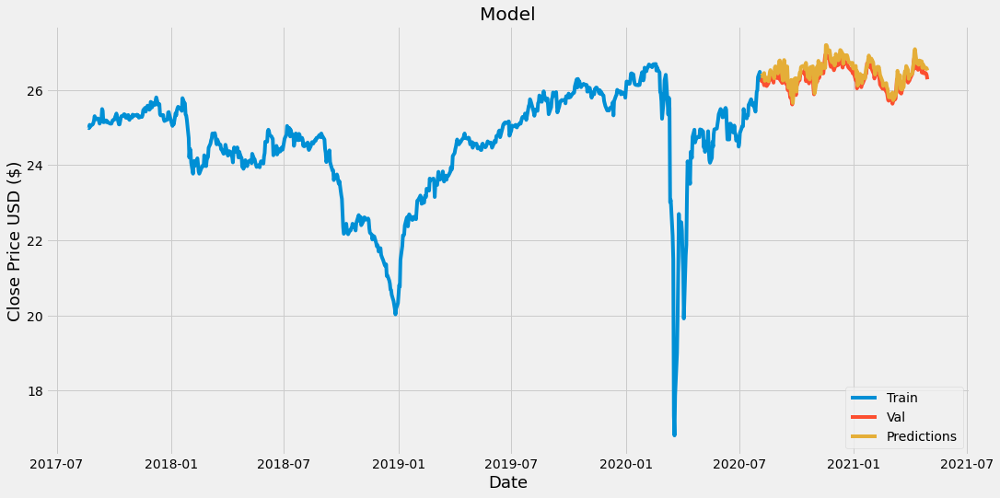

Accuracy: Close    0.013973
dtype: float64
Ticker Analyzed: ACGLP
(1049, 6)
Epoch 1/10
780/780 [==============================] - 15s 18ms/step - loss: 0.0237 - mse: 0.0237 - mae: 0.0814 - mape: 112346.3627
Epoch 2/10
780/780 [==============================] - 14s 18ms/step - loss: 0.0046 - mse: 0.0046 - mae: 0.0427 - mape: 1531341.4139
Epoch 3/10
780/780 [==============================] - 14s 18ms/step - loss: 0.0028 - mse: 0.0028 - mae: 0.0323 - mape: 1240453.8523
Epoch 4/10
780/780 [==============================] - 16s 21ms/step - loss: 0.0020 - mse: 0.0020 - mae: 0.0282 - mape: 49177.7978
Epoch 5/10
780/780 [==============================] - 17s 22ms/step - loss: 0.0017 - mse: 0.0017 - mae: 0.0250 - mape: 846999.2218
Epoch 6/10
780/780 [==============================] - 19s 24ms/step - loss: 0.0016 - mse: 0.0016 - mae: 0.0230 - mape: 20444.5625
Epoch 7/10
780/780 [==============================] - 21s 27ms/step - loss: 0.0010 - mse: 0.0010 - mae: 0.0191 - mape: 76707.5069
Epoch 8/

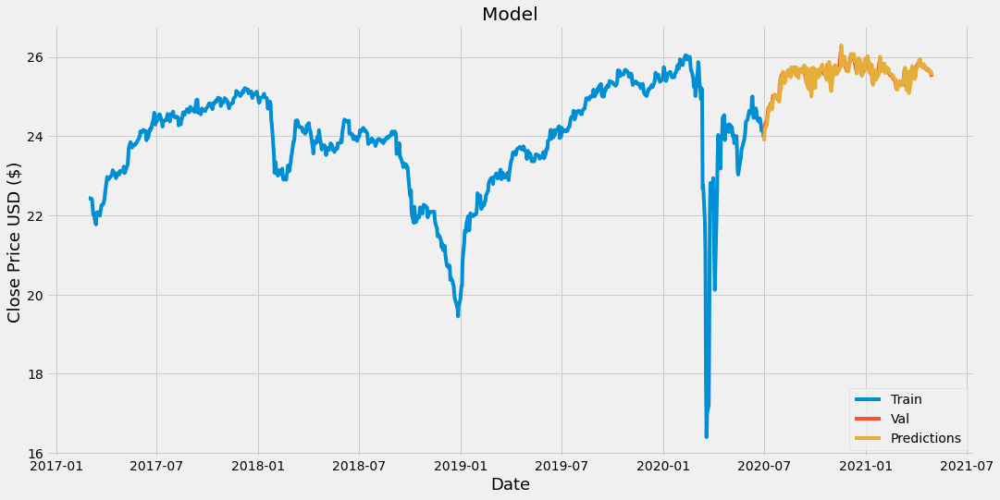

Accuracy: Close    0.000027
dtype: float64
Ticker Analyzed: ACH
(1049, 6)
Epoch 1/10
780/780 [==============================] - 37s 41ms/step - loss: 0.0115 - mse: 0.0115 - mae: 0.0641 - mape: 14059.7940
Epoch 2/10
780/780 [==============================] - 35s 44ms/step - loss: 0.0019 - mse: 0.0019 - mae: 0.0330 - mape: 80079.5940
Epoch 3/10
780/780 [==============================] - 33s 43ms/step - loss: 0.0015 - mse: 0.0015 - mae: 0.0274 - mape: 84874.5821
Epoch 4/10
780/780 [==============================] - 34s 43ms/step - loss: 0.0014 - mse: 0.0014 - mae: 0.0271 - mape: 58891.6504
Epoch 5/10
780/780 [==============================] - 48s 62ms/step - loss: 0.0010 - mse: 0.0010 - mae: 0.0243 - mape: 51157.7664
Epoch 6/10
780/780 [==============================] - 45s 58ms/step - loss: 7.9747e-04 - mse: 7.9747e-04 - mae: 0.0214 - mape: 24897.1550
Epoch 7/10
780/780 [==============================] - 47s 61ms/step - loss: 8.0483e-04 - mse: 8.0483e-04 - mae: 0.0197 - mape: 12390.5575


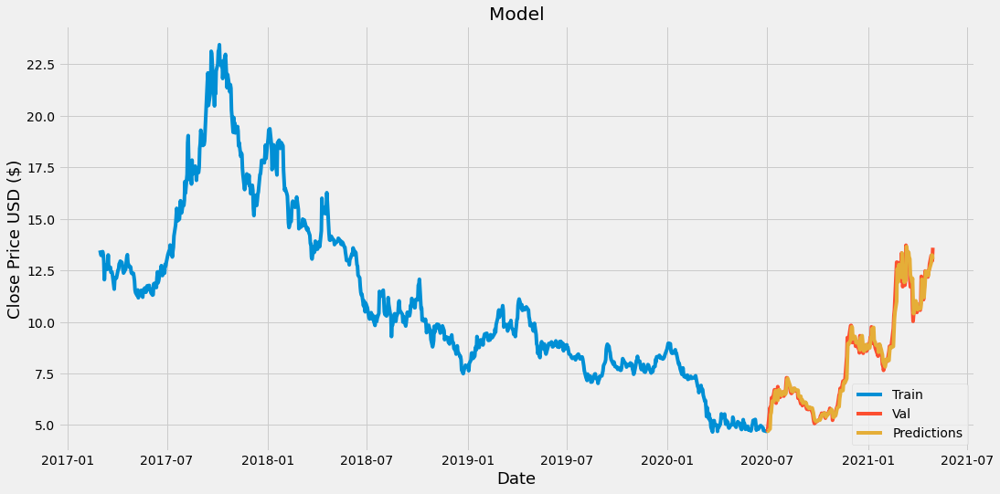

Accuracy: Close    0.000506
dtype: float64
Ticker Analyzed: ACHC
(1049, 6)
Epoch 1/10
780/780 [==============================] - 63s 71ms/step - loss: 0.0125 - mse: 0.0125 - mae: 0.0670 - mape: 73131.0934
Epoch 2/10
780/780 [==============================] - 63s 80ms/step - loss: 6.0558e-04 - mse: 6.0558e-04 - mae: 0.0177 - mape: 1352.8507
Epoch 10/10
780/780 [==============================] - 91s 117ms/step - loss: 8.3866e-04 - mse: 8.3866e-04 - mae: 0.0211 - mape: 30703.5046


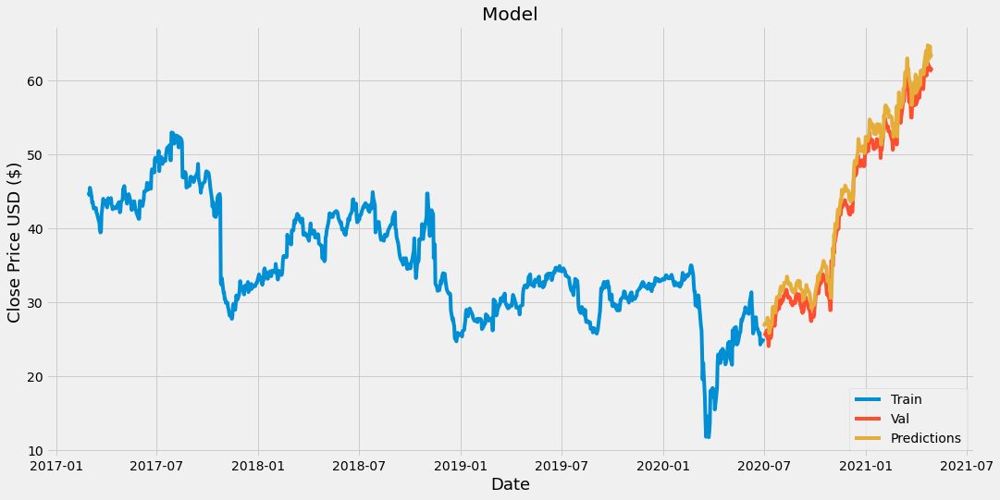

Accuracy: Close    0.03318
dtype: float64
Ticker Analyzed: ACHV
(1049, 6)
Epoch 1/10
780/780 [==============================] - 17s 19ms/step - loss: 0.0035 - mse: 0.0035 - mae: 0.0358 - mape: 7495.9798
Epoch 2/10
780/780 [==============================] - 915s 1s/step - loss: 0.0011 - mse: 0.0011 - mae: 0.0198 - mape: 205.8015
Epoch 3/10
780/780 [==============================] - 26s 33ms/step - loss: 9.1687e-04 - mse: 9.1687e-04 - mae: 0.0166 - mape: 334.0022
Epoch 4/10
780/780 [==============================] - 2336s 3s/step - loss: 9.6643e-04 - mse: 9.6643e-04 - mae: 0.0185 - mape: 5412.2224
Epoch 5/10
780/780 [==============================] - 29s 37ms/step - loss: 5.9898e-04 - mse: 5.9898e-04 - mae: 0.0145 - mape: 11505.4554
Epoch 6/10
780/780 [==============================] - 23s 30ms/step - loss: 5.5713e-04 - mse: 5.5713e-04 - mae: 0.0149 - mape: 73371.3914
Epoch 7/10
780/780 [==============================] - 24s 31ms/step - loss: 5.4182e-04 - mse: 5.4182e-04 - mae: 0.0144 - 

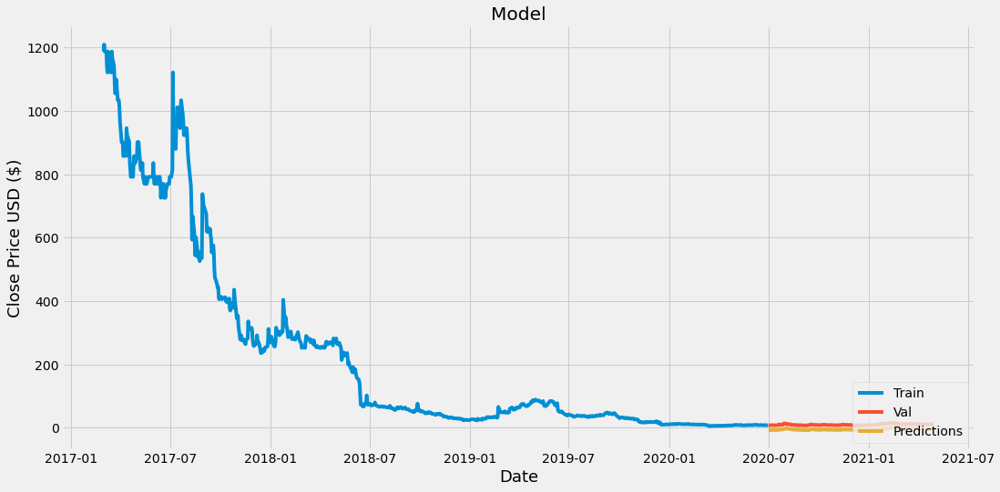

Accuracy: Close    0.012469
dtype: float64
Ticker Analyzed: ACI
(212, 6)
Epoch 1/10
110/110 [==============================] - 7s 30ms/step - loss: 0.0259 - mse: 0.0259 - mae: 0.1138 - mape: 39.8610
Epoch 2/10
110/110 [==============================] - 3s 30ms/step - loss: 0.0132 - mse: 0.0132 - mae: 0.0807 - mape: 29.6441
Epoch 3/10
110/110 [==============================] - 4s 32ms/step - loss: 0.0075 - mse: 0.0075 - mae: 0.0646 - mape: 25.2867
Epoch 4/10
110/110 [==============================] - 3s 31ms/step - loss: 0.0086 - mse: 0.0086 - mae: 0.0634 - mape: 17.9602
Epoch 5/10
110/110 [==============================] - 3s 30ms/step - loss: 0.0097 - mse: 0.0097 - mae: 0.0667 - mape: 17.6846
Epoch 6/10
110/110 [==============================] - 4s 32ms/step - loss: 0.0090 - mse: 0.0090 - mae: 0.0685 - mape: 25.5516
Epoch 7/10
110/110 [==============================] - 3s 31ms/step - loss: 0.0058 - mse: 0.0058 - mae: 0.0526 - mape: 16.7657
Epoch 8/10
110/110 [=========================

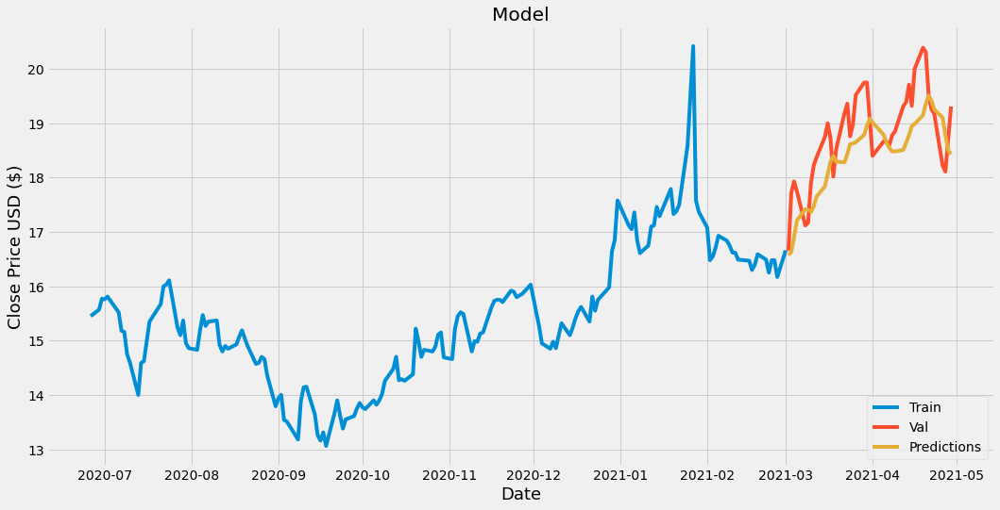

Accuracy: Close    0.05382
dtype: float64
Ticker Analyzed: ACIC
(90, 6)
Epoch 1/10
12/12 [==============================] - 5s 36ms/step - loss: 0.0013 - mse: 0.0013 - mae: 0.0319 - mape: 66.3522
Epoch 2/10
12/12 [==============================] - 0s 30ms/step - loss: 0.0018 - mse: 0.0018 - mae: 0.0357 - mape: 61.7571
Epoch 3/10
12/12 [==============================] - 0s 30ms/step - loss: 8.4589e-04 - mse: 8.4589e-04 - mae: 0.0209 - mape: 38.2188
Epoch 4/10
12/12 [==============================] - 0s 29ms/step - loss: 6.3601e-04 - mse: 6.3601e-04 - mae: 0.0214 - mape: 47.5659
Epoch 5/10
12/12 [==============================] - 0s 35ms/step - loss: 5.5997e-04 - mse: 5.5997e-04 - mae: 0.0192 - mape: 37.7483
Epoch 6/10
12/12 [==============================] - 0s 38ms/step - loss: 3.9342e-04 - mse: 3.9342e-04 - mae: 0.0157 - mape: 38.6319
Epoch 7/10
12/12 [==============================] - 0s 31ms/step - loss: 5.5714e-04 - mse: 5.5714e-04 - mae: 0.0174 - mape: 48.8897
Epoch 8/10
12/12 [==

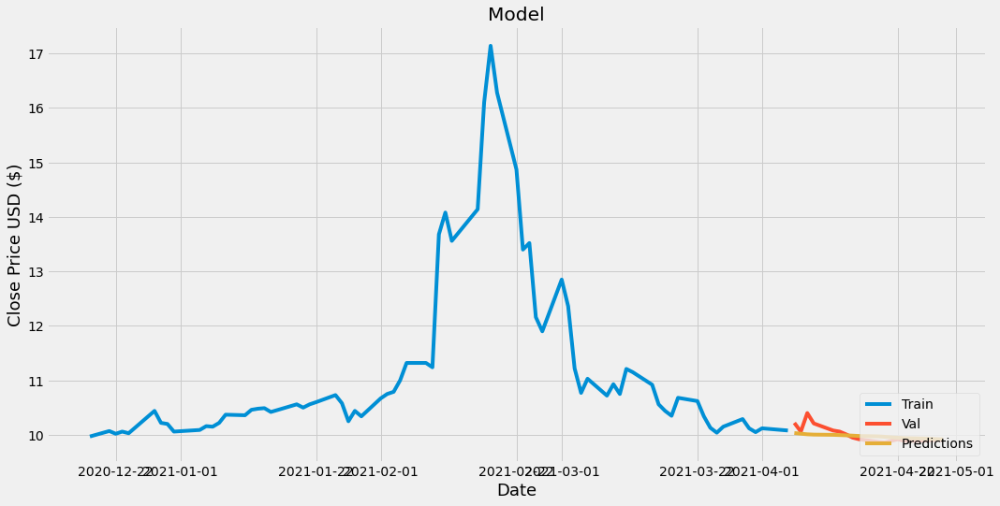

Accuracy: Close    0.003316
dtype: float64
Ticker Analyzed: ACIU
(1049, 6)
Epoch 1/10
780/780 [==============================] - 28s 31ms/step - loss: 0.0127 - mse: 0.0127 - mae: 0.0718 - mape: 1327133.0628
Epoch 2/10
780/780 [==============================] - 22s 29ms/step - loss: 0.0031 - mse: 0.0031 - mae: 0.0373 - mape: 13622.7296
Epoch 3/10
780/780 [==============================] - 24s 31ms/step - loss: 0.0043 - mse: 0.0043 - mae: 0.0444 - mape: 191114.2598
Epoch 4/10
780/780 [==============================] - 23s 29ms/step - loss: 0.0022 - mse: 0.0022 - mae: 0.0301 - mape: 545309.2284
Epoch 5/10
780/780 [==============================] - 23s 29ms/step - loss: 0.0017 - mse: 0.0017 - mae: 0.0253 - mape: 435484.6215
Epoch 6/10
780/780 [==============================] - 22s 28ms/step - loss: 0.0022 - mse: 0.0022 - mae: 0.0285 - mape: 936947.9536
Epoch 7/10
780/780 [==============================] - 24s 30ms/step - loss: 0.0019 - mse: 0.0019 - mae: 0.0288 - mape: 46673.1637
Epoch 8/1

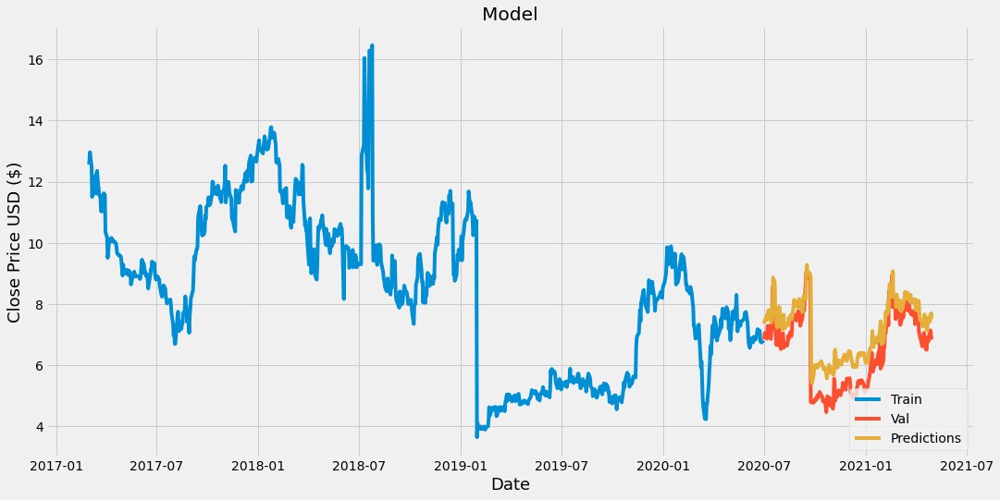

Accuracy: Close    0.051825
dtype: float64
Ticker Analyzed: ACIW
(1049, 6)
Epoch 1/10
780/780 [==============================] - 24s 27ms/step - loss: 0.0097 - mse: 0.0097 - mae: 0.0638 - mape: 25.7288
Epoch 2/10
780/780 [==============================] - 21s 27ms/step - loss: 0.0024 - mse: 0.0024 - mae: 0.0371 - mape: 15.1237
Epoch 3/10
780/780 [==============================] - 21s 27ms/step - loss: 0.0017 - mse: 0.0017 - mae: 0.0310 - mape: 13.2005
Epoch 4/10
780/780 [==============================] - 22s 28ms/step - loss: 0.0014 - mse: 0.0014 - mae: 0.0269 - mape: 12.4946
Epoch 5/10
780/780 [==============================] - 22s 28ms/step - loss: 0.0010 - mse: 0.0010 - mae: 0.0235 - mape: 9.6371
Epoch 6/10
780/780 [==============================] - 22s 28ms/step - loss: 0.0012 - mse: 0.0012 - mae: 0.0255 - mape: 10.1222
Epoch 7/10
780/780 [==============================] - 21s 27ms/step - loss: 0.0011 - mse: 0.0011 - mae: 0.0241 - mape: 9.9650
Epoch 8/10
780/780 [==================

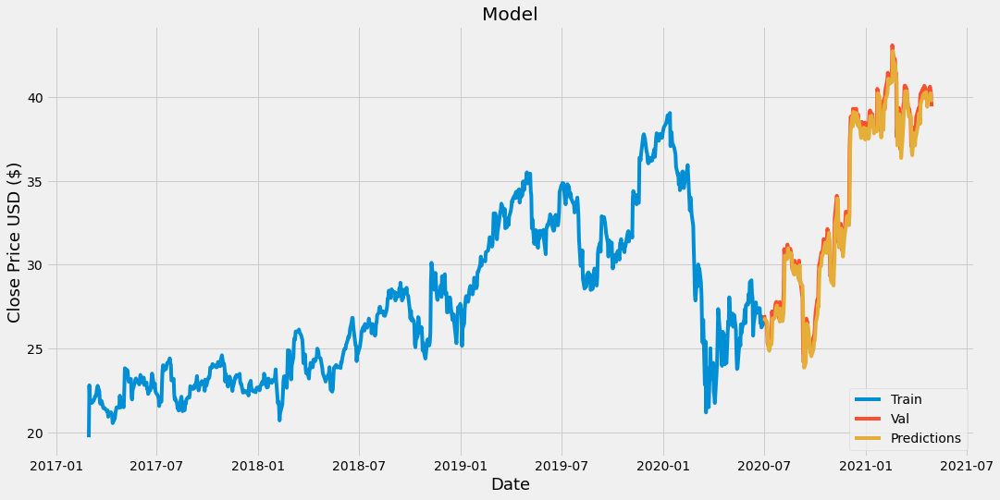

Accuracy: Close    0.015412
dtype: float64
Ticker Analyzed: ACKIU
(88, 6)
Epoch 1/10
11/11 [==============================] - 3s 30ms/step - loss: 0.0040 - mse: 0.0040 - mae: 0.0449 - mape: 1467133.1269
Epoch 2/10
11/11 [==============================] - 0s 42ms/step - loss: 0.0040 - mse: 0.0040 - mae: 0.0478 - mape: 1325268.2102
Epoch 3/10
11/11 [==============================] - 0s 33ms/step - loss: 0.0028 - mse: 0.0028 - mae: 0.0441 - mape: 1813940.8314
Epoch 4/10
11/11 [==============================] - 0s 27ms/step - loss: 0.0038 - mse: 0.0038 - mae: 0.0547 - mape: 3239145.0889
Epoch 5/10
11/11 [==============================] - 0s 28ms/step - loss: 0.0044 - mse: 0.0044 - mae: 0.0581 - mape: 5947960.5247
Epoch 6/10
11/11 [==============================] - 0s 27ms/step - loss: 0.0043 - mse: 0.0043 - mae: 0.0581 - mape: 15849083.3333
Epoch 7/10
11/11 [==============================] - 0s 26ms/step - loss: 0.0029 - mse: 0.0029 - mae: 0.0415 - mape: 15435993.6646
Epoch 8/10
11/11 [===

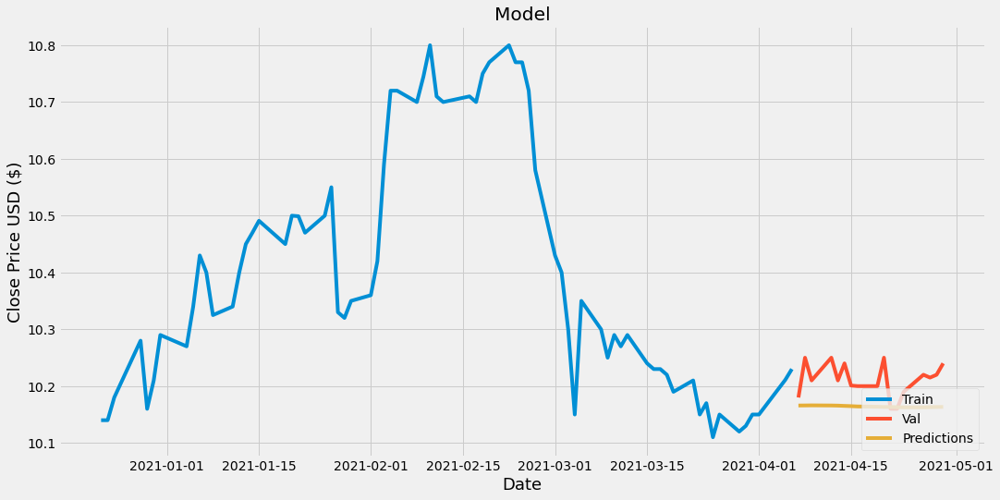

Accuracy: Close    0.068576
dtype: float64
Ticker Analyzed: ACLS
(1049, 6)
Epoch 1/10
780/780 [==============================] - 25s 28ms/step - loss: 0.0056 - mse: 0.0056 - mae: 0.0485 - mape: 483090.8364
Epoch 2/10
780/780 [==============================] - 22s 28ms/step - loss: 0.0012 - mse: 0.0012 - mae: 0.0254 - mape: 94132.6492
Epoch 3/10
780/780 [==============================] - 22s 28ms/step - loss: 9.6461e-04 - mse: 9.6461e-04 - mae: 0.0232 - mape: 50824.9803
Epoch 4/10
780/780 [==============================] - 136s 174ms/step - loss: 6.4479e-04 - mse: 6.4479e-04 - mae: 0.0191 - mape: 47807.8873


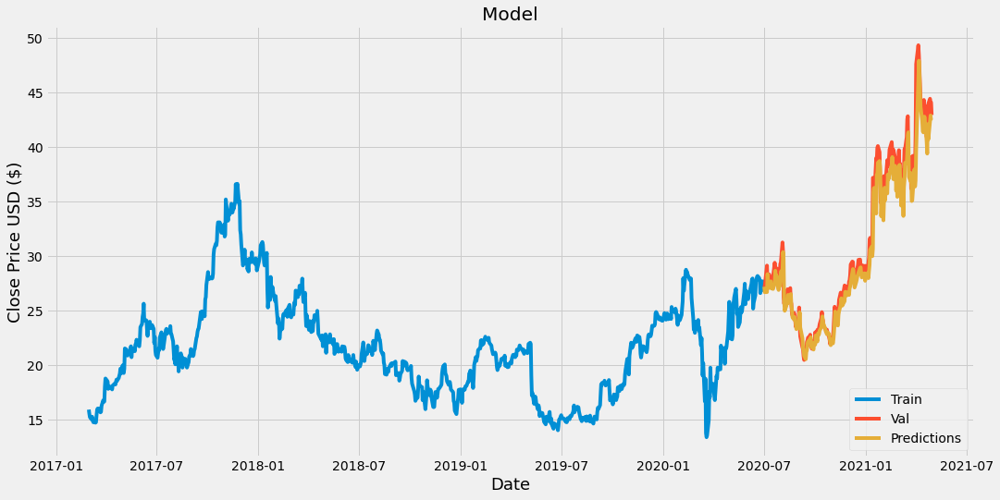

Accuracy: Close    0.02338
dtype: float64
Ticker Analyzed: ACM
(1049, 6)
Epoch 1/10
780/780 [==============================] - 88s 85ms/step - loss: 0.0051 - mse: 0.0051 - mae: 0.0463 - mape: 301709.3956
Epoch 2/10
780/780 [==============================] - 55s 70ms/step - loss: 6.1602e-04 - mse: 6.1602e-04 - mae: 0.0183 - mape: 44673.4029
Epoch 5/10
780/780 [==============================] - 57s 73ms/step - loss: 5.2887e-04 - mse: 5.2887e-04 - mae: 0.0165 - mape: 49381.1769
Epoch 9/10
780/780 [==============================] - 55s 70ms/step - loss: 3.8936e-04 - mse: 3.8936e-04 - mae: 0.0144 - mape: 133642.0827
Epoch 10/10
642/642 [==============================] - 47s 74ms/step - loss: 0.0020 - mse: 0.0020 - mae: 0.0292 - mape: 39.1508
Epoch 3/10
642/642 [==============================] - 45s 70ms/step - loss: 9.0930e-04 - mse: 9.0930e-04 - mae: 0.0190 - mape: 21.6213
Epoch 4/10
642/642 [==============================] - 46s 71ms/step - loss: 4.7338e-04 - mse: 4.7338e-04 - mae: 0.0132

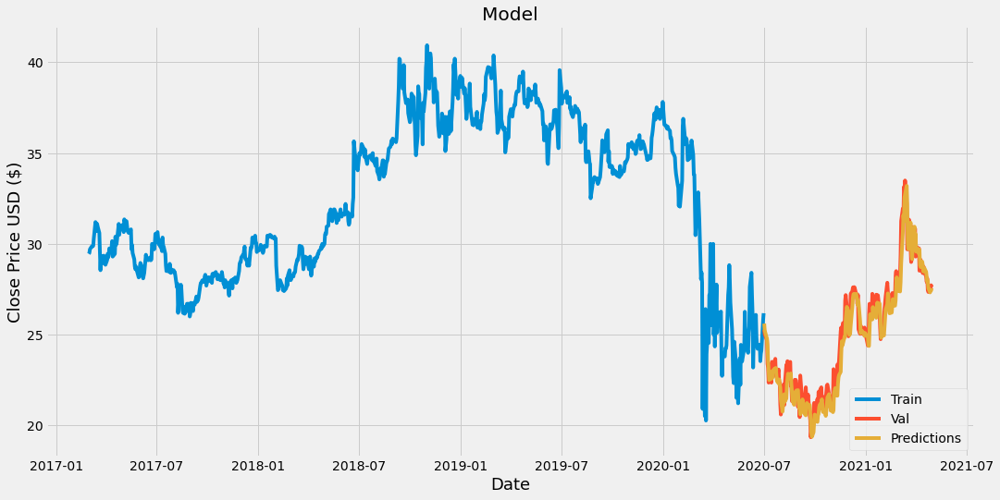

Accuracy: Close    0.014259
dtype: float64
Ticker Analyzed: ACND
(158, 6)
Epoch 1/10
67/67 [==============================] - 5s 24ms/step - loss: 0.0486 - mse: 0.0486 - mae: 0.1740 - mape: 44.1073
Epoch 2/10
67/67 [==============================] - 2s 26ms/step - loss: 0.0562 - mse: 0.0562 - mae: 0.1698 - mape: 40.1133
Epoch 3/10
67/67 [==============================] - 2s 25ms/step - loss: 0.0172 - mse: 0.0172 - mae: 0.1054 - mape: 24.6764
Epoch 4/10
67/67 [==============================] - 2s 25ms/step - loss: 0.0220 - mse: 0.0220 - mae: 0.1034 - mape: 28.5377
Epoch 5/10
67/67 [==============================] - 2s 23ms/step - loss: 0.0183 - mse: 0.0183 - mae: 0.1100 - mape: 31.5250
Epoch 6/10
67/67 [==============================] - 2s 25ms/step - loss: 0.0108 - mse: 0.0108 - mae: 0.0788 - mape: 20.8374
Epoch 7/10
67/67 [==============================] - 1s 19ms/step - loss: 0.0132 - mse: 0.0132 - mae: 0.0905 - mape: 28.6660
Epoch 8/10
67/67 [==============================] - 2s 25m

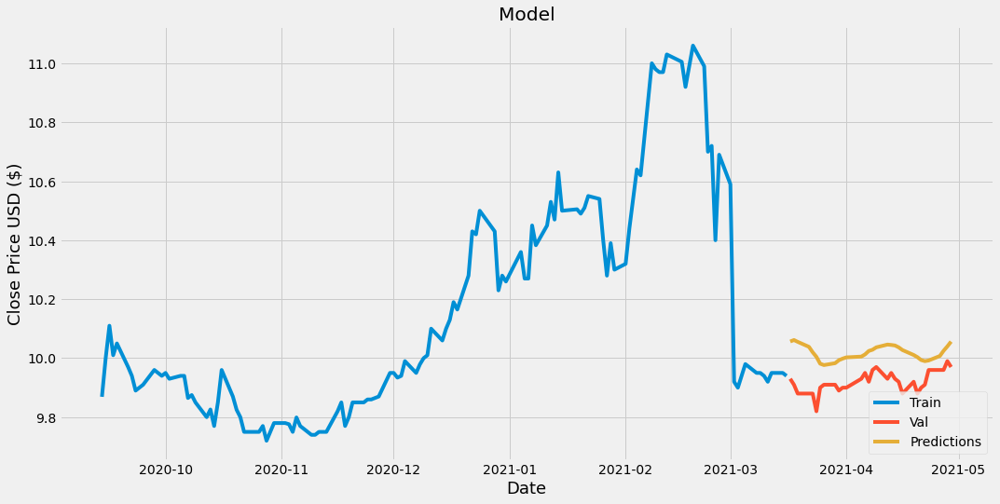

Accuracy: Close    0.07455
dtype: float64
Ticker Analyzed: ACOR
(1050, 6)
Epoch 1/10
780/780 [==============================] - 20s 22ms/step - loss: 0.0123 - mse: 0.0123 - mae: 0.0643 - mape: 46.9893
Epoch 2/10
780/780 [==============================] - 17s 22ms/step - loss: 0.0024 - mse: 0.0024 - mae: 0.0332 - mape: 21.8063
Epoch 3/10
780/780 [==============================] - 17s 22ms/step - loss: 0.0022 - mse: 0.0022 - mae: 0.0323 - mape: 28.7345
Epoch 4/10
780/780 [==============================] - 16s 21ms/step - loss: 0.0019 - mse: 0.0019 - mae: 0.0272 - mape: 15.1491 1s - loss: 0.0019 - mse: 0.0019 - m
Epoch 5/10
780/780 [==============================] - 14s 18ms/step - loss: 0.0017 - mse: 0.0017 - mae: 0.0267 - mape: 16.6139
Epoch 6/10
780/780 [==============================] - 15s 19ms/step - loss: 0.0018 - mse: 0.0018 - mae: 0.0274 - mape: 18.8502
Epoch 7/10
780/780 [==============================] - 15s 19ms/step - loss: 0.0013 - mse: 0.0013 - mae: 0.0223 - mape: 16.5322
E

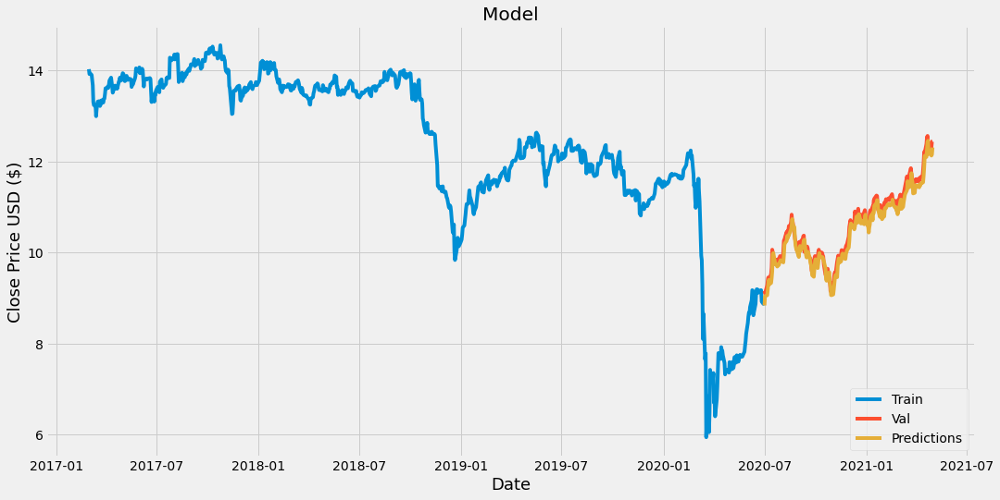

Accuracy: Close    0.014283
dtype: float64
Ticker Analyzed: ACR
(1049, 6)
Epoch 1/10
780/780 [==============================] - 17s 20ms/step - loss: 0.0175 - mse: 0.0175 - mae: 0.0681 - mape: 42622.0599
Epoch 2/10
780/780 [==============================] - 15s 19ms/step - loss: 0.0015 - mse: 0.0015 - mae: 0.0251 - mape: 138484.6402
Epoch 3/10
780/780 [==============================] - 14s 18ms/step - loss: 9.0336e-04 - mse: 9.0336e-04 - mae: 0.0209 - mape: 44512.4053
Epoch 4/10
780/780 [==============================] - 15s 19ms/step - loss: 9.0132e-04 - mse: 9.0132e-04 - mae: 0.0193 - mape: 79180.5917
Epoch 5/10
780/780 [==============================] - 15s 20ms/step - loss: 9.9068e-04 - mse: 9.9068e-04 - mae: 0.0216 - mape: 28687.9494
Epoch 6/10
780/780 [==============================] - 15s 19ms/step - loss: 0.0010 - mse: 0.0010 - mae: 0.0206 - mape: 247106.2150
Epoch 7/10
780/780 [==============================] - 17s 21ms/step - loss: 7.9675e-04 - mse: 7.9675e-04 - mae: 0.0173 -

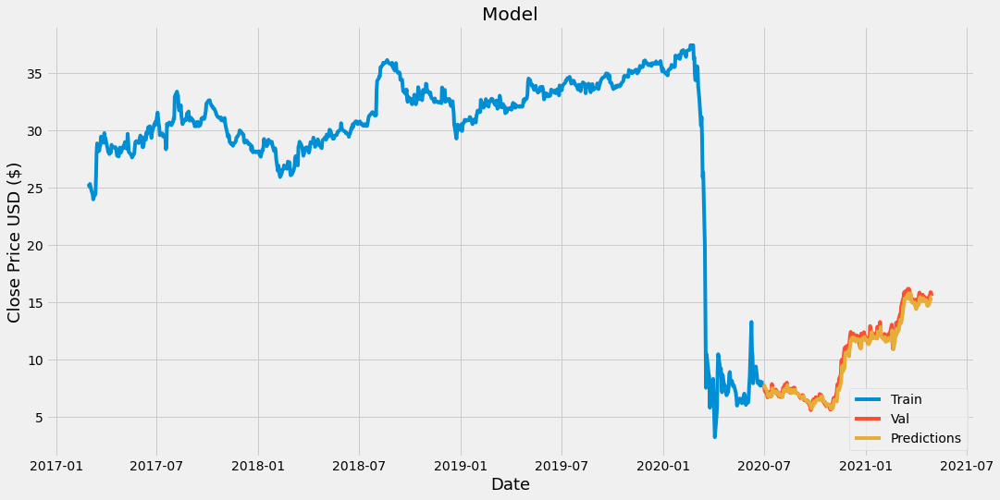

Accuracy: Close    0.007231
dtype: float64
Error on ACR^C!
Ticker Analyzed: ACRE
(1050, 6)
Epoch 1/10
780/780 [==============================] - 17s 19ms/step - loss: 0.0227 - mse: 0.0227 - mae: 0.0801 - mape: 346923.0675
Epoch 2/10
780/780 [==============================] - 16s 21ms/step - loss: 0.0030 - mse: 0.0030 - mae: 0.0309 - mape: 22739.8549
Epoch 3/10
780/780 [==============================] - 15s 19ms/step - loss: 0.0035 - mse: 0.0035 - mae: 0.0368 - mape: 300947.2361
Epoch 4/10
780/780 [==============================] - 16s 21ms/step - loss: 0.0010 - mse: 0.0010 - mae: 0.0205 - mape: 24157.9311
Epoch 5/10
780/780 [==============================] - 16s 20ms/step - loss: 8.6662e-04 - mse: 8.6662e-04 - mae: 0.0196 - mape: 331427.9189
Epoch 6/10
780/780 [==============================] - 15s 19ms/step - loss: 9.6281e-04 - mse: 9.6281e-04 - mae: 0.0194 - mape: 39869.1646
Epoch 7/10
780/780 [==============================] - 15s 19ms/step - loss: 0.0013 - mse: 0.0013 - mae: 0.0210

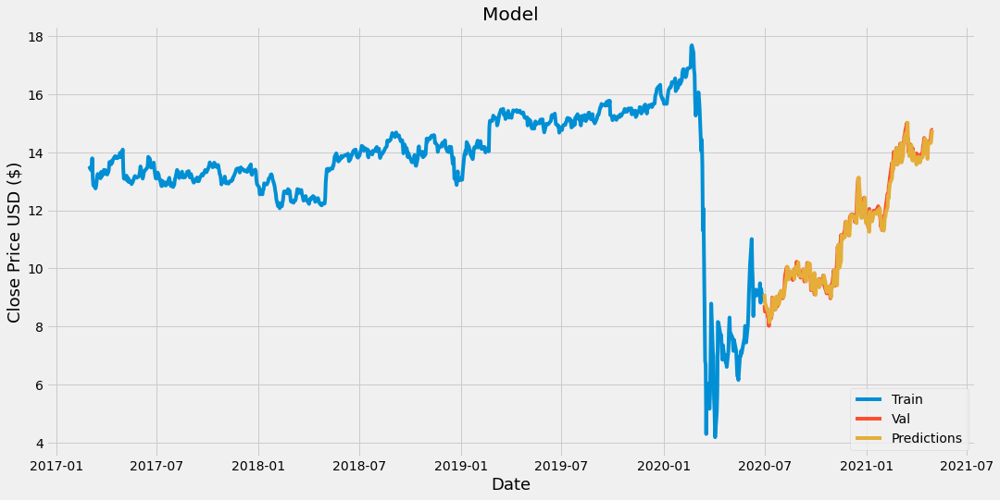

Accuracy: Close    0.003309
dtype: float64
Ticker Analyzed: ACRS
(1050, 6)
Epoch 1/10
780/780 [==============================] - 16s 18ms/step - loss: 0.0027 - mse: 0.0027 - mae: 0.0366 - mape: 32586.0957
Epoch 2/10
780/780 [==============================] - 15s 19ms/step - loss: 0.0014 - mse: 0.0014 - mae: 0.0258 - mape: 1775.1627
Epoch 3/10
780/780 [==============================] - 15s 20ms/step - loss: 0.0010 - mse: 0.0010 - mae: 0.0226 - mape: 3647.2775
Epoch 4/10
780/780 [==============================] - 15s 20ms/step - loss: 8.1451e-04 - mse: 8.1451e-04 - mae: 0.0202 - mape: 5472.5517
Epoch 5/10
780/780 [==============================] - 16s 21ms/step - loss: 6.3715e-04 - mse: 6.3715e-04 - mae: 0.0184 - mape: 9823.3211
Epoch 6/10
780/780 [==============================] - 15s 20ms/step - loss: 5.5639e-04 - mse: 5.5639e-04 - mae: 0.0169 - mape: 2529.1166
Epoch 7/10
780/780 [==============================] - 15s 19ms/step - loss: 5.1414e-04 - mse: 5.1414e-04 - mae: 0.0160 - mape:

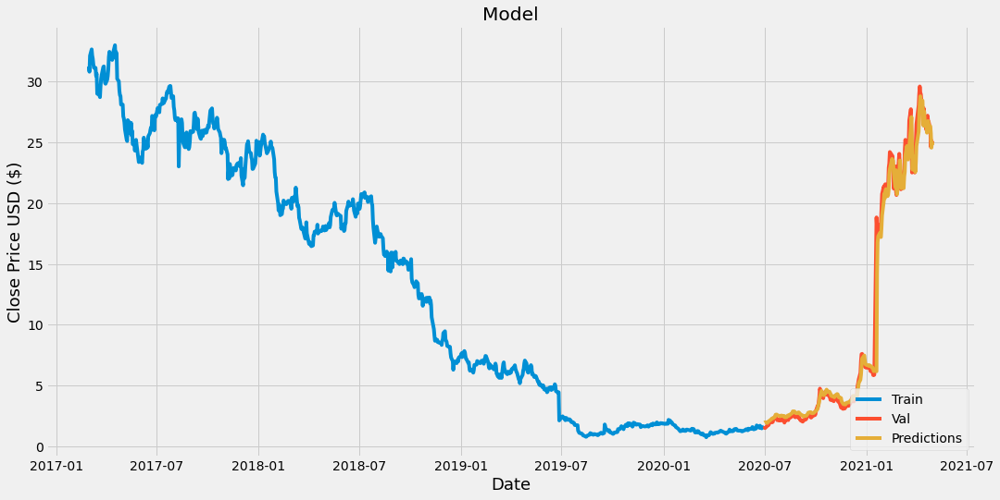

Accuracy: Close    0.002542
dtype: float64
Ticker Analyzed: ACRX
(1050, 6)
Epoch 1/10
780/780 [==============================] - 17s 19ms/step - loss: 0.0158 - mse: 0.0158 - mae: 0.0840 - mape: 112399.3561
Epoch 2/10
780/780 [==============================] - 16s 21ms/step - loss: 0.0042 - mse: 0.0042 - mae: 0.0407 - mape: 721.4072
Epoch 3/10
780/780 [==============================] - 15s 20ms/step - loss: 0.0036 - mse: 0.0036 - mae: 0.0373 - mape: 46180.9524
Epoch 4/10
780/780 [==============================] - 15s 20ms/step - loss: 0.0050 - mse: 0.0050 - mae: 0.0399 - mape: 4674.6625
Epoch 5/10
780/780 [==============================] - 16s 21ms/step - loss: 0.0028 - mse: 0.0028 - mae: 0.0331 - mape: 21172.1214
Epoch 6/10
780/780 [==============================] - 15s 20ms/step - loss: 0.0017 - mse: 0.0017 - mae: 0.0267 - mape: 45498.7102
Epoch 7/10
780/780 [==============================] - 15s 19ms/step - loss: 0.0042 - mse: 0.0042 - mae: 0.0341 - mape: 19444.8152
Epoch 8/10
780/78

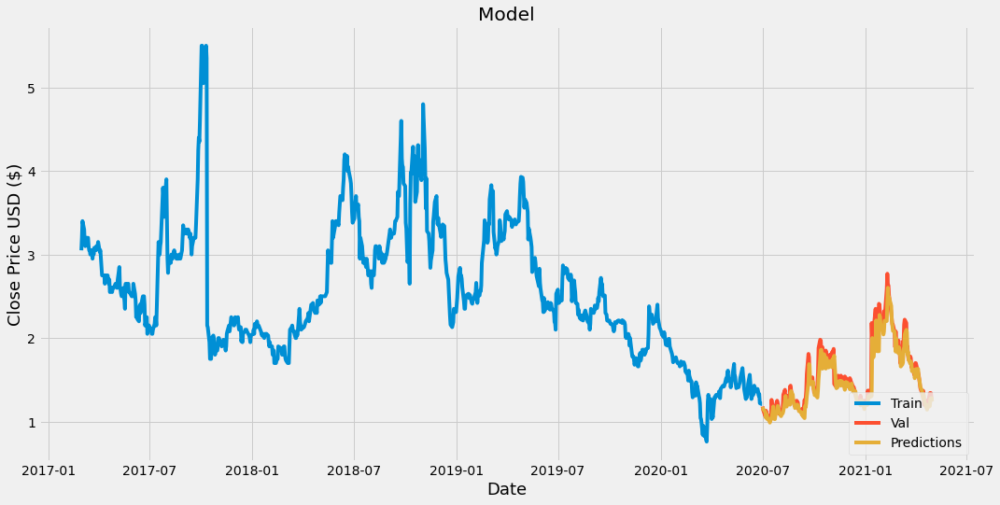

Accuracy: Close    0.012826
dtype: float64
Ticker Analyzed: ACST
(1050, 6)
Epoch 1/10
780/780 [==============================] - 17s 20ms/step - loss: 0.0124 - mse: 0.0124 - mae: 0.0673 - mape: 28.8792
Epoch 2/10
780/780 [==============================] - 15s 20ms/step - loss: 0.0030 - mse: 0.0030 - mae: 0.0326 - mape: 11.9891
Epoch 3/10
780/780 [==============================] - 16s 20ms/step - loss: 0.0027 - mse: 0.0027 - mae: 0.0318 - mape: 12.4607
Epoch 4/10
780/780 [==============================] - 17s 22ms/step - loss: 0.0023 - mse: 0.0023 - mae: 0.0272 - mape: 9.6897
Epoch 5/10
780/780 [==============================] - 15s 20ms/step - loss: 0.0016 - mse: 0.0016 - mae: 0.0243 - mape: 9.2894
Epoch 6/10
780/780 [==============================] - 15s 20ms/step - loss: 0.0041 - mse: 0.0041 - mae: 0.0331 - mape: 12.2057
Epoch 7/10
780/780 [==============================] - 15s 19ms/step - loss: 0.0020 - mse: 0.0020 - mae: 0.0263 - mape: 9.5664
Epoch 8/10
780/780 [===================

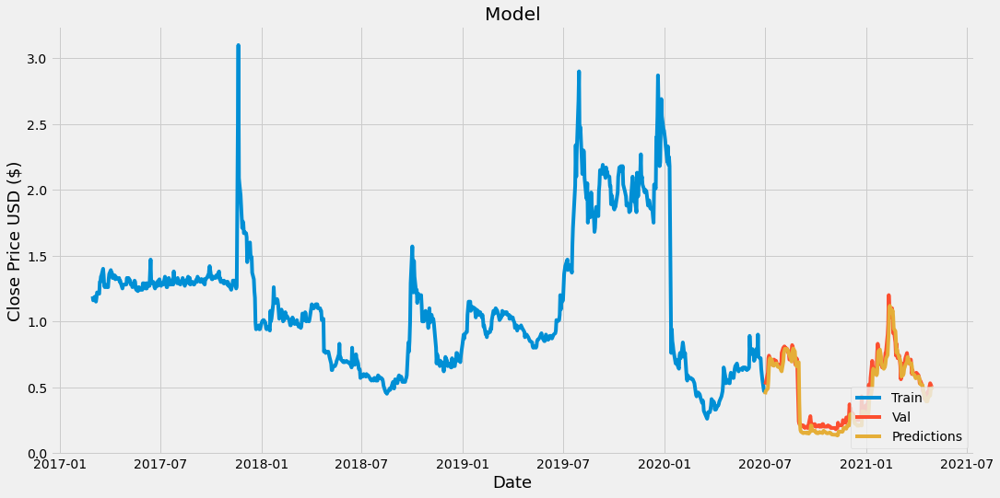

Accuracy: Close    0.010761
dtype: float64
Ticker Analyzed: ACTC
(105, 6)
Epoch 1/10
24/24 [==============================] - 4s 24ms/step - loss: 0.0474 - mse: 0.0474 - mae: 0.1612 - mape: 36.4418
Epoch 2/10
24/24 [==============================] - 1s 24ms/step - loss: 0.0045 - mse: 0.0045 - mae: 0.0541 - mape: 14.1360
Epoch 3/10
24/24 [==============================] - 0s 20ms/step - loss: 0.0073 - mse: 0.0073 - mae: 0.0703 - mape: 16.8083
Epoch 4/10
24/24 [==============================] - 0s 18ms/step - loss: 0.0118 - mse: 0.0118 - mae: 0.0875 - mape: 20.6400
Epoch 5/10
24/24 [==============================] - 0s 18ms/step - loss: 0.0107 - mse: 0.0107 - mae: 0.0891 - mape: 21.0795
Epoch 6/10
24/24 [==============================] - 0s 18ms/step - loss: 0.0059 - mse: 0.0059 - mae: 0.0671 - mape: 17.3552
Epoch 7/10
24/24 [==============================] - 0s 18ms/step - loss: 0.0092 - mse: 0.0092 - mae: 0.0820 - mape: 19.1431
Epoch 8/10
24/24 [==============================] - 0s 18m

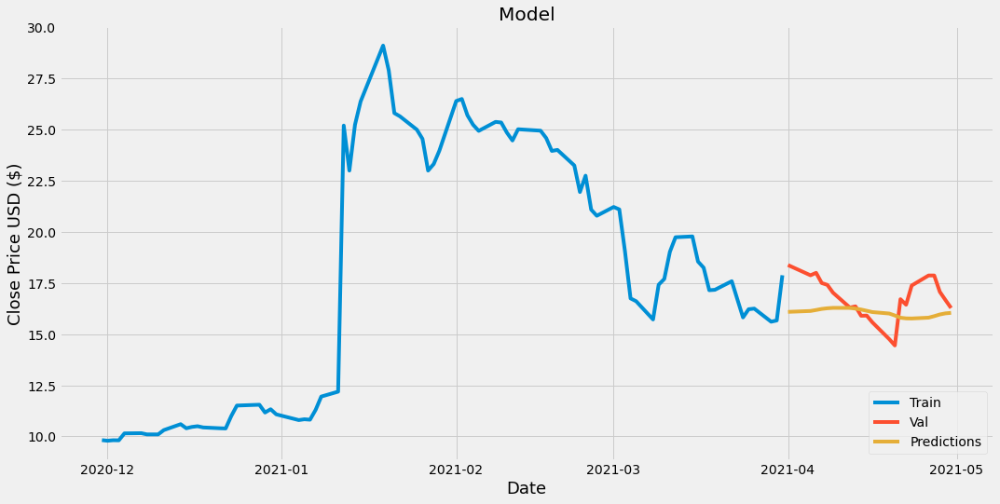

Accuracy: Close    0.035997
dtype: float64
Ticker Analyzed: ACTCU
(152, 6)
Epoch 1/10
62/62 [==============================] - 3s 18ms/step - loss: 0.1353 - mse: 0.1353 - mae: 0.3040 - mape: 71.0767
Epoch 2/10
62/62 [==============================] - 1s 22ms/step - loss: 0.0347 - mse: 0.0347 - mae: 0.1497 - mape: 69.2748
Epoch 3/10
62/62 [==============================] - 2s 25ms/step - loss: 0.0442 - mse: 0.0442 - mae: 0.1620 - mape: 79.9574
Epoch 4/10
62/62 [==============================] - 1s 22ms/step - loss: 0.0400 - mse: 0.0400 - mae: 0.1505 - mape: 61.1079
Epoch 5/10
62/62 [==============================] - 1s 22ms/step - loss: 0.0182 - mse: 0.0182 - mae: 0.1031 - mape: 42.7087
Epoch 6/10
62/62 [==============================] - 1s 22ms/step - loss: 0.0315 - mse: 0.0315 - mae: 0.1438 - mape: 54.1761
Epoch 7/10
62/62 [==============================] - 1s 23ms/step - loss: 0.0138 - mse: 0.0138 - mae: 0.0843 - mape: 36.1178
Epoch 8/10
62/62 [==============================] - 1s 23

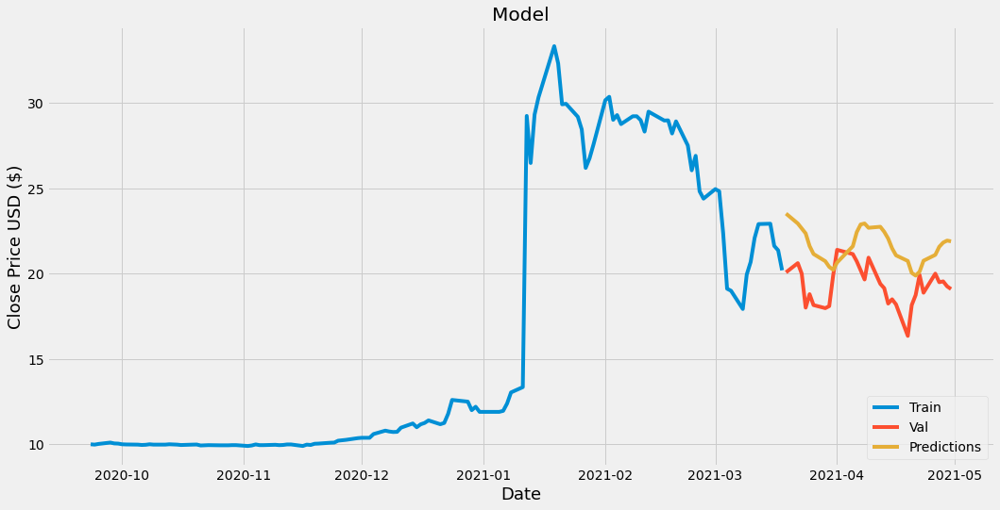

Accuracy: Close    0.099347
dtype: float64
Ticker Analyzed: ACTCW
(108, 6)
Epoch 1/10
27/27 [==============================] - 3s 25ms/step - loss: 0.1049 - mse: 0.1049 - mae: 0.2404 - mape: 37.9394
Epoch 2/10
27/27 [==============================] - 1s 23ms/step - loss: 0.0155 - mse: 0.0155 - mae: 0.1029 - mape: 17.4814
Epoch 3/10
27/27 [==============================] - 0s 18ms/step - loss: 0.0178 - mse: 0.0178 - mae: 0.1036 - mape: 18.6906
Epoch 4/10
27/27 [==============================] - 1s 20ms/step - loss: 0.0117 - mse: 0.0117 - mae: 0.0967 - mape: 15.7573
Epoch 5/10
27/27 [==============================] - 0s 18ms/step - loss: 0.0198 - mse: 0.0198 - mae: 0.1214 - mape: 21.2683
Epoch 6/10
27/27 [==============================] - 0s 18ms/step - loss: 0.0165 - mse: 0.0165 - mae: 0.1146 - mape: 19.8856
Epoch 7/10
27/27 [==============================] - 0s 18ms/step - loss: 0.0104 - mse: 0.0104 - mae: 0.0854 - mape: 13.7890
Epoch 8/10
27/27 [==============================] - 1s 21

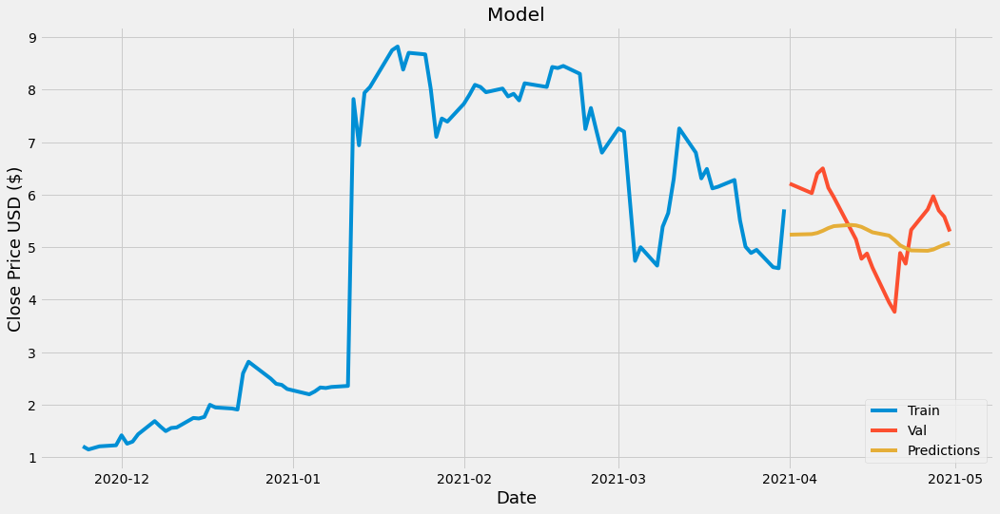

Accuracy: Close    0.024037
dtype: float64
Ticker Analyzed: ACTG
(1050, 6)
Epoch 1/10
780/780 [==============================] - 17s 20ms/step - loss: 0.0028 - mse: 0.0028 - mae: 0.0366 - mape: 20319.3772
Epoch 2/10
780/780 [==============================] - 17s 21ms/step - loss: 7.1082e-04 - mse: 7.1082e-04 - mae: 0.0195 - mape: 68977.8109
Epoch 3/10
780/780 [==============================] - 15s 20ms/step - loss: 6.1615e-04 - mse: 6.1615e-04 - mae: 0.0183 - mape: 74978.3593
Epoch 4/10
780/780 [==============================] - 15s 20ms/step - loss: 4.1952e-04 - mse: 4.1952e-04 - mae: 0.0149 - mape: 17772.0606
Epoch 5/10
780/780 [==============================] - 15s 19ms/step - loss: 3.6152e-04 - mse: 3.6152e-04 - mae: 0.0137 - mape: 6367.0064
Epoch 6/10
780/780 [==============================] - 23s 30ms/step - loss: 3.5589e-04 - mse: 3.5589e-04 - mae: 0.0137 - mape: 1494.2799
Epoch 7/10
780/780 [==============================] - 18s 23ms/step - loss: 3.9105e-04 - mse: 3.9105e-04 - 

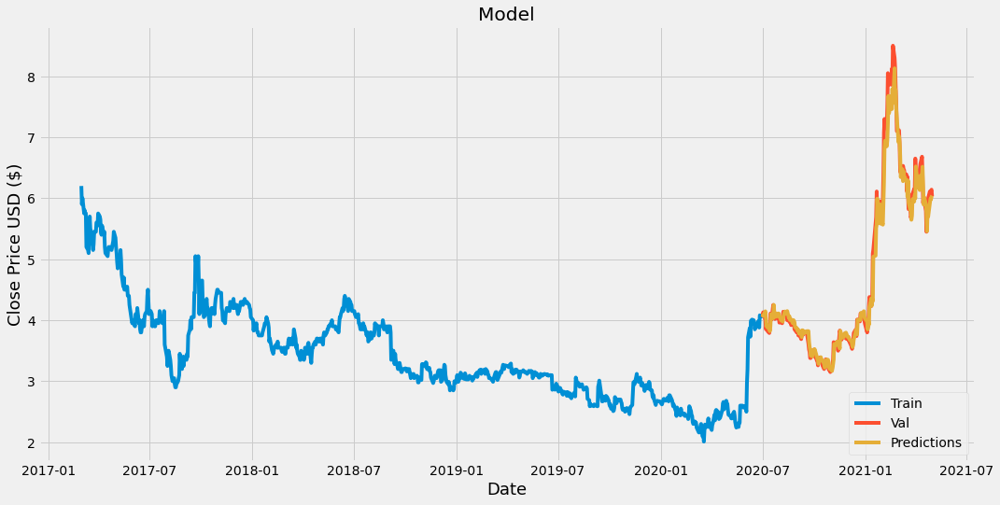

Accuracy: Close    0.007323
dtype: float64
Ticker Analyzed: ACU
(1050, 6)
Epoch 1/10
780/780 [==============================] - 18s 21ms/step - loss: 0.0032 - mse: 0.0032 - mae: 0.0368 - mape: 2192.9431
Epoch 2/10
780/780 [==============================] - 15s 19ms/step - loss: 8.1444e-04 - mse: 8.1444e-04 - mae: 0.0218 - mape: 4627.6964
Epoch 3/10
780/780 [==============================] - 16s 20ms/step - loss: 5.5220e-04 - mse: 5.5220e-04 - mae: 0.0180 - mape: 77701.7439
Epoch 4/10
780/780 [==============================] - 14s 18ms/step - loss: 6.5103e-04 - mse: 6.5103e-04 - mae: 0.0187 - mape: 3834.1282
Epoch 5/10
780/780 [==============================] - 16s 20ms/step - loss: 4.8545e-04 - mse: 4.8545e-04 - mae: 0.0170 - mape: 2660.1249
Epoch 6/10
780/780 [==============================] - 15s 19ms/step - loss: 5.3477e-04 - mse: 5.3477e-04 - mae: 0.0176 - mape: 42781.6445
Epoch 7/10
780/780 [==============================] - 15s 19ms/step - loss: 4.3892e-04 - mse: 4.3892e-04 - mae

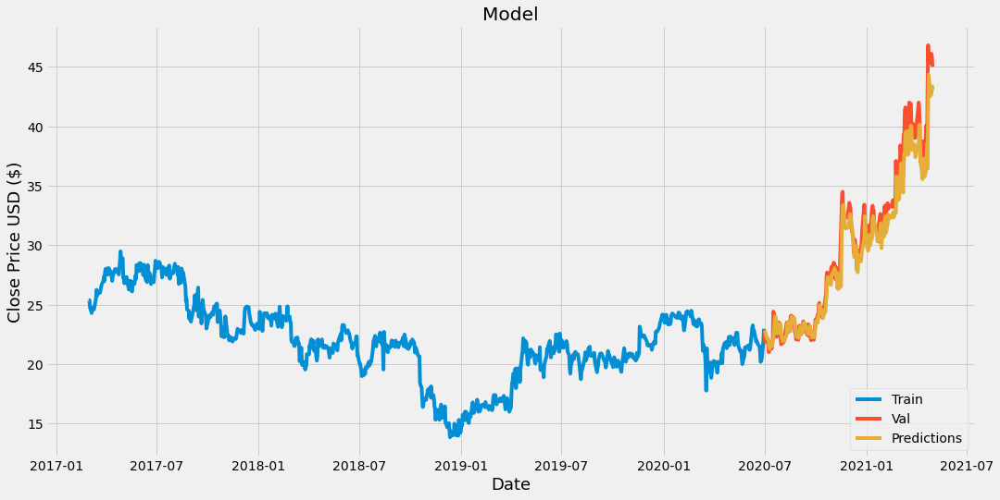

Accuracy: Close    0.02254
dtype: float64
Ticker Analyzed: ACV
(1050, 6)
Epoch 1/10
780/780 [==============================] - 18s 21ms/step - loss: 0.0062 - mse: 0.0062 - mae: 0.0436 - mape: 674904.3112
Epoch 2/10
780/780 [==============================] - 15s 20ms/step - loss: 0.0010 - mse: 0.0010 - mae: 0.0227 - mape: 298404.6832
Epoch 3/10
780/780 [==============================] - 15s 20ms/step - loss: 7.3742e-04 - mse: 7.3742e-04 - mae: 0.0194 - mape: 175013.4955
Epoch 4/10
780/780 [==============================] - 16s 20ms/step - loss: 7.6119e-04 - mse: 7.6119e-04 - mae: 0.0198 - mape: 268330.6639
Epoch 5/10
780/780 [==============================] - 17s 21ms/step - loss: 3.9928e-04 - mse: 3.9928e-04 - mae: 0.0147 - mape: 164843.9776
Epoch 6/10
780/780 [==============================] - 15s 20ms/step - loss: 4.6245e-04 - mse: 4.6245e-04 - mae: 0.0159 - mape: 327708.3948
Epoch 7/10
780/780 [==============================] - 15s 19ms/step - loss: 4.3479e-04 - mse: 4.3479e-04 - ma

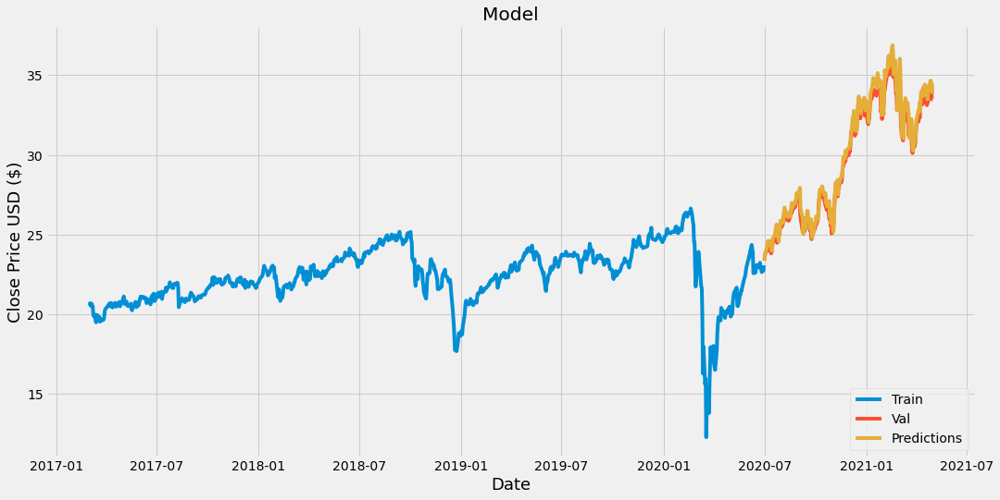

Accuracy: Close    0.016538
dtype: float64
Ticker Analyzed: ACY
(1050, 6)
Epoch 1/10
780/780 [==============================] - 20s 22ms/step - loss: 0.0153 - mse: 0.0153 - mae: 0.0769 - mape: 1268.8615
Epoch 2/10
780/780 [==============================] - 15s 19ms/step - loss: 0.0023 - mse: 0.0023 - mae: 0.0357 - mape: 32641.0928
Epoch 3/10
780/780 [==============================] - 14s 18ms/step - loss: 0.0017 - mse: 0.0017 - mae: 0.0314 - mape: 163726.0837
Epoch 4/10
780/780 [==============================] - 18s 23ms/step - loss: 0.0015 - mse: 0.0015 - mae: 0.0279 - mape: 6159.6214
Epoch 5/10
780/780 [==============================] - 15s 20ms/step - loss: 0.0012 - mse: 0.0012 - mae: 0.0265 - mape: 20836.4874
Epoch 6/10
780/780 [==============================] - 14s 18ms/step - loss: 0.0011 - mse: 0.0011 - mae: 0.0249 - mape: 213729.8432
Epoch 7/10
780/780 [==============================] - 16s 21ms/step - loss: 9.6457e-04 - mse: 9.6457e-04 - mae: 0.0225 - mape: 1592.8646
Epoch 8/1

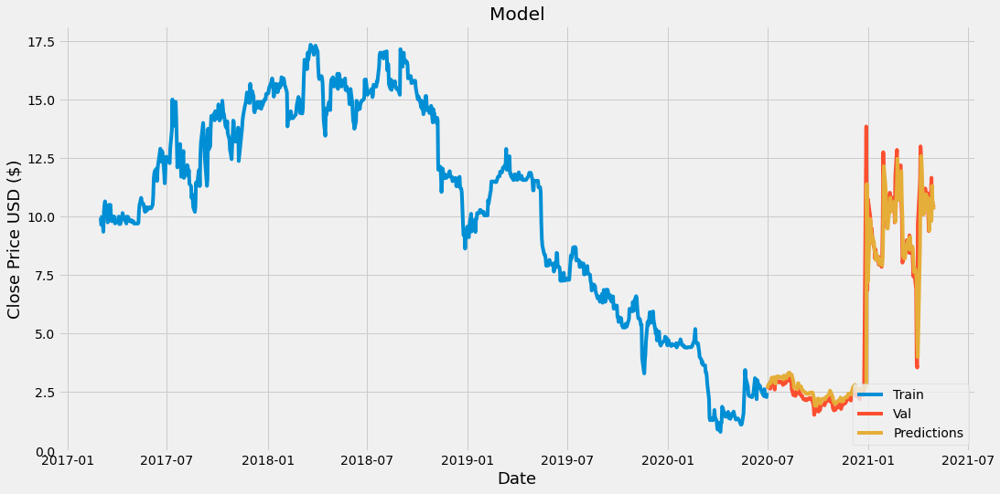

Accuracy: Close    0.002858
dtype: float64
Ticker Analyzed: ADAP
(1050, 6)
Epoch 1/10
780/780 [==============================] - 18s 21ms/step - loss: 0.0084 - mse: 0.0084 - mae: 0.0618 - mape: 5437.0442
Epoch 2/10
780/780 [==============================] - 15s 20ms/step - loss: 0.0026 - mse: 0.0026 - mae: 0.0359 - mape: 37054.3170
Epoch 3/10
780/780 [==============================] - 16s 20ms/step - loss: 0.0028 - mse: 0.0028 - mae: 0.0319 - mape: 16303.9050
Epoch 4/10
780/780 [==============================] - 16s 21ms/step - loss: 0.0013 - mse: 0.0013 - mae: 0.0250 - mape: 3720.1988
Epoch 5/10
780/780 [==============================] - 16s 21ms/step - loss: 0.0022 - mse: 0.0022 - mae: 0.0302 - mape: 670.0290
Epoch 6/10
780/780 [==============================] - 18s 23ms/step - loss: 0.0015 - mse: 0.0015 - mae: 0.0252 - mape: 13173.8395
Epoch 7/10
780/780 [==============================] - 20s 25ms/step - loss: 0.0011 - mse: 0.0011 - mae: 0.0220 - mape: 1645.3782
Epoch 8/10
780/780 [

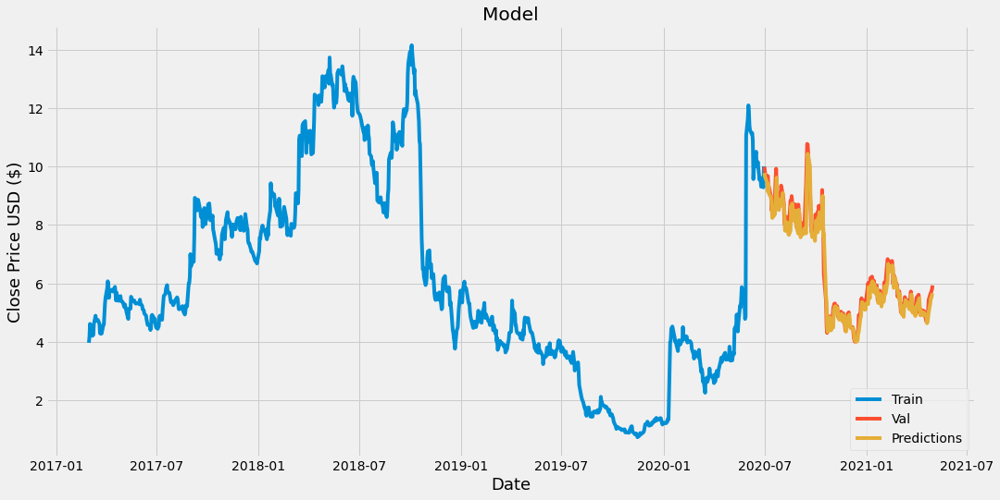

Accuracy: Close    0.009399
dtype: float64
Ticker Analyzed: ADBE
(1050, 6)
Epoch 1/10
780/780 [==============================] - 19s 21ms/step - loss: 0.0030 - mse: 0.0030 - mae: 0.0350 - mape: 15.7554
Epoch 2/10
780/780 [==============================] - 16s 21ms/step - loss: 7.8592e-04 - mse: 7.8592e-04 - mae: 0.0210 - mape: 8.9183
Epoch 3/10
780/780 [==============================] - 24s 30ms/step - loss: 8.0949e-04 - mse: 8.0949e-04 - mae: 0.0213 - mape: 8.35361s - loss: 8.2132e-0
Epoch 4/10
780/780 [==============================] - 18s 23ms/step - loss: 5.9764e-04 - mse: 5.9764e-04 - mae: 0.0186 - mape: 7.1995
Epoch 5/10
780/780 [==============================] - 16s 21ms/step - loss: 4.6685e-04 - mse: 4.6685e-04 - mae: 0.0163 - mape: 6.5353
Epoch 6/10
780/780 [==============================] - 22s 28ms/step - loss: 4.3318e-04 - mse: 4.3318e-04 - mae: 0.0152 - mape: 6.2598
Epoch 7/10
780/780 [==============================] - 24s 30ms/step - loss: 4.3645e-04 - mse: 4.3645e-04 - m

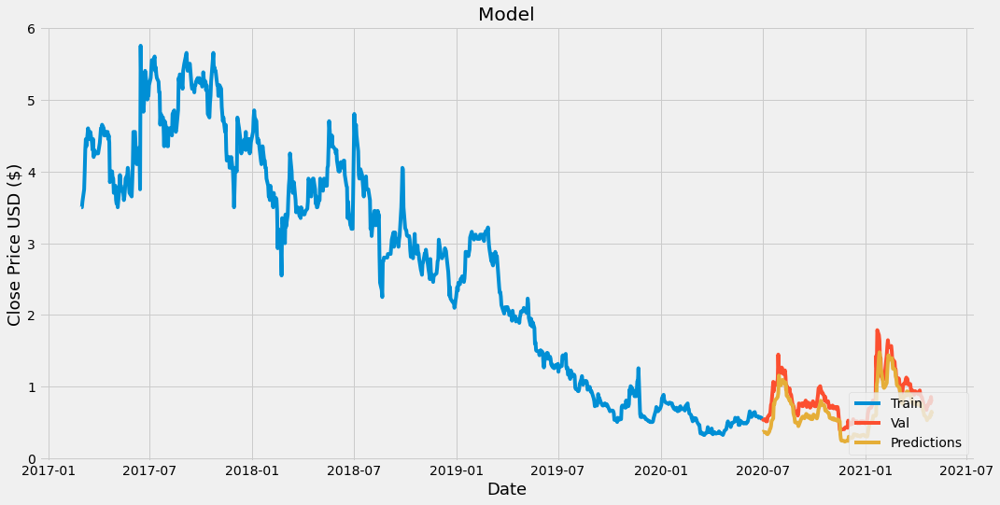

Accuracy: Close    0.031506
dtype: float64
Ticker Analyzed: ADMS
(1050, 6)
Epoch 1/10
780/780 [==============================] - 2086s 3s/step - loss: 0.0072 - mse: 0.0072 - mae: 0.0506 - mape: 3030.1952
Epoch 2/10
780/780 [==============================] - 28s 36ms/step - loss: 0.0027 - mse: 0.0027 - mae: 0.0346 - mape: 74595.1090
Epoch 3/10
780/780 [==============================] - 28s 36ms/step - loss: 0.0012 - mse: 0.0012 - mae: 0.0232 - mape: 1512.6760
Epoch 4/10
780/780 [==============================] - 25s 32ms/step - loss: 0.0011 - mse: 0.0011 - mae: 0.0232 - mape: 50551.8426
Epoch 5/10
780/780 [==============================] - 23s 30ms/step - loss: 9.3614e-04 - mse: 9.3614e-04 - mae: 0.0205 - mape: 37522.0335
Epoch 10/10
780/780 [==============================] - 23s 30ms/step - loss: 9.1701e-04 - mse: 9.1701e-04 - mae: 0.0203 - mape: 766.7855


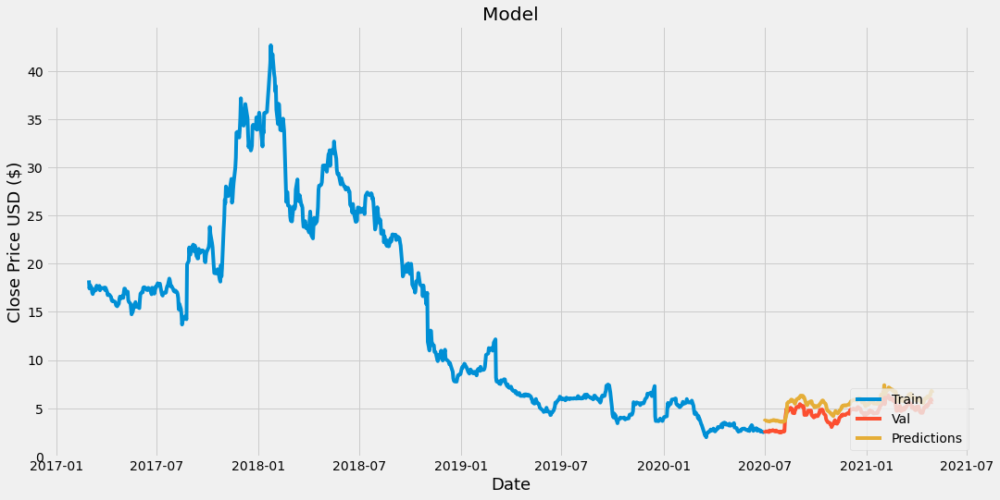

Accuracy: Close    0.023474
dtype: float64
Ticker Analyzed: ADN
(573, 6)
Epoch 1/10
399/399 [==============================] - 17s 30ms/step - loss: 2.8285e-04 - mse: 2.8285e-04 - mae: 0.0115 - mape: 28.5164
Epoch 2/10
399/399 [==============================] - 12s 29ms/step - loss: 4.0632e-05 - mse: 4.0632e-05 - mae: 0.0047 - mape: 10.7259
Epoch 3/10
399/399 [==============================] - 11s 29ms/step - loss: 5.7609e-05 - mse: 5.7609e-05 - mae: 0.0059 - mape: 12.9991
Epoch 4/10
399/399 [==============================] - 12s 30ms/step - loss: 4.4398e-05 - mse: 4.4398e-05 - mae: 0.0052 - mape: 11.4988
Epoch 5/10
399/399 [==============================] - 11s 29ms/step - loss: 4.3474e-05 - mse: 4.3474e-05 - mae: 0.0050 - mape: 10.8402
Epoch 6/10
780/780 [==============================] - 22s 28ms/step - loss: 0.0012 - mse: 0.0012 - mae: 0.0255 - mape: 26267.1551
Epoch 4/10
780/780 [==============================] - 21s 27ms/step - loss: 9.0788e-04 - mse: 9.0788e-04 - mae: 0.0223 - m

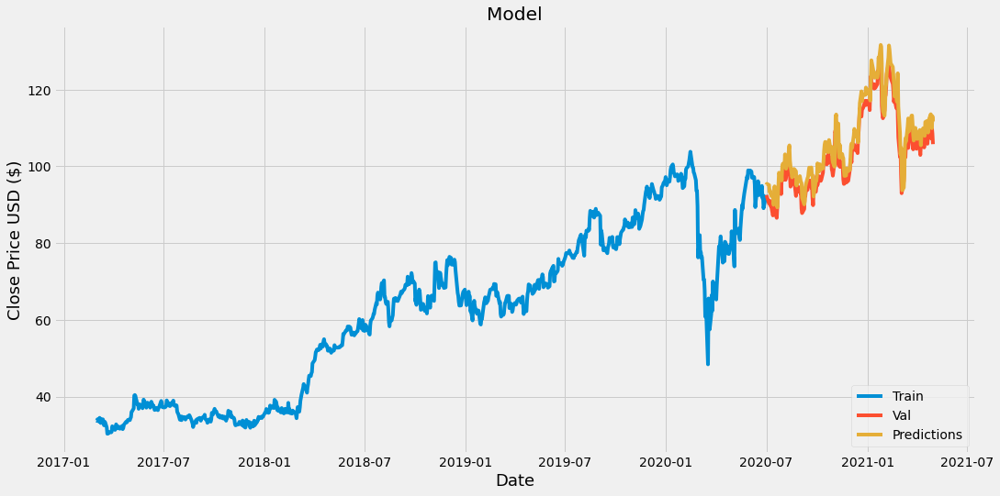

Accuracy: Close    0.029402
dtype: float64
Ticker Analyzed: ADV
(335, 6)
Epoch 1/10
208/208 [==============================] - 16s 49ms/step - loss: 0.0326 - mse: 0.0326 - mae: 0.1218 - mape: 1315309.0932
Epoch 2/10
208/208 [==============================] - 10s 49ms/step - loss: 0.0068 - mse: 0.0068 - mae: 0.0572 - mape: 198276.8145
Epoch 3/10
208/208 [==============================] - 10s 50ms/step - loss: 0.0061 - mse: 0.0061 - mae: 0.0500 - mape: 2044578.6363
Epoch 4/10
208/208 [==============================] - 12s 56ms/step - loss: 0.0042 - mse: 0.0042 - mae: 0.0447 - mape: 1097496.3687
Epoch 5/10
208/208 [==============================] - 11s 53ms/step - loss: 0.0045 - mse: 0.0045 - mae: 0.0477 - mape: 1398442.9288
Epoch 6/10
208/208 [==============================] - 11s 53ms/step - loss: 0.0053 - mse: 0.0053 - mae: 0.0481 - mape: 47418.7152
Epoch 7/10
780/780 [==============================] - 14s 18ms/step - loss: 7.4918e-04 - mse: 7.4918e-04 - mae: 0.0190 - mape: 26957.1151


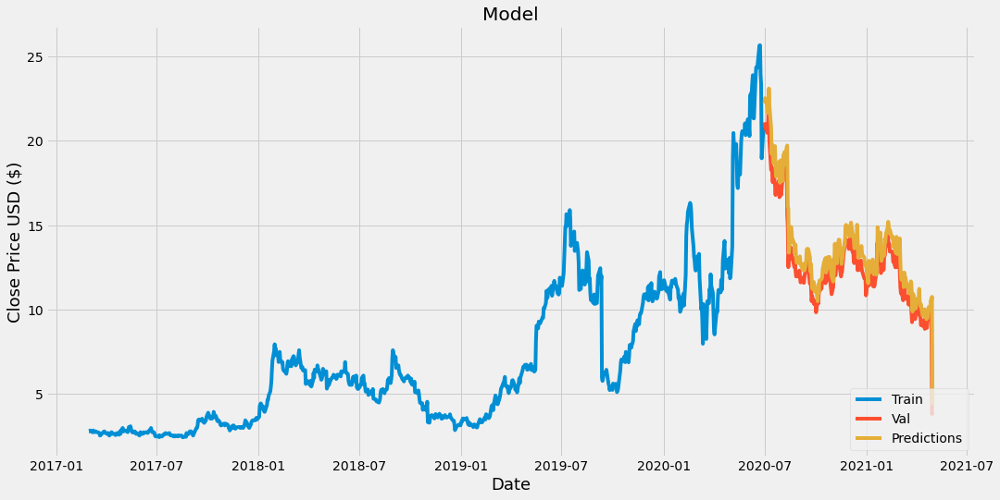

Accuracy: Close    0.038809
dtype: float64
Ticker Analyzed: ADX
(1050, 6)
Epoch 1/10
780/780 [==============================] - 16s 18ms/step - loss: 0.0093 - mse: 0.0093 - mae: 0.0581 - mape: 30301.0564
Epoch 2/10
780/780 [==============================] - 15s 19ms/step - loss: 0.0015 - mse: 0.0015 - mae: 0.0271 - mape: 82208.1548
Epoch 3/10
780/780 [==============================] - 15s 19ms/step - loss: 0.0017 - mse: 0.0017 - mae: 0.0287 - mape: 265740.8230
Epoch 4/10
186/186 [==============================] - 4s 19ms/step - loss: 0.0078 - mse: 0.0078 - mae: 0.0525 - mape: 26.5162
Epoch 4/10
186/186 [==============================] - 4s 20ms/step - loss: 0.0098 - mse: 0.0098 - mae: 0.0566 - mape: 29.1723
Epoch 5/10
186/186 [==============================] - 4s 21ms/step - loss: 0.0066 - mse: 0.0066 - mae: 0.0514 - mape: 30.0354
Epoch 6/10
186/186 [==============================] - 3s 19ms/step - loss: 0.0026 - mse: 0.0026 - mae: 0.0291 - mape: 13.9408
Epoch 7/10
186/186 [===========

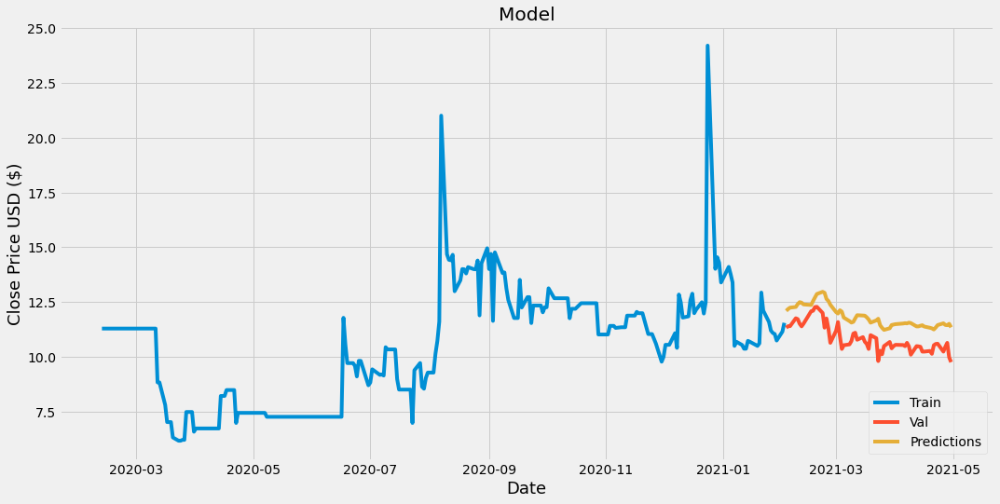

Accuracy: Close    0.054951
dtype: float64
Ticker Analyzed: ADXS
(1050, 6)
Epoch 1/10
780/780 [==============================] - 16s 18ms/step - loss: 0.0033 - mse: 0.0033 - mae: 0.0351 - mape: 64252.5645
Epoch 2/10
780/780 [==============================] - 14s 18ms/step - loss: 0.0013 - mse: 0.0013 - mae: 0.0249 - mape: 2366.5738
Epoch 3/10
780/780 [==============================] - 14s 18ms/step - loss: 0.0011 - mse: 0.0011 - mae: 0.0207 - mape: 67930.0489
Epoch 4/10
780/780 [==============================] - 14s 18ms/step - loss: 5.5639e-04 - mse: 5.5639e-04 - mae: 0.0152 - mape: 82640.6612
Epoch 5/10
780/780 [==============================] - 14s 18ms/step - loss: 7.6197e-04 - mse: 7.6197e-04 - mae: 0.0178 - mape: 1003.1500
Epoch 6/10
780/780 [==============================] - 14s 18ms/step - loss: 0.0029 - mse: 0.0029 - mae: 0.0412 - mape: 85738.0981
Epoch 3/10
780/780 [==============================] - 14s 18ms/step - loss: 0.0023 - mse: 0.0023 - mae: 0.0359 - mape: 1144.9864
Ep

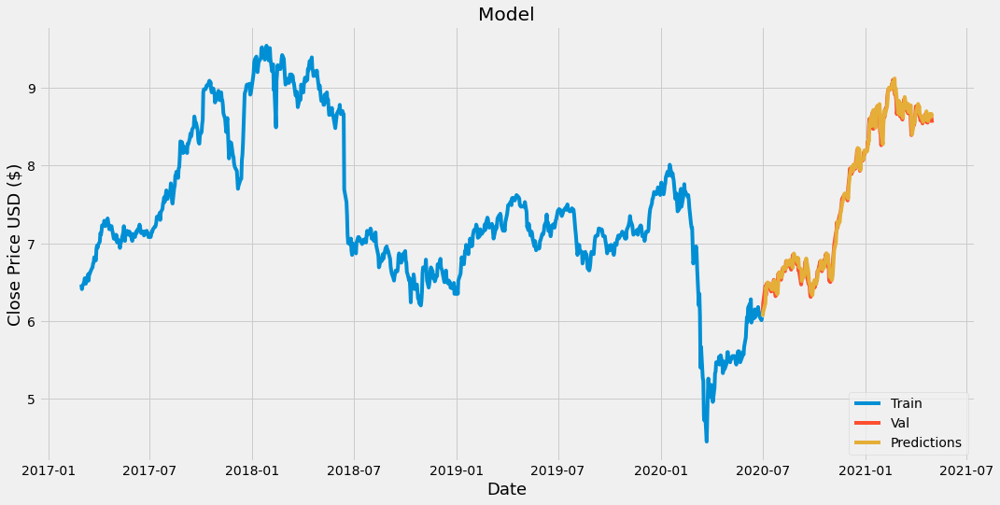

Accuracy: Close    0.001683
dtype: float64
Ticker Analyzed: AEFC
(382, 6)
Epoch 1/10
246/246 [==============================] - 8s 20ms/step - loss: 0.0301 - mse: 0.0301 - mae: 0.1101 - mape: 438309.8377
Epoch 2/10
246/246 [==============================] - 6s 23ms/step - loss: 0.0093 - mse: 0.0093 - mae: 0.0602 - mape: 1325666.0653
Epoch 3/10
246/246 [==============================] - 5s 22ms/step - loss: 0.0102 - mse: 0.0102 - mae: 0.0564 - mape: 4706738.7064
Epoch 4/10
246/246 [==============================] - 5s 19ms/step - loss: 0.0066 - mse: 0.0066 - mae: 0.0537 - mape: 836968.1712
Epoch 5/10
246/246 [==============================] - 5s 21ms/step - loss: 0.0060 - mse: 0.0060 - mae: 0.0517 - mape: 2578721.5969
Epoch 6/10
246/246 [==============================] - 5s 21ms/step - loss: 0.0032 - mse: 0.0032 - mae: 0.0339 - mape: 292874.4916
Epoch 7/10
780/780 [==============================] - 17s 22ms/step - loss: 9.8253e-04 - mse: 9.8253e-04 - mae: 0.0243 - mape: 1835.5240
Epoch 

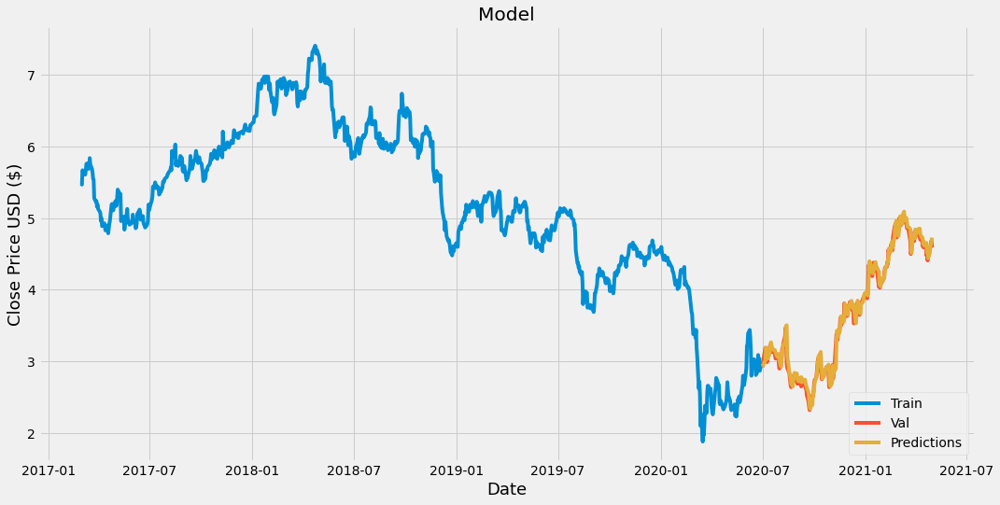

Accuracy: Close    0.003281
dtype: float64
Ticker Analyzed: AEGN
(1050, 6)
Epoch 1/10
780/780 [==============================] - 19s 22ms/step - loss: 0.0110 - mse: 0.0110 - mae: 0.0664 - mape: 16616.2400
Epoch 2/10
780/780 [==============================] - 17s 21ms/step - loss: 9.9839e-04 - mse: 9.9839e-04 - mae: 0.0228 - mape: 25987.9767
Epoch 10/10
780/780 [==============================] - 16s 20ms/step - loss: 0.0011 - mse: 0.0011 - mae: 0.0243 - mape: 53832.8298


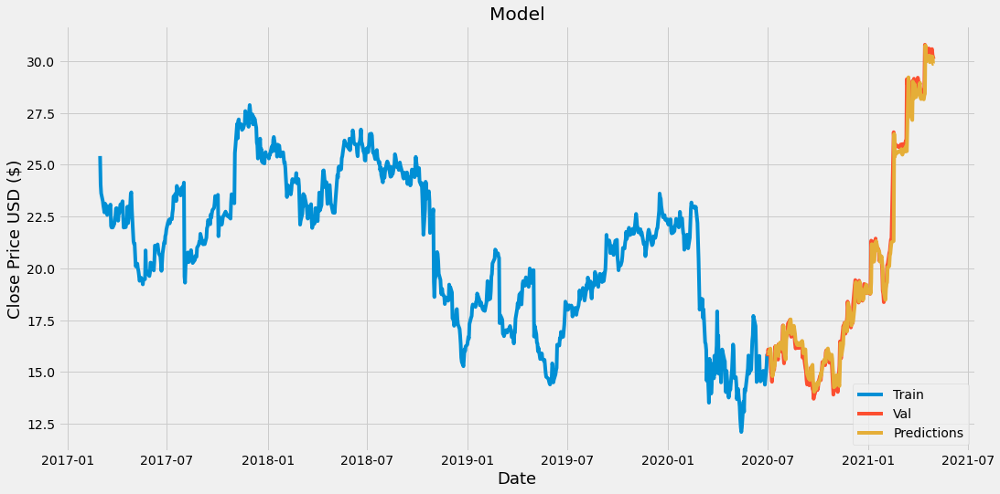

Accuracy: Close    0.004813
dtype: float64
Ticker Analyzed: AEHL
(1050, 6)
Epoch 1/10
780/780 [==============================] - 20s 22ms/step - loss: 0.0073 - mse: 0.0073 - mae: 0.0527 - mape: 57720.0162
Epoch 2/10
780/780 [==============================] - 16s 20ms/step - loss: 0.0027 - mse: 0.0027 - mae: 0.0301 - mape: 13155.4611
Epoch 3/10
780/780 [==============================] - 16s 20ms/step - loss: 0.0013 - mse: 0.0013 - mae: 0.0247 - mape: 11334.8840
Epoch 4/10
780/780 [==============================] - 16s 21ms/step - loss: 0.0011 - mse: 0.0011 - mae: 0.0218 - mape: 19624.7952
Epoch 5/10
780/780 [==============================] - 18s 20ms/step - loss: 0.0056 - mse: 0.0056 - mae: 0.0523 - mape: 68494.6836
Epoch 2/10
780/780 [==============================] - 16s 21ms/step - loss: 0.0013 - mse: 0.0013 - mae: 0.0281 - mape: 70321.2604
Epoch 3/10
780/780 [==============================] - 16s 20ms/step - loss: 0.0011 - mse: 0.0011 - mae: 0.0243 - mape: 5675.5374
Epoch 4/10
780/7

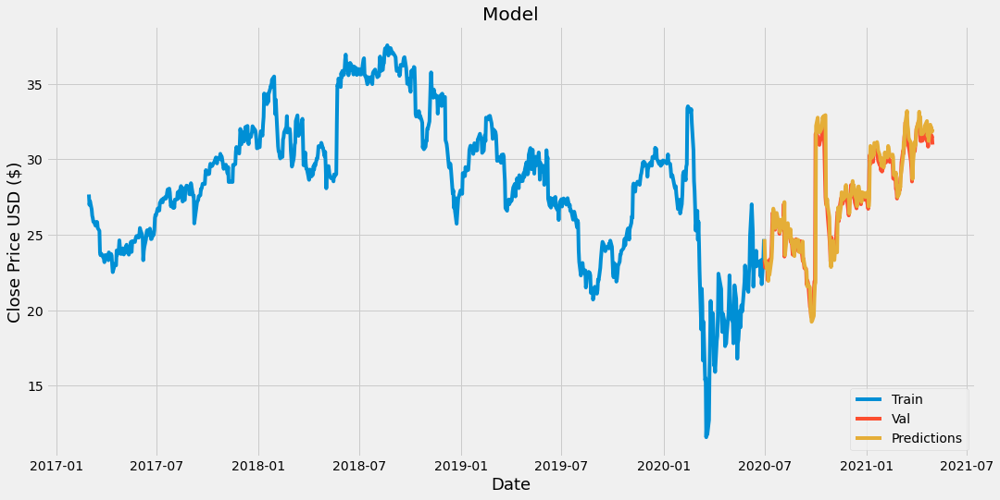

Accuracy: Close    0.007214
dtype: float64
Error on AEL^A!
Error on AEL^B!
Ticker Analyzed: AEM
(1050, 6)
Epoch 1/10
780/780 [==============================] - 18s 20ms/step - loss: 0.0046 - mse: 0.0046 - mae: 0.0471 - mape: 45929.4803
Epoch 2/10
780/780 [==============================] - 16s 21ms/step - loss: 0.0016 - mse: 0.0016 - mae: 0.0302 - mape: 5283.0459
Epoch 3/10
780/780 [==============================] - 20s 22ms/step - loss: 0.0022 - mse: 0.0022 - mae: 0.0313 - mape: 45834.4221
Epoch 2/10
780/780 [==============================] - 16s 20ms/step - loss: 0.0010 - mse: 0.0010 - mae: 0.0194 - mape: 18105.9180
Epoch 3/10
780/780 [==============================] - 16s 21ms/step - loss: 6.0904e-04 - mse: 6.0904e-04 - mae: 0.0177 - mape: 97626.6585
Epoch 4/10
780/780 [==============================] - 17s 22ms/step - loss: 4.8761e-04 - mse: 4.8761e-04 - mae: 0.0144 - mape: 30056.7177
Epoch 5/10
780/780 [==============================] - 15s 19ms/step - loss: 5.7571e-04 - mse: 5.757

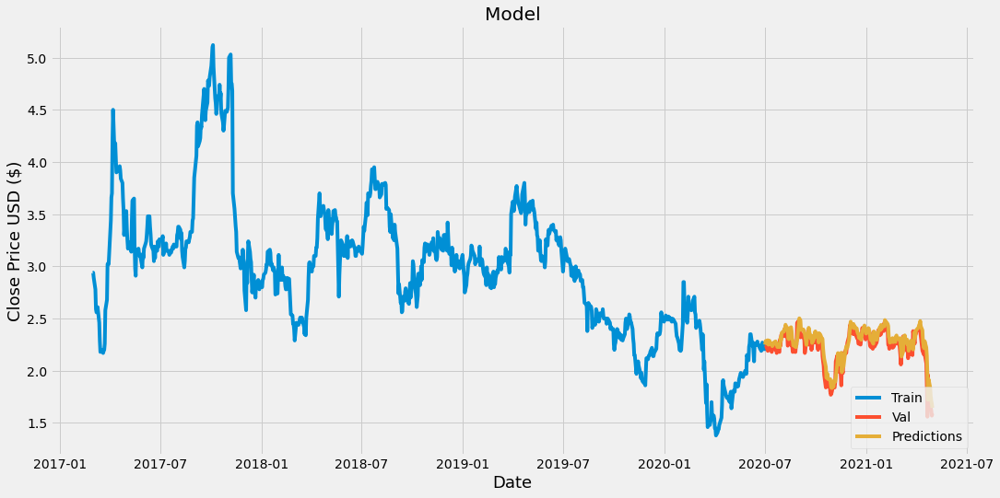

Accuracy: Close    0.013335
dtype: float64
Ticker Analyzed: AEO
(1050, 6)
Epoch 1/10
780/780 [==============================] - ETA: 0s - loss: 5.5479e-04 - mse: 5.5479e-04 - mae: 0.0182 - mape: 173596.015 - 15s 19ms/step - loss: 5.5456e-04 - mse: 5.5456e-04 - mae: 0.0182 - mape: 173227.2614
Epoch 10/10
780/780 [==============================] - 14s 18ms/step - loss: 5.0596e-04 - mse: 5.0596e-04 - mae: 0.0172 - mape: 576378.8044


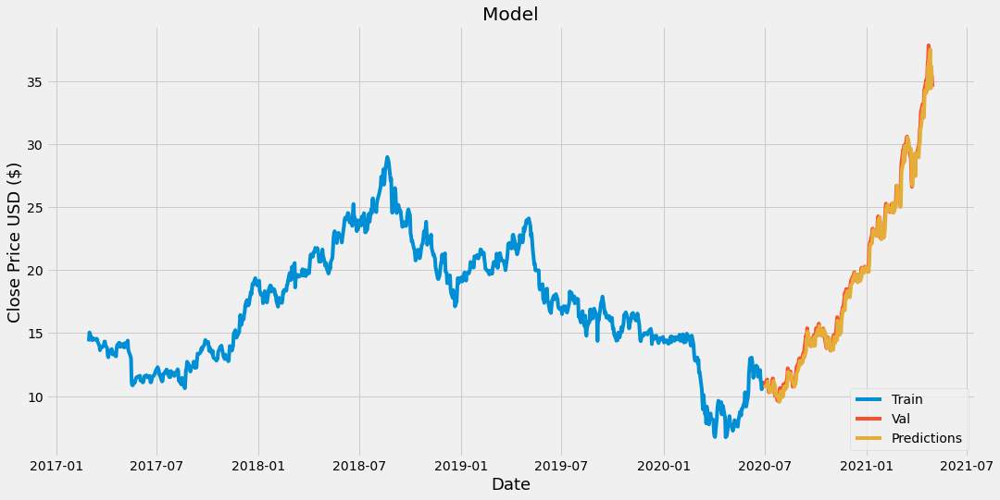

Accuracy: Close    0.006905
dtype: float64
Ticker Analyzed: AEP
(1050, 6)
Epoch 1/10
780/780 [==============================] - 16s 18ms/step - loss: 0.0131 - mse: 0.0131 - mae: 0.0655 - mape: 28878.6866
Epoch 2/10
780/780 [==============================] - 15s 19ms/step - loss: 0.0030 - mse: 0.0030 - mae: 0.0388 - mape: 7043.3410
Epoch 3/10
780/780 [==============================] - 14s 18ms/step - loss: 0.0032 - mse: 0.0032 - mae: 0.0369 - mape: 3943.2861
Epoch 4/10
780/780 [==============================] - 14s 18ms/step - loss: 0.0019 - mse: 0.0019 - mae: 0.0309 - mape: 897.4135
Epoch 5/10
780/780 [==============================] - 15s 19ms/step - loss: 0.0019 - mse: 0.0019 - mae: 0.0295 - mape: 36447.3456
Epoch 6/10
370/370 [==============================] - 7s 18ms/step - loss: 0.0061 - mse: 0.0061 - mae: 0.0485 - mape: 1095947.2166
Epoch 6/10
370/370 [==============================] - 7s 19ms/step - loss: 0.0070 - mse: 0.0070 - mae: 0.0574 - mape: 1837328.3345
Epoch 7/10
370/370

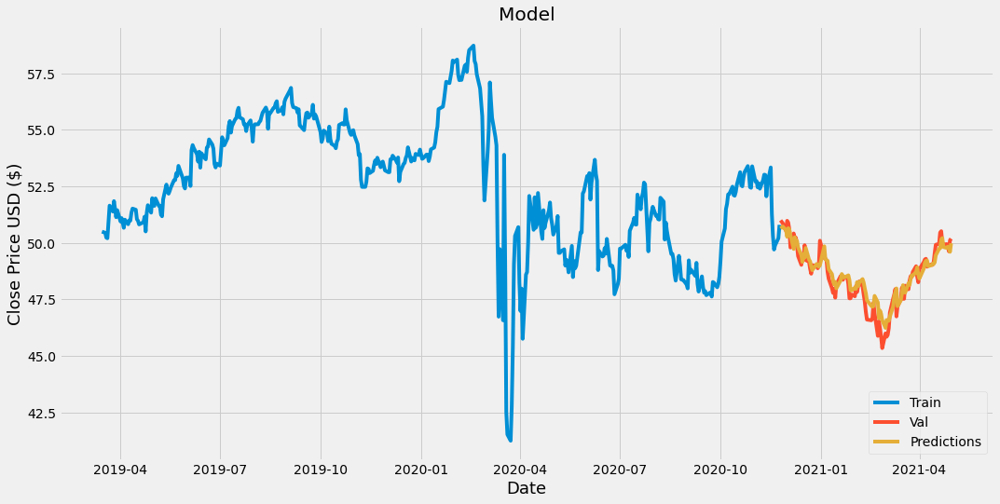

Accuracy: Close    0.007384
dtype: float64
Ticker Analyzed: AEPPZ
(181, 6)
Epoch 1/10
85/85 [==============================] - 3s 18ms/step - loss: 0.0513 - mse: 0.0513 - mae: 0.1620 - mape: 2655107.6384
Epoch 2/10
85/85 [==============================] - 2s 18ms/step - loss: 0.0122 - mse: 0.0122 - mae: 0.0882 - mape: 483505.5564
Epoch 3/10
85/85 [==============================] - 2s 18ms/step - loss: 0.0105 - mse: 0.0105 - mae: 0.0879 - mape: 1543021.5484
Epoch 4/10
85/85 [==============================] - 2s 18ms/step - loss: 0.0079 - mse: 0.0079 - mae: 0.0677 - mape: 910707.4212
Epoch 5/10
85/85 [==============================] - 1s 18ms/step - loss: 0.0080 - mse: 0.0080 - mae: 0.0727 - mape: 1593582.5342
Epoch 6/10
85/85 [==============================] - 2s 18ms/step - loss: 0.0089 - mse: 0.0089 - mae: 0.0753 - mape: 321842.9331
Epoch 7/10
85/85 [==============================] - 2s 18ms/step - loss: 0.0087 - mse: 0.0087 - mae: 0.0777 - mape: 582076.9322
Epoch 8/10
85/85 [========

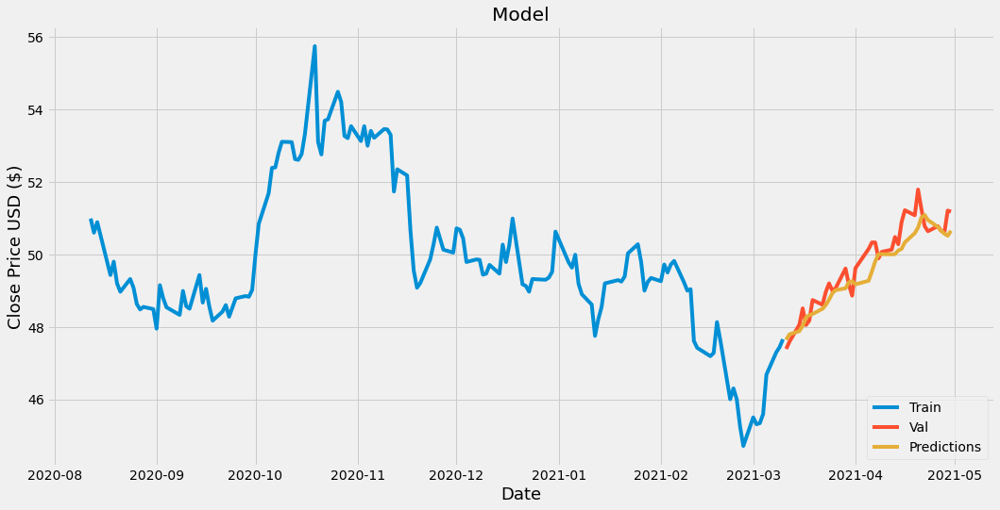

Accuracy: Close    0.022117
dtype: float64
Ticker Analyzed: AER
(1050, 6)
Epoch 1/10
780/780 [==============================] - 16s 18ms/step - loss: 0.0269 - mse: 0.0269 - mae: 0.0807 - mape: 72432.7407
Epoch 2/10
780/780 [==============================] - 14s 18ms/step - loss: 0.0025 - mse: 0.0025 - mae: 0.0362 - mape: 379038.8419
Epoch 3/10
456/780 [================>.............] - ETA: 5s - loss: 0.0030 - mse: 0.0030 - mae: 0.0403 - mape: 1756615.6661

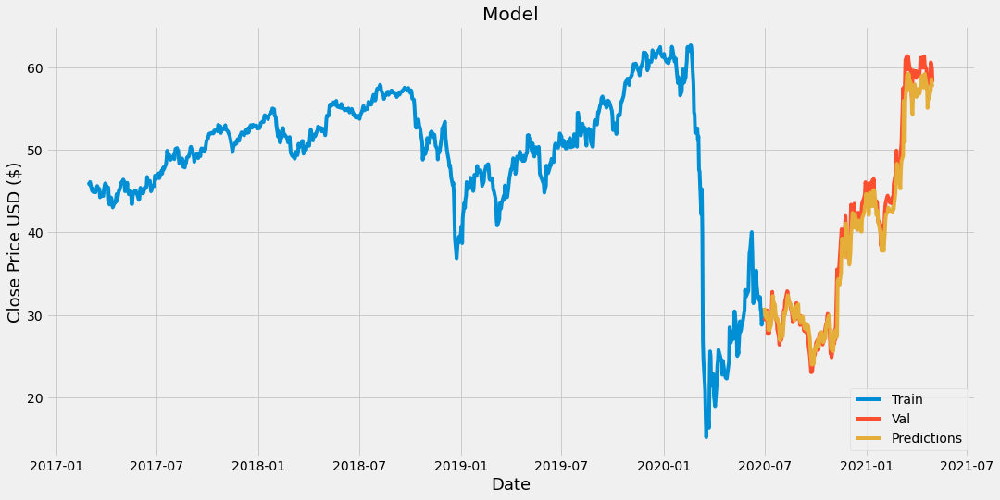

Accuracy: Close    0.018334
dtype: float64
Ticker Analyzed: AERI
(1050, 6)
Epoch 1/10
780/780 [==============================] - 16s 18ms/step - loss: 0.0165 - mse: 0.0165 - mae: 0.0772 - mape: 20.6928
Epoch 2/10
780/780 [==============================] - 14s 18ms/step - loss: 0.0028 - mse: 0.0028 - mae: 0.0380 - mape: 9.6329
Epoch 3/10
780/780 [==============================] - 14s 18ms/step - loss: 0.0016 - mse: 0.0016 - mae: 0.0308 - mape: 8.3303
Epoch 4/10
780/780 [==============================] - 14s 18ms/step - loss: 0.0012 - mse: 0.0012 - mae: 0.0252 - mape: 7.5746
Epoch 5/10
780/780 [==============================] - 14s 18ms/step - loss: 0.0012 - mse: 0.0012 - mae: 0.0262 - mape: 7.7962
Epoch 6/10
780/780 [==============================] - 14s 18ms/step - loss: 0.0011 - mse: 0.0011 - mae: 0.0249 - mape: 6.8356
Epoch 7/10
780/780 [==============================] - 14s 18ms/step - loss: 7.1474e-04 - mse: 7.1474e-04 - mae: 0.0188 - mape: 285431.4408
Epoch 5/10
780/780 [=========

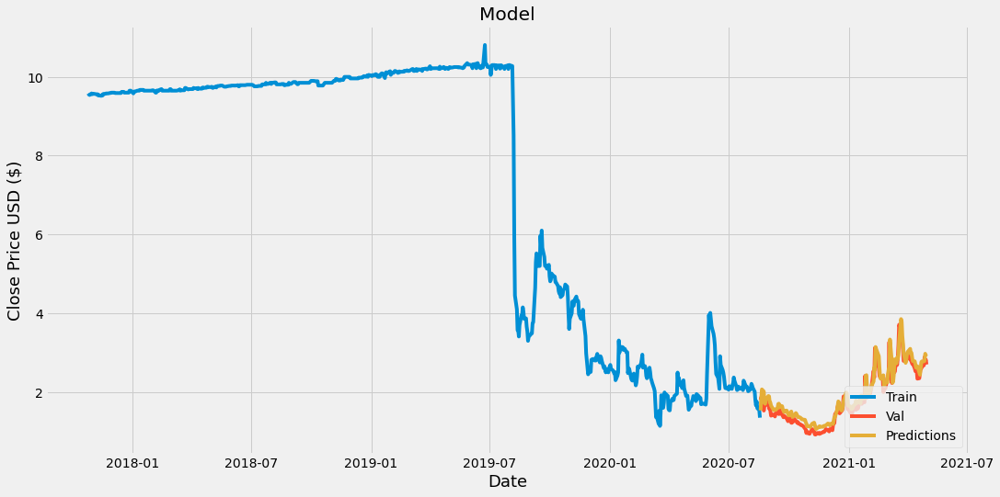

Accuracy: Close    0.011513
dtype: float64
Ticker Analyzed: AESR
(345, 6)
Epoch 1/10
216/216 [==============================] - 6s 18ms/step - loss: 0.0391 - mse: 0.0391 - mae: 0.1145 - mape: 553989.0903
Epoch 2/10
216/216 [==============================] - 4s 19ms/step - loss: 0.0050 - mse: 0.0050 - mae: 0.0530 - mape: 2194840.2790
Epoch 3/10
216/216 [==============================] - 4s 18ms/step - loss: 0.0032 - mse: 0.0032 - mae: 0.0418 - mape: 449890.2884
Epoch 4/10
216/216 [==============================] - 4s 18ms/step - loss: 0.0017 - mse: 0.0017 - mae: 0.0305 - mape: 478465.9299
Epoch 5/10
216/216 [==============================] - 4s 18ms/step - loss: 0.0022 - mse: 0.0022 - mae: 0.0357 - mape: 244426.6576
Epoch 6/10
216/216 [==============================] - 4s 18ms/step - loss: 0.0020 - mse: 0.0020 - mae: 0.0341 - mape: 257841.1139
Epoch 7/10
216/216 [==============================] - 4s 18ms/step - loss: 0.0019 - mse: 0.0019 - mae: 0.0340 - mape: 833071.6450
Epoch 8/10
216/

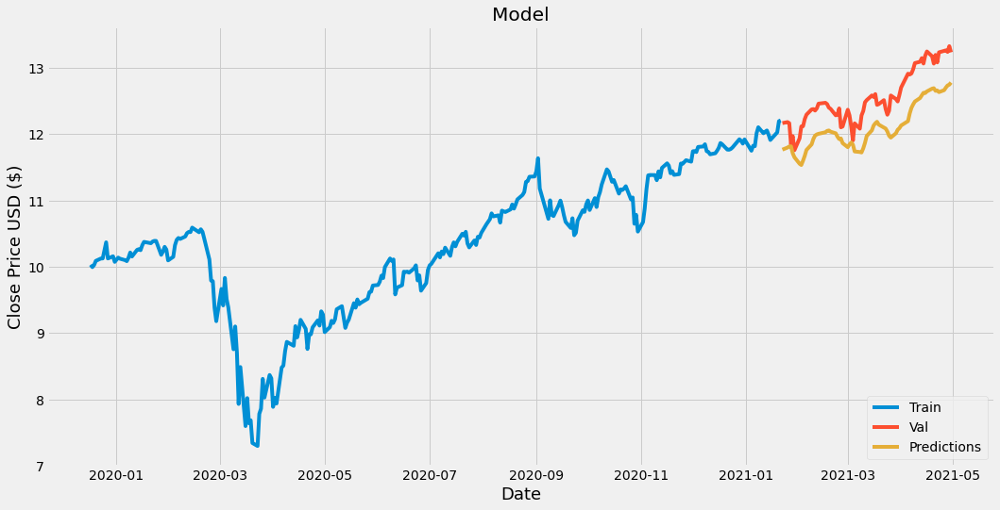

Accuracy: Close    0.073085
dtype: float64
Ticker Analyzed: AEVA
(297, 6)
Epoch 1/10
178/178 [==============================] - 5s 18ms/step - loss: 0.0272 - mse: 0.0272 - mae: 0.1121 - mape: 63.1597
Epoch 2/10
178/178 [==============================] - 3s 18ms/step - loss: 0.0070 - mse: 0.0070 - mae: 0.0506 - mape: 23.0038
Epoch 3/10
178/178 [==============================] - 3s 18ms/step - loss: 0.0059 - mse: 0.0059 - mae: 0.0437 - mape: 26.7553
Epoch 4/10
178/178 [==============================] - 3s 18ms/step - loss: 0.0097 - mse: 0.0097 - mae: 0.0589 - mape: 23.6415
Epoch 5/10
178/178 [==============================] - 3s 18ms/step - loss: 0.0067 - mse: 0.0067 - mae: 0.0535 - mape: 29.8720
Epoch 6/10
178/178 [==============================] - 3s 18ms/step - loss: 0.0117 - mse: 0.0117 - mae: 0.0615 - mape: 26.0713
Epoch 7/10
178/178 [==============================] - 3s 18ms/step - loss: 0.0048 - mse: 0.0048 - mae: 0.0409 - mape: 19.3787
Epoch 8/10
780/780 [========================

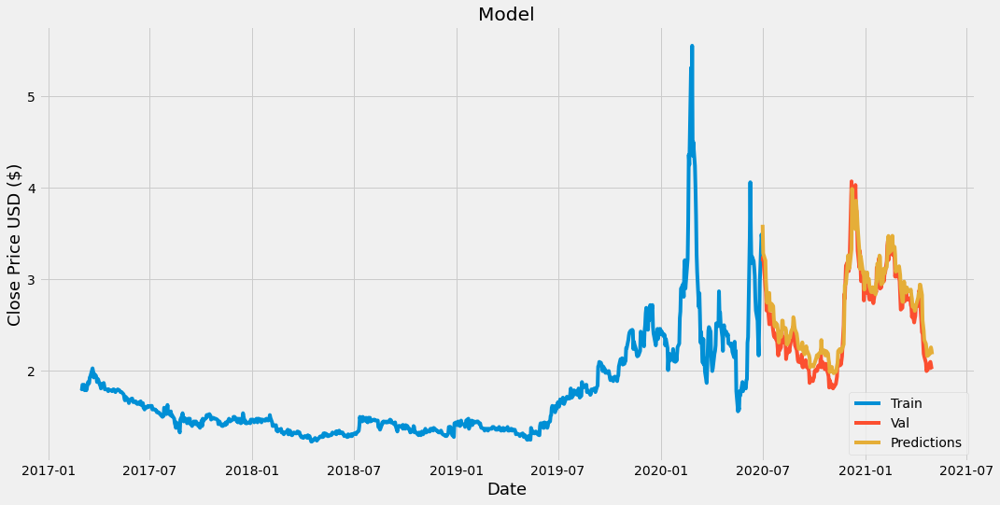

Accuracy: Close    0.025253
dtype: float64
Ticker Analyzed: AEYE
(1050, 6)
Epoch 1/10
780/780 [==============================] - 16s 18ms/step - loss: 7.2202e-04 - mse: 7.2202e-04 - mae: 0.0196 - mape: 50335.9573
Epoch 2/10
780/780 [==============================] - 14s 18ms/step - loss: 2.9403e-04 - mse: 2.9403e-04 - mae: 0.0125 - mape: 22823.1815
Epoch 3/10
780/780 [==============================] - 14s 18ms/step - loss: 2.2426e-04 - mse: 2.2426e-04 - mae: 0.0115 - mape: 692.3754
Epoch 4/10
780/780 [==============================] - 15s 19ms/step - loss: 0.0027 - mse: 0.0027 - mae: 0.0379 - mape: 15.1627
Epoch 3/10
780/780 [==============================] - 14s 18ms/step - loss: 0.0020 - mse: 0.0020 - mae: 0.0309 - mape: 11.6722
Epoch 4/10
780/780 [==============================] - 15s 19ms/step - loss: 0.0016 - mse: 0.0016 - mae: 0.0264 - mape: 11.1704
Epoch 5/10
780/780 [==============================] - 14s 18ms/step - loss: 0.0011 - mse: 0.0011 - mae: 0.0228 - mape: 8.9067
Epoch 

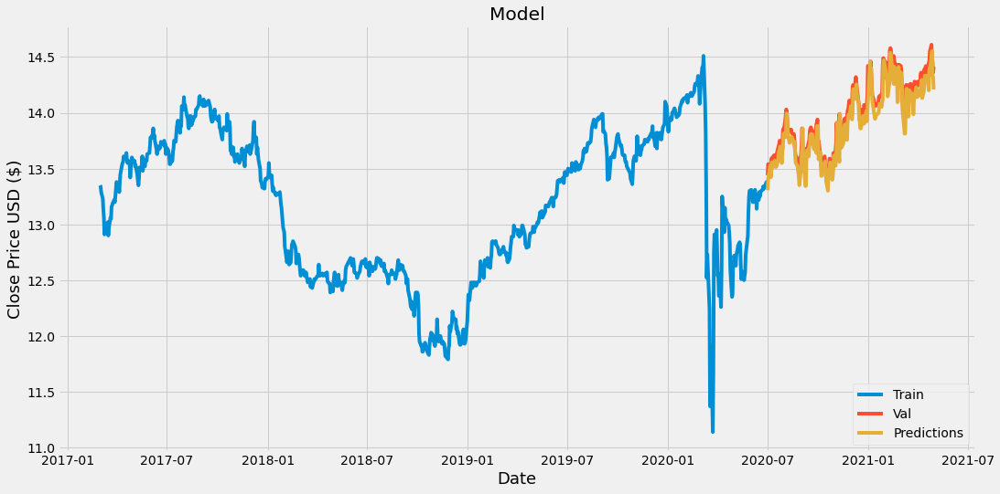

Accuracy: Close    0.023091
dtype: float64
Ticker Analyzed: AFBI
(1009, 6)
Epoch 1/10
748/748 [==============================] - 16s 19ms/step - loss: 0.0150 - mse: 0.0150 - mae: 0.0664 - mape: 199475.4224
Epoch 2/10
748/748 [==============================] - 14s 18ms/step - loss: 0.0016 - mse: 0.0016 - mae: 0.0282 - mape: 246410.4525
Epoch 3/10
780/780 [==============================] - 14s 18ms/step - loss: 0.0022 - mse: 0.0022 - mae: 0.0341 - mape: 28891.4599
Epoch 3/10
780/780 [==============================] - 14s 18ms/step - loss: 0.0019 - mse: 0.0019 - mae: 0.0289 - mape: 38846.6425
Epoch 4/10
780/780 [==============================] - 14s 18ms/step - loss: 0.0012 - mse: 0.0012 - mae: 0.0235 - mape: 78846.0526
Epoch 5/10
780/780 [==============================] - 14s 18ms/step - loss: 0.0014 - mse: 0.0014 - mae: 0.0254 - mape: 248983.7470
Epoch 6/10
780/780 [==============================] - 14s 18ms/step - loss: 0.0010 - mse: 0.0010 - mae: 0.0239 - mape: 274551.5921
Epoch 7/10


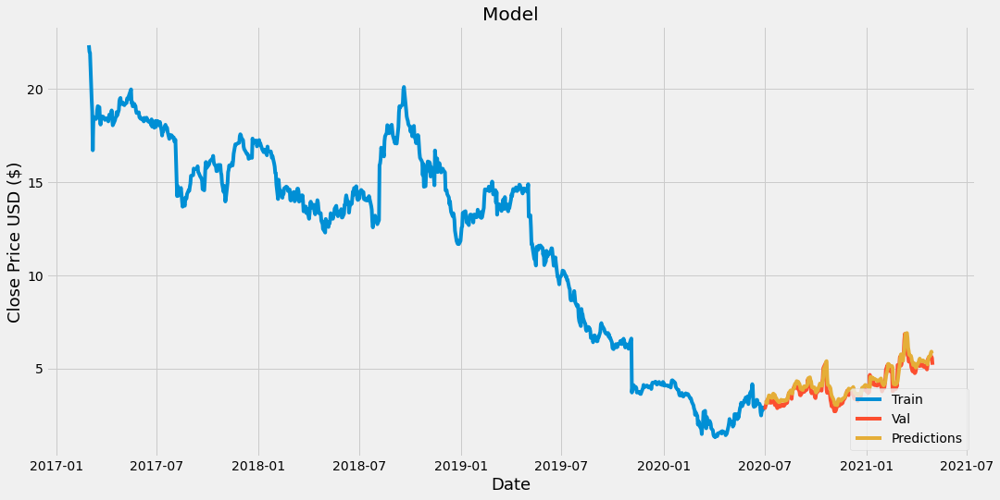

Accuracy: Close    0.010309
dtype: float64
Ticker Analyzed: AFIB
(185, 6)
Epoch 1/10
88/88 [==============================] - 5s 23ms/step - loss: 0.0589 - mse: 0.0589 - mae: 0.1789 - mape: 35.2257
Epoch 2/10
88/88 [==============================] - 2s 22ms/step - loss: 0.0180 - mse: 0.0180 - mae: 0.1055 - mape: 21.5216
Epoch 3/10
88/88 [==============================] - 2s 23ms/step - loss: 0.0114 - mse: 0.0114 - mae: 0.0888 - mape: 17.3474
Epoch 4/10
88/88 [==============================] - 3s 31ms/step - loss: 0.0094 - mse: 0.0094 - mae: 0.0773 - mape: 15.3793
Epoch 5/10
88/88 [==============================] - 3s 36ms/step - loss: 0.0134 - mse: 0.0134 - mae: 0.0917 - mape: 25.4887
Epoch 6/10
88/88 [==============================] - 4s 42ms/step - loss: 0.0103 - mse: 0.0103 - mae: 0.0757 - mape: 17.3519
Epoch 7/10
88/88 [==============================] - 3s 40ms/step - loss: 0.0047 - mse: 0.0047 - mae: 0.0494 - mape: 11.8801
Epoch 8/10
88/88 [==============================] - 3s 38m

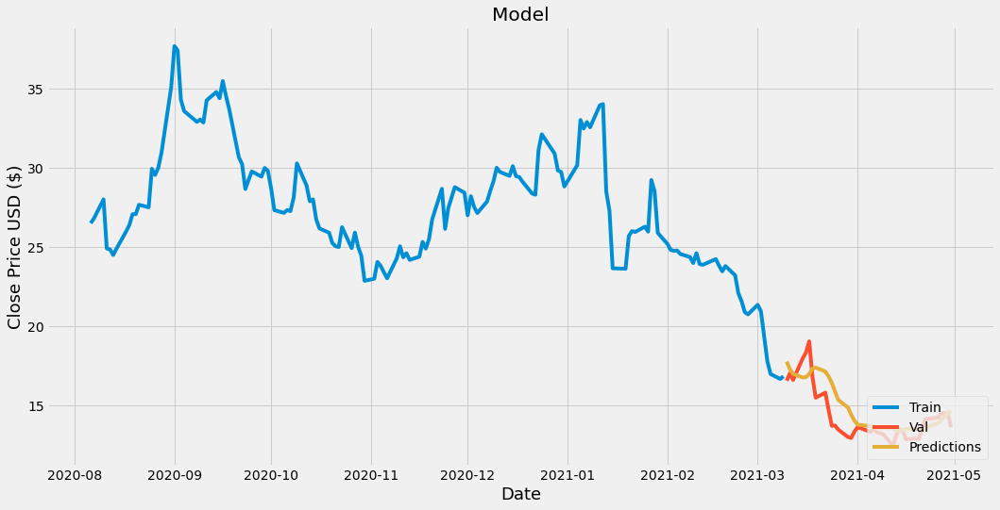

Accuracy: Close    0.018555
dtype: float64
Ticker Analyzed: AFIN
(701, 6)
Epoch 1/10
366/366 [==============================] - 7s 20ms/step - loss: 0.0032 - mse: 0.0032 - mae: 0.0367 - mape: 618629.1144
Epoch 6/10
366/366 [==============================] - 7s 20ms/step - loss: 0.0018 - mse: 0.0018 - mae: 0.0267 - mape: 186393.8339
Epoch 7/10
366/366 [==============================] - 12s 32ms/step - loss: 0.0017 - mse: 0.0017 - mae: 0.0269 - mape: 125442.7045
Epoch 8/10
366/366 [==============================] - 8s 21ms/step - loss: 0.0023 - mse: 0.0023 - mae: 0.0324 - mape: 7394.0198
Epoch 9/10
366/366 [==============================] - 9s 25ms/step - loss: 0.0021 - mse: 0.0021 - mae: 0.0286 - mape: 441709.1041
Epoch 10/10
366/366 [==============================] - 7s 20ms/step - loss: 0.0022 - mse: 0.0022 - mae: 0.0316 - mape: 982445.4483


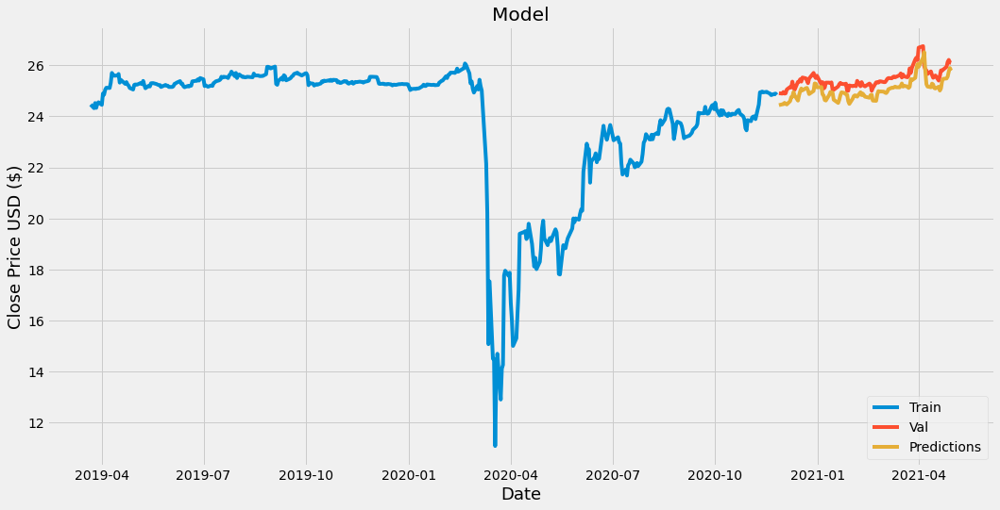

Accuracy: Close    0.02676
dtype: float64
Ticker Analyzed: AFL
(1050, 6)
Epoch 1/10
780/780 [==============================] - 18s 21ms/step - loss: 0.0138 - mse: 0.0138 - mae: 0.0756 - mape: 2240235.2950
Epoch 2/10
780/780 [==============================] - 14s 18ms/step - loss: 0.0028 - mse: 0.0028 - mae: 0.0384 - mape: 259488.2061
Epoch 3/10
780/780 [==============================] - 14s 18ms/step - loss: 0.0019 - mse: 0.0019 - mae: 0.0296 - mape: 207958.5835
Epoch 4/10
780/780 [==============================] - 17s 19ms/step - loss: 0.0028 - mse: 0.0028 - mae: 0.0348 - mape: 138634.0951
Epoch 2/10
780/780 [==============================] - 16s 21ms/step - loss: 0.0015 - mse: 0.0015 - mae: 0.0229 - mape: 9542.2169
Epoch 3/10
780/780 [==============================] - 16s 20ms/step - loss: 7.4907e-04 - mse: 7.4907e-04 - mae: 0.0164 - mape: 25460.03971s - loss:
Epoch 4/10
780/780 [==============================] - 16s 20ms/step - loss: 0.0018 - mse: 0.0018 - mae: 0.0208 - mape: 4833.3

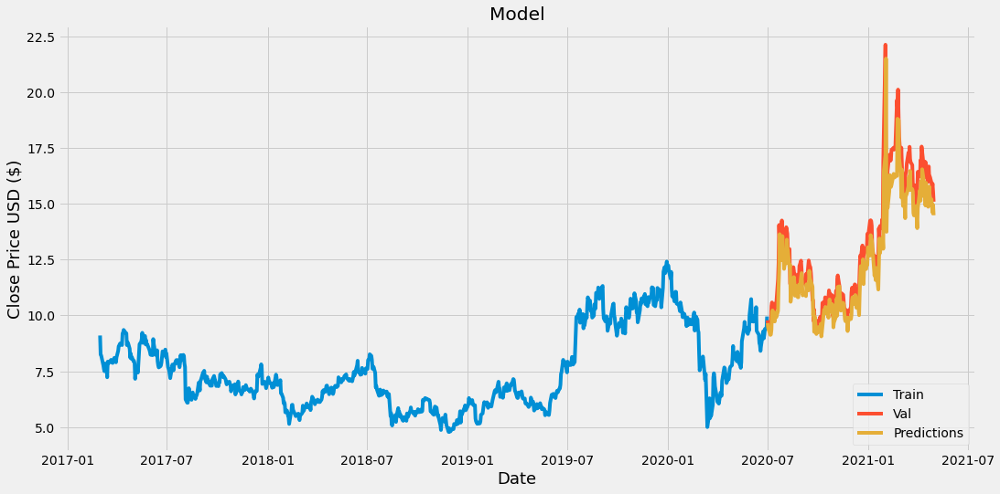

Accuracy: Close    0.042341
dtype: float64
Ticker Analyzed: AGBA
(442, 6)
Epoch 1/10
294/294 [==============================] - 8s 20ms/step - loss: 0.0131 - mse: 0.0131 - mae: 0.0757 - mape: 21.4786
Epoch 2/10
294/294 [==============================] - 5s 19ms/step - loss: 0.0073 - mse: 0.0073 - mae: 0.0547 - mape: 15.6927
Epoch 3/10
780/780 [==============================] - 17s 21ms/step - loss: 3.9358e-04 - mse: 3.9358e-04 - mae: 0.0149 - mape: 182512.4074
Epoch 4/10
780/780 [==============================] - 16s 21ms/step - loss: 3.1033e-04 - mse: 3.1033e-04 - mae: 0.0137 - mape: 23788.0852
Epoch 5/10
780/780 [==============================] - 17s 21ms/step - loss: 2.5517e-04 - mse: 2.5517e-04 - mae: 0.0126 - mape: 2295.8700
Epoch 6/10
780/780 [==============================] - 18s 23ms/step - loss: 2.7730e-04 - mse: 2.7730e-04 - mae: 0.0119 - mape: 496335.1059
Epoch 7/10
780/780 [==============================] - 16s 21ms/step - loss: 2.4324e-04 - mse: 2.4324e-04 - mae: 0.0118 - 

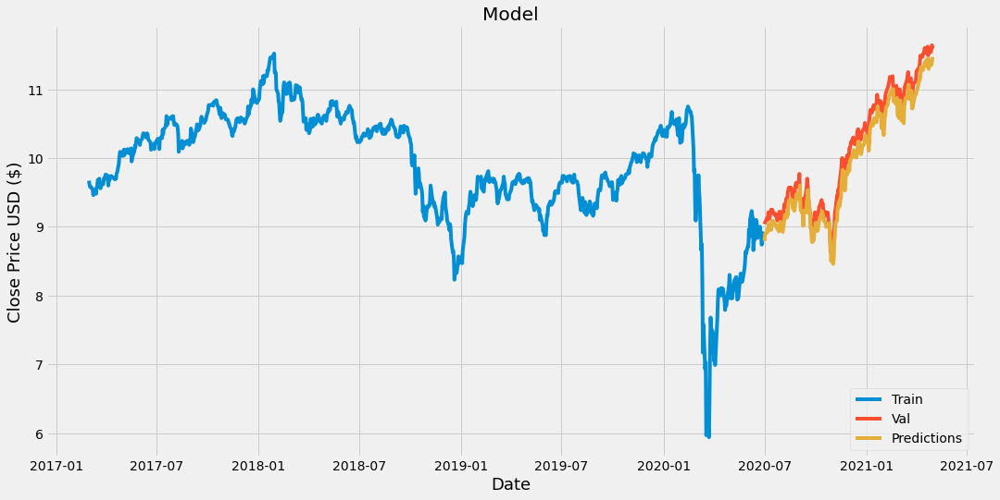

Accuracy: Close    0.0327
dtype: float64
Ticker Analyzed: AGE
(608, 6)
Epoch 1/10
780/780 [==============================] - 16s 20ms/step - loss: 0.0017 - mse: 0.0017 - mae: 0.0304 - mape: 36005.8139
Epoch 5/10
780/780 [==============================] - 17s 21ms/step - loss: 0.0015 - mse: 0.0015 - mae: 0.0289 - mape: 10675.7896
Epoch 6/10
780/780 [==============================] - 17s 21ms/step - loss: 0.0013 - mse: 0.0013 - mae: 0.0261 - mape: 61157.1126
Epoch 7/10
780/780 [==============================] - 16s 21ms/step - loss: 0.0018 - mse: 0.0018 - mae: 0.0307 - mape: 237274.1559
Epoch 8/10
780/780 [==============================] - 15s 20ms/step - loss: 0.0015 - mse: 0.0015 - mae: 0.0291 - mape: 49326.1566
Epoch 9/10
780/780 [==============================] - 18s 23ms/step - loss: 9.1804e-04 - mse: 9.1804e-04 - mae: 0.0225 - mape: 1544.1647
Epoch 7/10
780/780 [==============================] - 17s 22ms/step - loss: 8.3679e-04 - mse: 8.3679e-04 - mae: 0.0206 - mape: 47831.2194
Epo

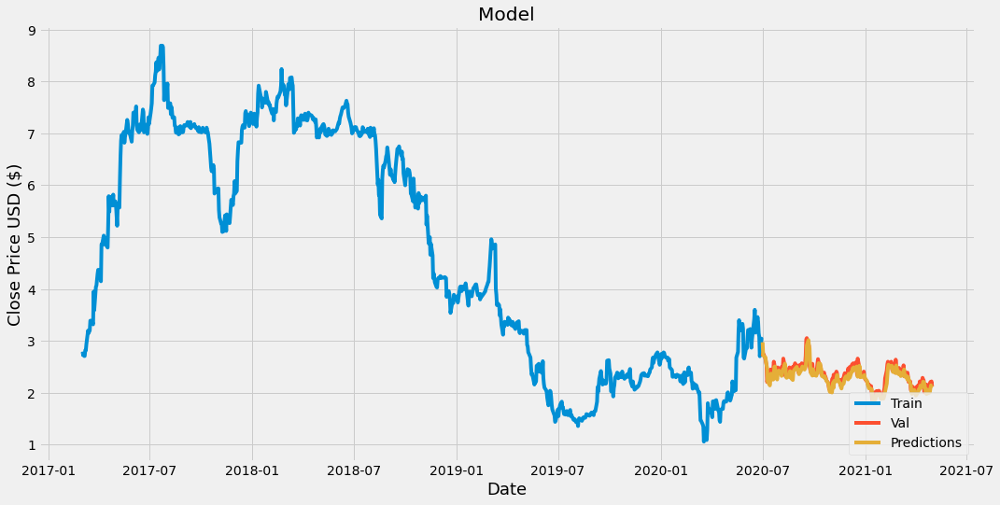

Accuracy: Close    0.007158
dtype: float64
Ticker Analyzed: AGFY
(65, 6)
Error on AGFY!
Ticker Analyzed: AGI
(1050, 6)
Epoch 1/10
780/780 [==============================] - 19s 21ms/step - loss: 0.0128 - mse: 0.0128 - mae: 0.0745 - mape: 108751.9668
Epoch 2/10
780/780 [==============================] - 16s 21ms/step - loss: 0.0029 - mse: 0.0029 - mae: 0.0410 - mape: 158.6930
Epoch 3/10
780/780 [==============================] - 16s 21ms/step - loss: 0.0020 - mse: 0.0020 - mae: 0.0340 - mape: 82914.6759
Epoch 4/10
780/780 [==============================] - 17s 22ms/step - loss: 0.0016 - mse: 0.0016 - mae: 0.0311 - mape: 96774.8637
Epoch 5/10
780/780 [==============================] - 17s 21ms/step - loss: 0.0015 - mse: 0.0015 - mae: 0.0301 - mape: 24103.7387
Epoch 6/10
780/780 [==============================] - 14s 18ms/step - loss: 0.0026 - mse: 0.0026 - mae: 0.0376 - mape: 40002.7634
Epoch 5/10
780/780 [==============================] - 14s 18ms/step - loss: 0.0024 - mse: 0.0024 - mae

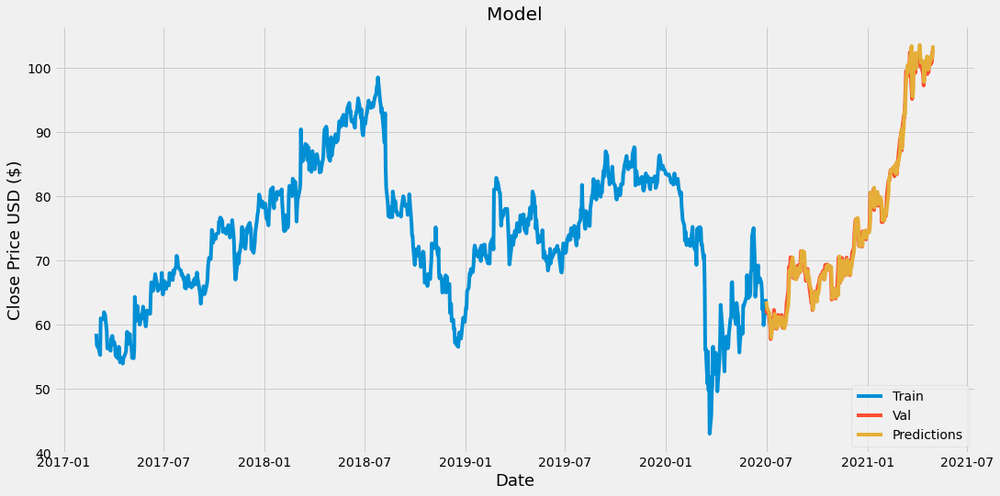

Accuracy: Close    0.000298
dtype: float64
Error on AGM^C!
Error on AGM^D!
Error on AGM^E!
Error on AGM^F!
Ticker Analyzed: AGMH
(765, 6)
Epoch 1/10
552/552 [==============================] - 16s 22ms/step - loss: 0.0143 - mse: 0.0143 - mae: 0.0796 - mape: 20.5299
Epoch 2/10
552/552 [==============================] - 13s 24ms/step - loss: 0.0057 - mse: 0.0057 - mae: 0.0497 - mape: 12.7506
Epoch 3/10
552/552 [==============================] - 11s 20ms/step - loss: 0.0036 - mse: 0.0036 - mae: 0.0437 - mape: 11.9944
Epoch 4/10
780/780 [==============================] - 16s 21ms/step - loss: 0.0013 - mse: 0.0013 - mae: 0.0233 - mape: 3584.3157
Epoch 6/10
780/780 [==============================] - 17s 22ms/step - loss: 9.7513e-04 - mse: 9.7513e-04 - mae: 0.0202 - mape: 86581.3768
Epoch 7/10
780/780 [==============================] - 18s 23ms/step - loss: 9.3841e-04 - mse: 9.3841e-04 - mae: 0.0208 - mape: 134380.4935
Epoch 8/10
780/780 [==============================] - 17s 21ms/step - loss:

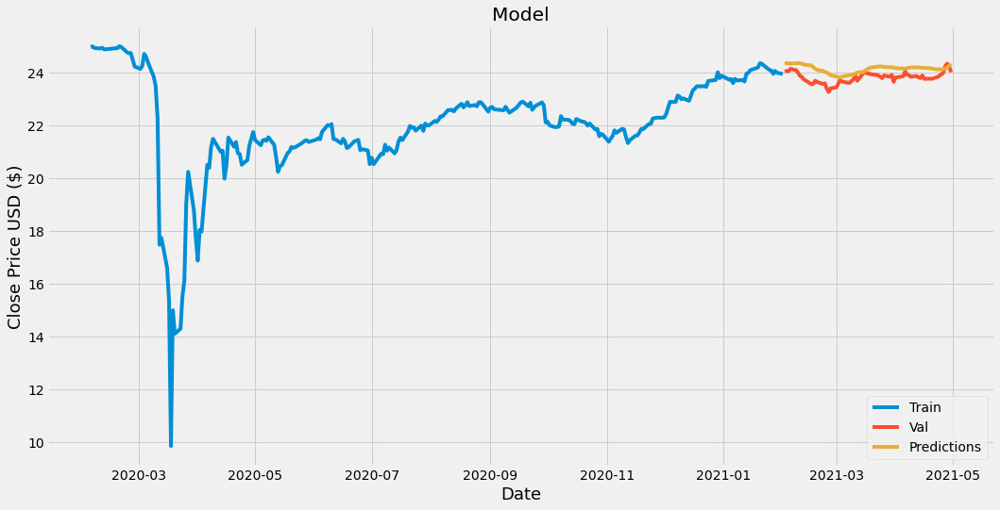

Accuracy: Close    0.020838
dtype: float64
Ticker Analyzed: AGO
(1050, 6)
Epoch 1/10
780/780 [==============================] - 17s 19ms/step - loss: 0.0213 - mse: 0.0213 - mae: 0.0808 - mape: 23.7126
Epoch 2/10
780/780 [==============================] - 1673s 2s/step - loss: 0.0013 - mse: 0.0013 - mae: 0.0242 - mape: 11.2663
Epoch 6/10
780/780 [==============================] - 24s 31ms/step - loss: 0.0013 - mse: 0.0013 - mae: 0.0248 - mape: 5.8409
Epoch 7/10
780/780 [==============================] - 20s 26ms/step - loss: 0.0010 - mse: 0.0010 - mae: 0.0230 - mape: 6.0737
Epoch 8/10
780/780 [==============================] - 19s 25ms/step - loss: 0.0011 - mse: 0.0011 - mae: 0.0246 - mape: 5.4187
Epoch 9/10
780/780 [==============================] - 18s 23ms/step - loss: 0.0012 - mse: 0.0012 - mae: 0.0246 - mape: 7.8093
Epoch 10/10
780/780 [==============================] - 15s 19ms/step - loss: 0.0018 - mse: 0.0018 - mae: 0.0296 - mape: 523982.0604


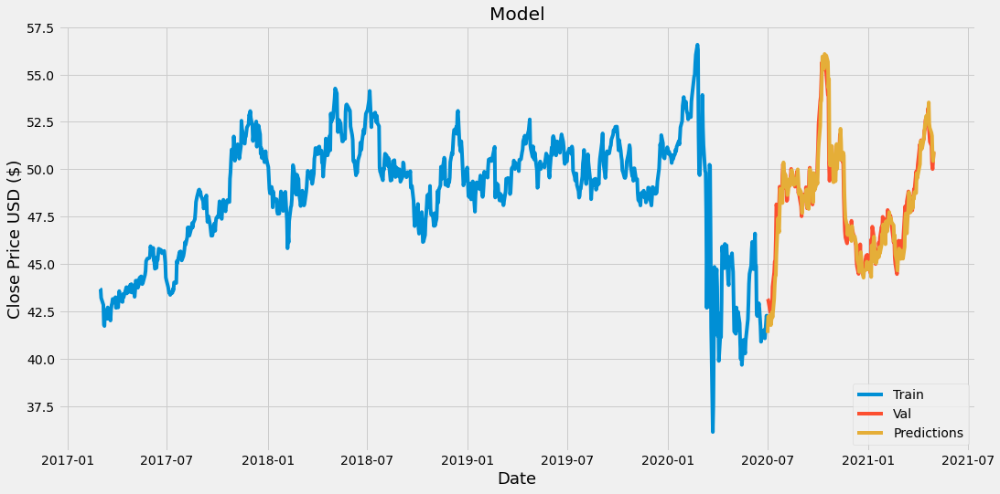

Accuracy: Close    0.004381
dtype: float64
Ticker Analyzed: AGRO
(1050, 6)
Epoch 1/10
780/780 [==============================] - 16s 18ms/step - loss: 0.0221 - mse: 0.0221 - mae: 0.0739 - mape: 29392.7912
Epoch 2/10
780/780 [==============================] - 15s 19ms/step - loss: 0.0017 - mse: 0.0017 - mae: 0.0320 - mape: 11106.9760
Epoch 3/10
780/780 [==============================] - 14s 19ms/step - loss: 0.0016 - mse: 0.0016 - mae: 0.0305 - mape: 37856.0383
Epoch 4/10
780/780 [==============================] - 15s 19ms/step - loss: 0.0012 - mse: 0.0012 - mae: 0.0258 - mape: 86461.1735
Epoch 5/10
780/780 [==============================] - 23s 30ms/step - loss: 0.0011 - mse: 0.0011 - mae: 0.0249 - mape: 3243.2659
Epoch 6/10
780/780 [==============================] - 16s 21ms/step - loss: 0.0014 - mse: 0.0014 - mae: 0.0246 - mape: 510.2271
Epoch 8/10
780/780 [==============================] - 15s 19ms/step - loss: 0.0014 - mse: 0.0014 - mae: 0.0238 - mape: 3331.4767
Epoch 9/10
780/780 

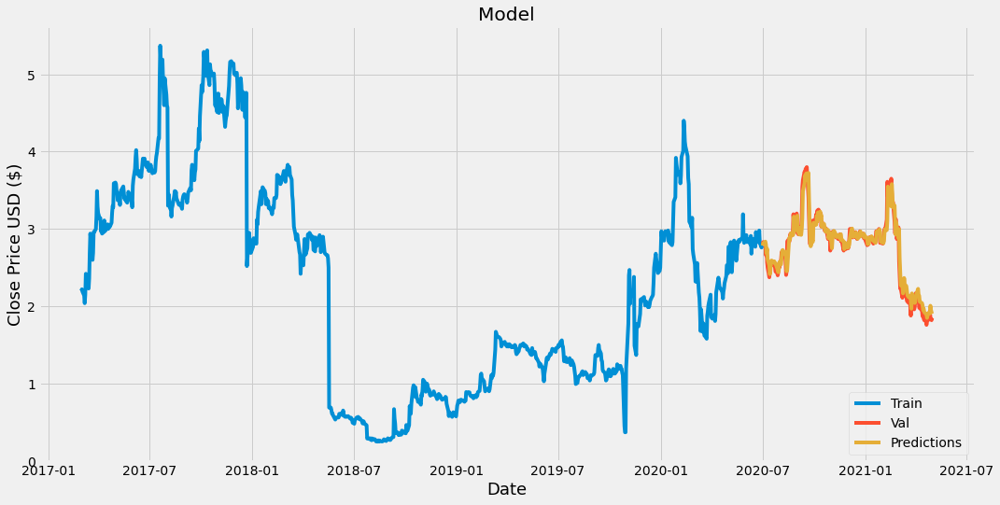

Accuracy: Close    0.003529
dtype: float64
Ticker Analyzed: AGS
(821, 6)
Epoch 1/10
597/597 [==============================] - 15s 20ms/step - loss: 0.0195 - mse: 0.0195 - mae: 0.0742 - mape: 186578.1554
Epoch 2/10
597/597 [==============================] - 14s 24ms/step - loss: 0.0022 - mse: 0.0022 - mae: 0.0338 - mape: 113370.5325
Epoch 3/10
780/780 [==============================] - 15s 19ms/step - loss: 0.0015 - mse: 0.0015 - mae: 0.0261 - mape: 18229.4232
Epoch 7/10
780/780 [==============================] - 15s 19ms/step - loss: 0.0024 - mse: 0.0024 - mae: 0.0280 - mape: 58283.5601
Epoch 8/10
780/780 [==============================] - 14s 18ms/step - loss: 0.0021 - mse: 0.0021 - mae: 0.0293 - mape: 95159.1165
Epoch 9/10
780/780 [==============================] - 14s 18ms/step - loss: 0.0023 - mse: 0.0023 - mae: 0.0305 - mape: 199705.6097
Epoch 10/10
780/780 [==============================] - 14s 18ms/step - loss: 0.0050 - mse: 0.0050 - mae: 0.0377 - mape: 27333.7703


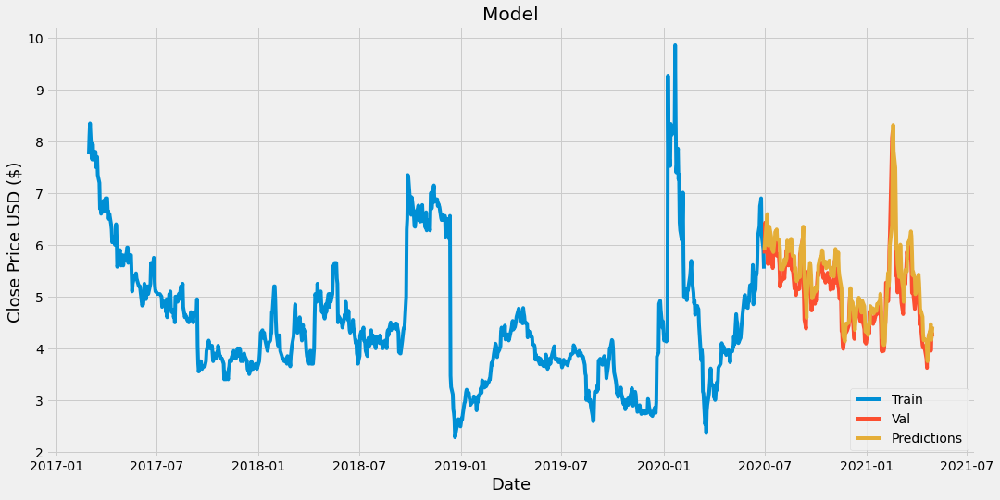

Accuracy: Close    0.030197
dtype: float64
Ticker Analyzed: AGX
(1050, 6)
Epoch 1/10
780/780 [==============================] - 17s 18ms/step - loss: 0.0093 - mse: 0.0093 - mae: 0.0638 - mape: 108996.0665
Epoch 2/10
780/780 [==============================] - 14s 18ms/step - loss: 0.0025 - mse: 0.0025 - mae: 0.0365 - mape: 252587.1845
Epoch 3/10
780/780 [==============================] - 14s 19ms/step - loss: 0.0012 - mse: 0.0012 - mae: 0.0238 - mape: 231255.5273


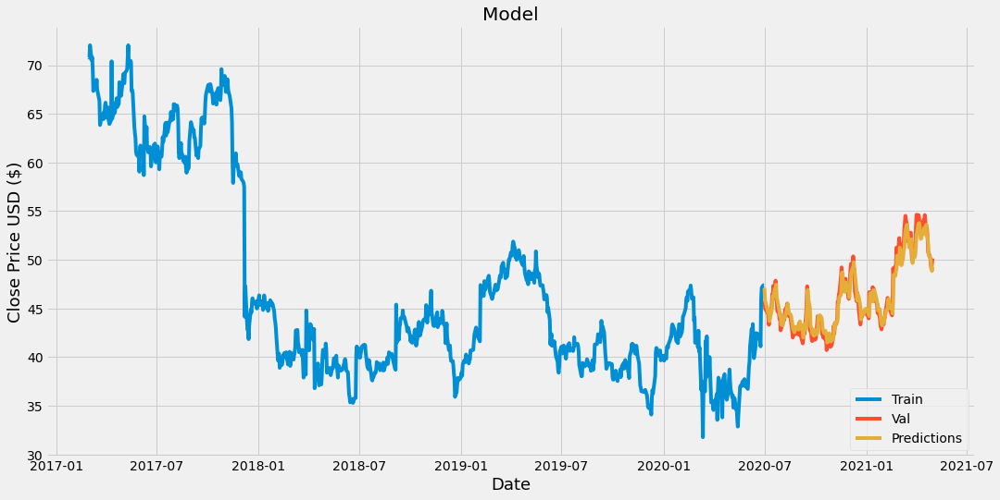

Accuracy: Close    0.001229
dtype: float64
Ticker Analyzed: AGYS
(1050, 6)
Epoch 1/10
780/780 [==============================] - 17s 19ms/step - loss: 0.0017 - mse: 0.0017 - mae: 0.0284 - mape: 27.4532
Epoch 2/10
780/780 [==============================] - 15s 19ms/step - loss: 4.8956e-04 - mse: 4.8956e-04 - mae: 0.0161 - mape: 15.2143
Epoch 3/10
780/780 [==============================] - 14s 18ms/step - loss: 3.5563e-04 - mse: 3.5563e-04 - mae: 0.0144 - mape: 14.2055
Epoch 4/10
780/780 [==============================] - 14s 18ms/step - loss: 3.1354e-04 - mse: 3.1354e-04 - mae: 0.0130 - mape: 13.3620
Epoch 5/10
780/780 [==============================] - 14s 18ms/step - loss: 6.9966e-04 - mse: 6.9966e-04 - mae: 0.0205 - mape: 14802.9684
Epoch 6/10
780/780 [==============================] - 15s 19ms/step - loss: 8.4764e-04 - mse: 8.4764e-04 - mae: 0.0215 - mape: 2640.6612
Epoch 7/10
780/780 [==============================] - 14s 18ms/step - loss: 7.1227e-04 - mse: 7.1227e-04 - mae: 0.0201

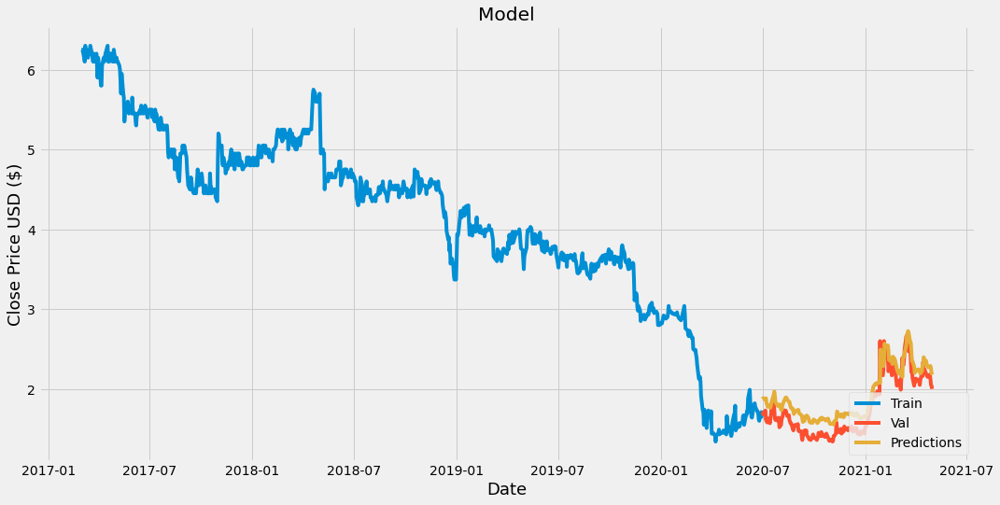

Accuracy: Close    0.031889
dtype: float64
Ticker Analyzed: AHCO
(735, 6)
Epoch 1/10
528/528 [==============================] - 12s 18ms/step - loss: 0.0029 - mse: 0.0029 - mae: 0.0343 - mape: 21500.1712
Epoch 2/10
780/780 [==============================] - 14s 18ms/step - loss: 0.0026 - mse: 0.0026 - mae: 0.0335 - mape: 82736.9273
Epoch 3/10
780/780 [==============================] - 15s 19ms/step - loss: 0.0020 - mse: 0.0020 - mae: 0.0277 - mape: 118103.7442
Epoch 4/10
780/780 [==============================] - 15s 20ms/step - loss: 0.0017 - mse: 0.0017 - mae: 0.0264 - mape: 9835.3286
Epoch 5/10
780/780 [==============================] - 14s 18ms/step - loss: 0.0014 - mse: 0.0014 - mae: 0.0249 - mape: 36141.5730
Epoch 6/10
780/780 [==============================] - 14s 18ms/step - loss: 0.0013 - mse: 0.0013 - mae: 0.0247 - mape: 29531.6437
Epoch 7/10
780/780 [==============================] - 15s 19ms/step - loss: 7.3882e-04 - mse: 7.3882e-04 - mae: 0.0187 - mape: 29163.6463
Epoch 8/

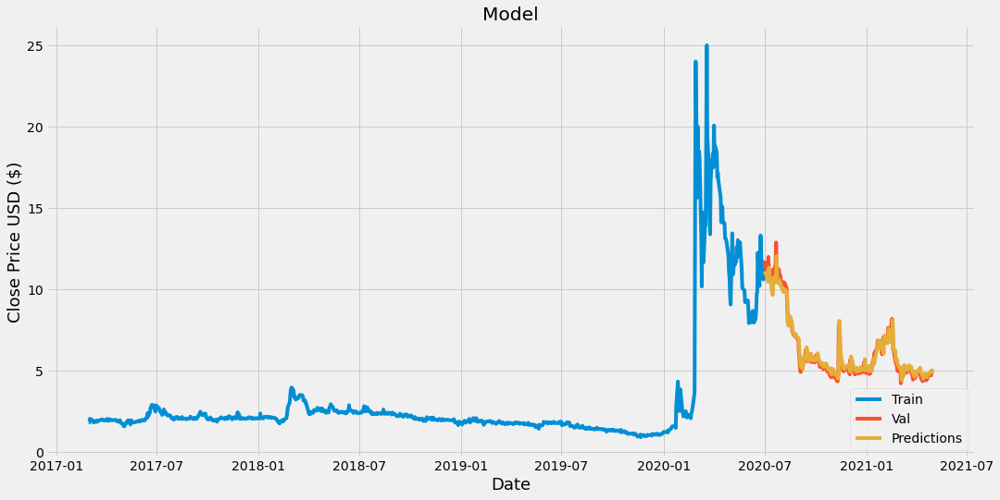

Accuracy: Close    0.002066
dtype: float64
Ticker Analyzed: AHT
(1050, 6)
Epoch 1/10
780/780 [==============================] - 17s 19ms/step - loss: 0.0166 - mse: 0.0166 - mae: 0.0698 - mape: 18.5733
Epoch 2/10
780/780 [==============================] - 15s 19ms/step - loss: 0.0017 - mse: 0.0017 - mae: 0.0310 - mape: 8.7722
Epoch 3/10
780/780 [==============================] - 16s 21ms/step - loss: 0.0018 - mse: 0.0018 - mae: 0.0327 - mape: 7.8722
Epoch 4/10
780/780 [==============================] - 16s 21ms/step - loss: 8.8953e-04 - mse: 8.8953e-04 - mae: 0.0228 - mape: 5.8491
Epoch 5/10
780/780 [==============================] - 15s 19ms/step - loss: 7.9585e-04 - mse: 7.9585e-04 - mae: 0.0213 - mape: 5.8699
Epoch 6/10
780/780 [==============================] - 14s 19ms/step - loss: 0.0017 - mse: 0.0017 - mae: 0.0243 - mape: 126821.5072
Epoch 4/10
780/780 [==============================] - 14s 18ms/step - loss: 0.0018 - mse: 0.0018 - mae: 0.0217 - mape: 871978.9449
Epoch 5/10
780/78

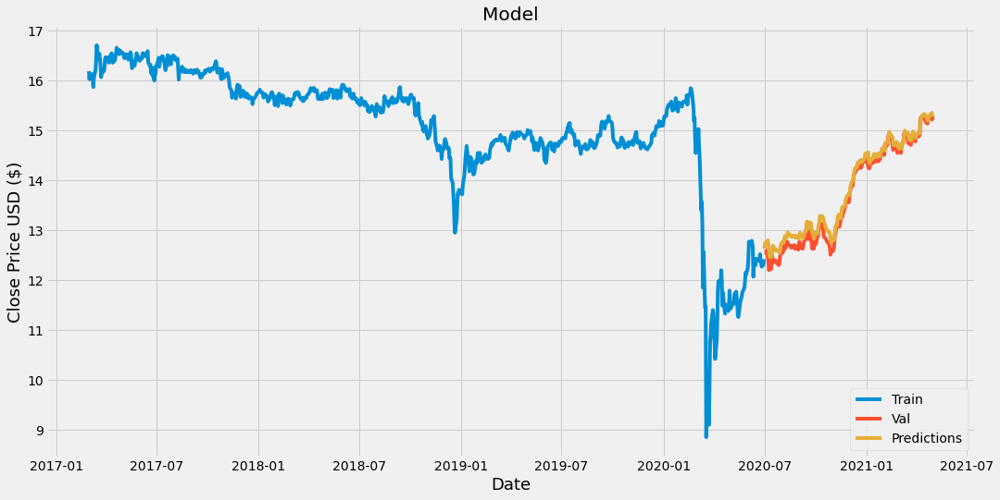

Accuracy: Close    0.015804
dtype: float64
Ticker Analyzed: AIG
(1050, 6)
Epoch 1/10
780/780 [==============================] - 18s 19ms/step - loss: 0.0128 - mse: 0.0128 - mae: 0.0740 - mape: 1100688.6323
Epoch 2/10
780/780 [==============================] - 17s 21ms/step - loss: 0.0019 - mse: 0.0019 - mae: 0.0308 - mape: 75592.1011
Epoch 3/10
780/780 [==============================] - 16s 20ms/step - loss: 0.0013 - mse: 0.0013 - mae: 0.0270 - mape: 38414.2755
Epoch 4/10
780/780 [==============================] - 15s 20ms/step - loss: 0.0014 - mse: 0.0014 - mae: 0.0287 - mape: 20597.2031
Epoch 5/10
569/569 [==============================] - 11s 20ms/step - loss: 0.0020 - mse: 0.0020 - mae: 0.0313 - mape: 25995.3841
Epoch 3/10
569/569 [==============================] - 11s 20ms/step - loss: 0.0019 - mse: 0.0019 - mae: 0.0283 - mape: 5015.7565
Epoch 4/10
569/569 [==============================] - 13s 23ms/step - loss: 0.0018 - mse: 0.0018 - mae: 0.0294 - mape: 4327.3472
Epoch 5/10
569/5

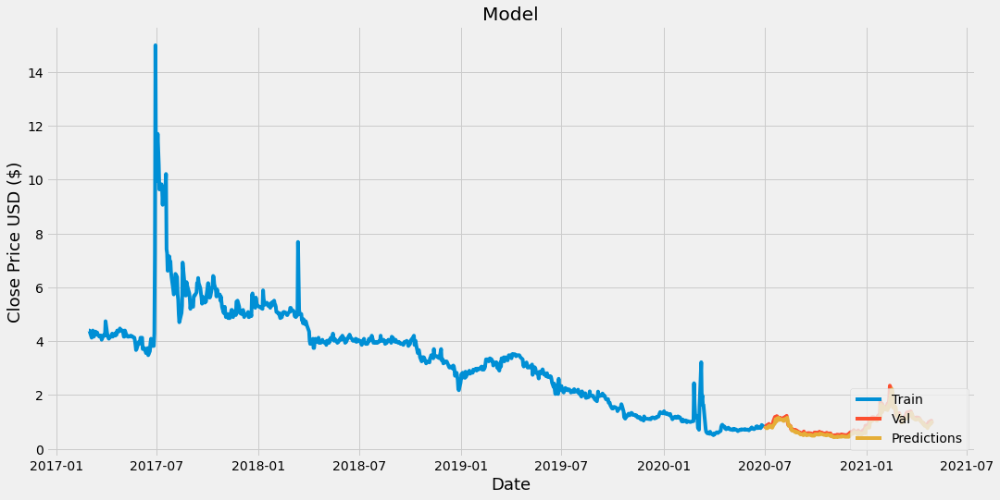

Accuracy: Close    0.003989
dtype: float64
Ticker Analyzed: AIM
(1050, 6)
Epoch 1/10
780/780 [==============================] - 18s 20ms/step - loss: 0.0038 - mse: 0.0038 - mae: 0.0392 - mape: 4843.6257
Epoch 2/10
780/780 [==============================] - 16s 21ms/step - loss: 0.0012 - mse: 0.0012 - mae: 0.0250 - mape: 8562.7208
Epoch 3/10
780/780 [==============================] - 15s 20ms/step - loss: 0.0010 - mse: 0.0010 - mae: 0.0231 - mape: 8524.3178
Epoch 4/10
780/780 [==============================] - 16s 21ms/step - loss: 8.3328e-04 - mse: 8.3328e-04 - mae: 0.0218 - mape: 187040.6997
Epoch 5/10
780/780 [==============================] - 16s 21ms/step - loss: 6.7467e-04 - mse: 6.7467e-04 - mae: 0.0200 - mape: 7195.2496
Epoch 6/10
780/780 [==============================] - 16s 21ms/step - loss: 8.1387e-04 - mse: 8.1387e-04 - mae: 0.0222 - mape: 152611.4407
Epoch 7/10
780/780 [==============================] - 15s 20ms/step - loss: 6.2452e-04 - mse: 6.2452e-04 - mae: 0.0187 - map

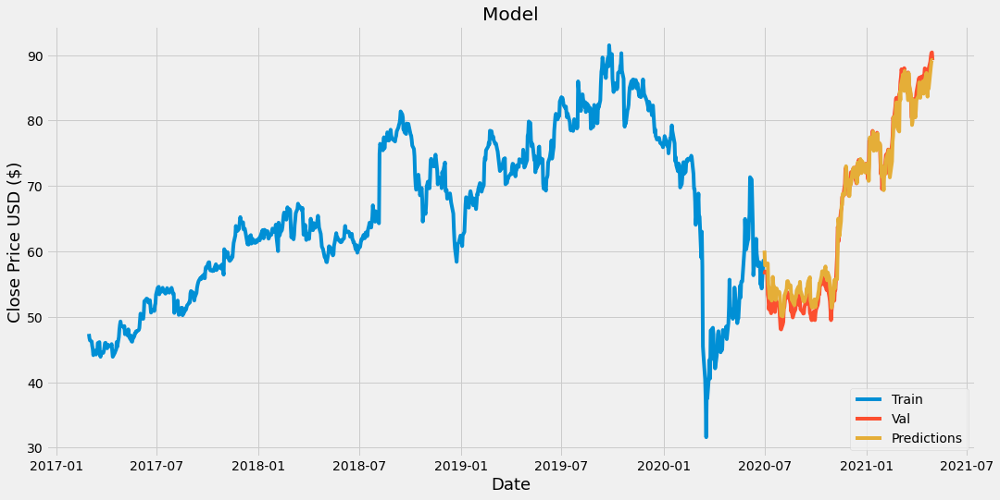

Accuracy: Close    0.007575
dtype: float64
Ticker Analyzed: AINC
(1050, 6)
Epoch 1/10
780/780 [==============================] - 19s 20ms/step - loss: 0.0182 - mse: 0.0182 - mae: 0.0733 - mape: 30.7443
Epoch 2/10
780/780 [==============================] - 17s 21ms/step - loss: 0.0018 - mse: 0.0018 - mae: 0.0314 - mape: 16.7218
Epoch 3/10
780/780 [==============================] - 43s 44ms/step - loss: 0.0178 - mse: 0.0178 - mae: 0.0779 - mape: 1106082.1679
Epoch 2/10
780/780 [==============================] - 43s 55ms/step - loss: 0.0015 - mse: 0.0015 - mae: 0.0283 - mape: 116463.6315
Epoch 3/10
780/780 [==============================] - 36s 47ms/step - loss: 0.0014 - mse: 0.0014 - mae: 0.0266 - mape: 131314.1939
Epoch 4/10
780/780 [==============================] - 77s 99ms/step - loss: 6.1243e-04 - mse: 6.1243e-04 - mae: 0.0183 - mape: 4637.9949


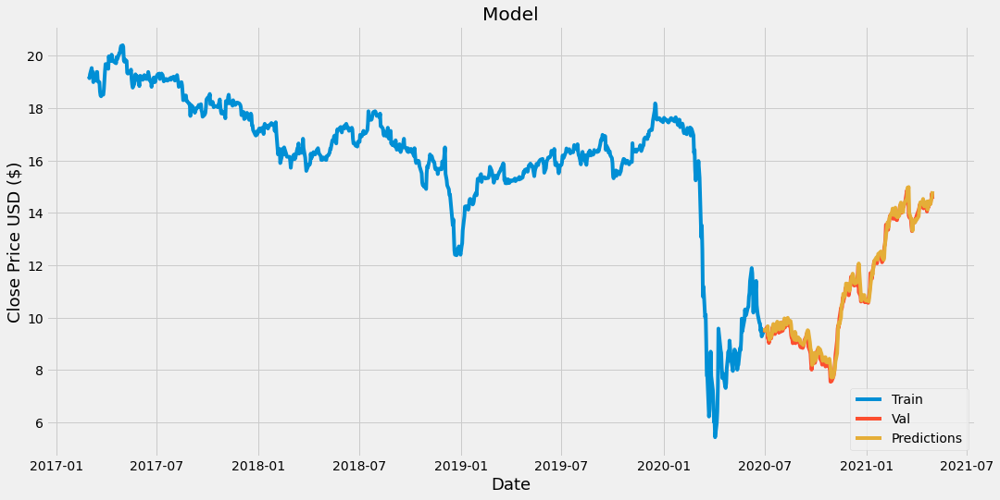

Accuracy: Close    0.00517
dtype: float64
Ticker Analyzed: AIO
(379, 6)
Epoch 1/10
244/244 [==============================] - 14s 25ms/step - loss: 0.0192 - mse: 0.0192 - mae: 0.0945 - mape: 285958.8644
Epoch 2/10
244/244 [==============================] - 6s 24ms/step - loss: 0.0040 - mse: 0.0040 - mae: 0.0492 - mape: 874589.8340
Epoch 3/10
244/244 [==============================] - 6s 26ms/step - loss: 0.0034 - mse: 0.0034 - mae: 0.0374 - mape: 882291.7632
Epoch 4/10
244/244 [==============================] - 6s 26ms/step - loss: 0.0027 - mse: 0.0027 - mae: 0.0371 - mape: 990385.3758
Epoch 5/10
244/244 [==============================] - 7s 30ms/step - loss: 0.0021 - mse: 0.0021 - mae: 0.0316 - mape: 697514.1253
Epoch 6/10
244/244 [==============================] - 5s 20ms/step - loss: 0.0016 - mse: 0.0016 - mae: 0.0301 - mape: 36907.8519
Epoch 7/10
244/244 [==============================] - 4s 18ms/step - loss: 0.0018 - mse: 0.0018 - mae: 0.0308 - mape: 1449530.7687
Epoch 8/10
244/24

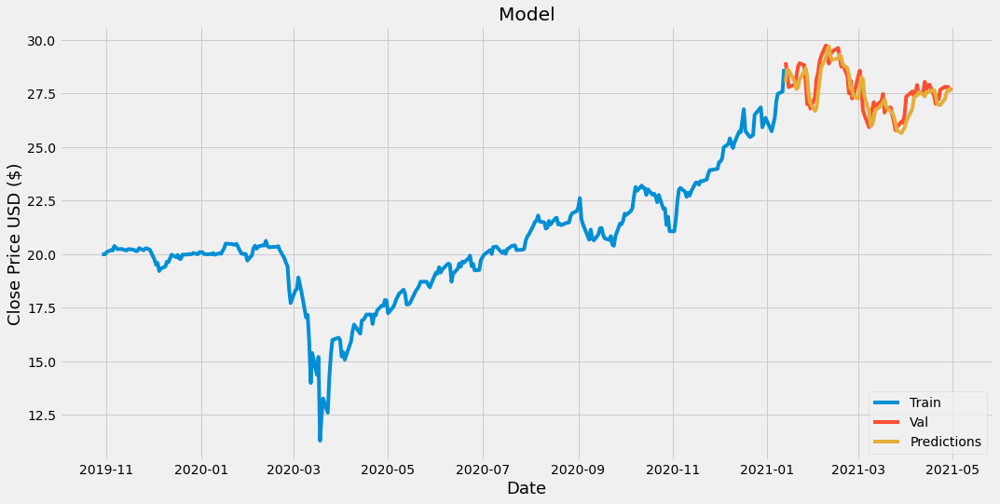

Accuracy: Close    0.00821
dtype: float64
Ticker Analyzed: AIR
(1050, 6)
Epoch 1/10
780/780 [==============================] - 16s 20ms/step - loss: 6.5600e-04 - mse: 6.5600e-04 - mae: 0.0191 - mape: 10676.3888
Epoch 4/10
780/780 [==============================] - 15s 19ms/step - loss: 7.3516e-04 - mse: 7.3516e-04 - mae: 0.0202 - mape: 22718.0226
Epoch 5/10
780/780 [==============================] - 15s 19ms/step - loss: 5.7149e-04 - mse: 5.7149e-04 - mae: 0.0171 - mape: 2118.7188
Epoch 6/10
780/780 [==============================] - 15s 19ms/step - loss: 8.2446e-04 - mse: 8.2446e-04 - mae: 0.0200 - mape: 24508.9440
Epoch 7/10
780/780 [==============================] - 16s 20ms/step - loss: 5.9551e-04 - mse: 5.9551e-04 - mae: 0.0174 - mape: 72378.9667
Epoch 8/10
780/780 [==============================] - 15s 19ms/step - loss: 7.3672e-04 - mse: 7.3672e-04 - mae: 0.0198 - mape: 479.9624
Epoch 9/10
780/780 [==============================] - 15s 19ms/step - loss: 0.0011 - mse: 0.0011 - mae

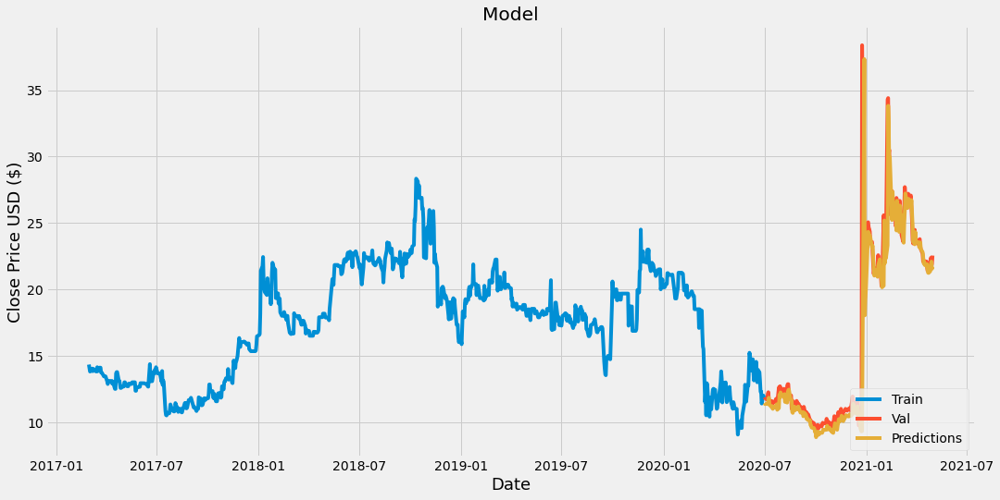

Accuracy: Close    0.014894
dtype: float64
Ticker Analyzed: AIRTP
(475, 6)
Epoch 1/10
320/320 [==============================] - 9s 19ms/step - loss: 0.0307 - mse: 0.0307 - mae: 0.1258 - mape: 891267.5935
Epoch 2/10
320/320 [==============================] - 6s 19ms/step - loss: 0.0085 - mse: 0.0085 - mae: 0.0698 - mape: 1851379.8257
Epoch 3/10
320/320 [==============================] - 6s 19ms/step - loss: 0.0045 - mse: 0.0045 - mae: 0.0480 - mape: 903897.9347
Epoch 4/10
320/320 [==============================] - 6s 19ms/step - loss: 0.0069 - mse: 0.0069 - mae: 0.0603 - mape: 832028.0620
Epoch 5/10
320/320 [==============================] - 6s 20ms/step - loss: 0.0041 - mse: 0.0041 - mae: 0.0454 - mape: 929878.8071
Epoch 6/10
320/320 [==============================] - 6s 19ms/step - loss: 0.0051 - mse: 0.0051 - mae: 0.0500 - mape: 922924.0900
Epoch 7/10
320/320 [==============================] - 6s 19ms/step - loss: 0.0040 - mse: 0.0040 - mae: 0.0446 - mape: 658049.1779
Epoch 8/10
780

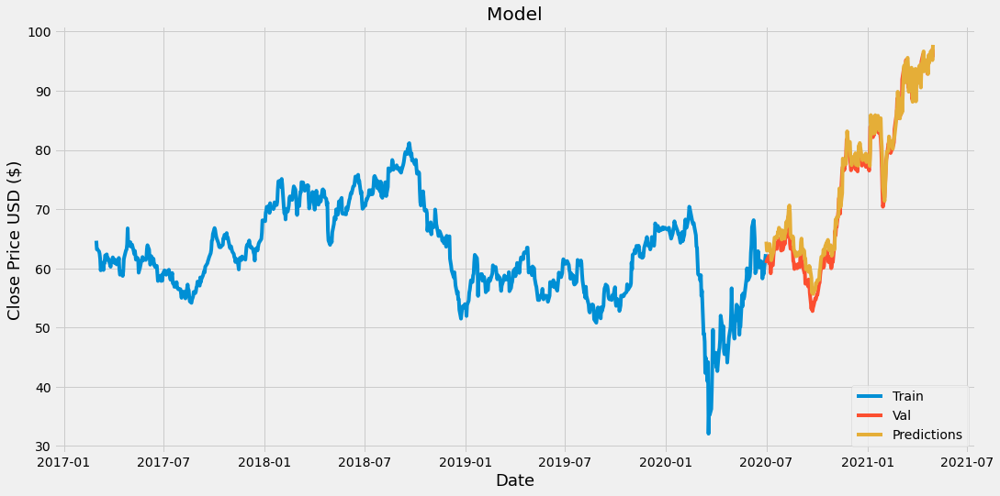

Accuracy: Close    0.018059
dtype: float64
Ticker Analyzed: AIV
(1050, 6)
Epoch 1/10
780/780 [==============================] - 17s 19ms/step - loss: 0.0329 - mse: 0.0329 - mae: 0.0893 - mape: 47605.1580
Epoch 2/10
780/780 [==============================] - 15s 19ms/step - loss: 0.0025 - mse: 0.0025 - mae: 0.0338 - mape: 288570.3681
Epoch 3/10
780/780 [==============================] - 15s 19ms/step - loss: 0.0017 - mse: 0.0017 - mae: 0.0299 - mape: 173547.7218
Epoch 4/10
780/780 [==============================] - 15s 19ms/step - loss: 0.0014 - mse: 0.0014 - mae: 0.0253 - mape: 149392.5850
Epoch 5/10
780/780 [==============================] - 15s 20ms/step - loss: 6.5201e-04 - mse: 6.5201e-04 - mae: 0.0144 - mape: 88393.0137
Epoch 6/10
780/780 [==============================] - 15s 19ms/step - loss: 0.0018 - mse: 0.0018 - mae: 0.0227 - mape: 683492.4773
Epoch 7/10
780/780 [==============================] - 15s 19ms/step - loss: 8.7290e-04 - mse: 8.7290e-04 - mae: 0.0160 - mape: 435282.

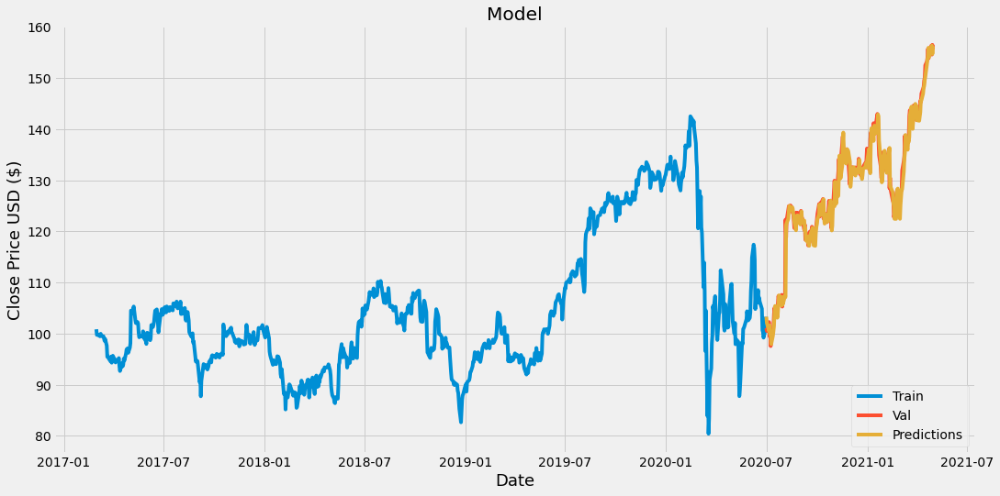

Accuracy: Close    0.005044
dtype: float64
Ticker Analyzed: AIZN
(107, 6)
Epoch 1/10
26/26 [==============================] - 3s 22ms/step - loss: 0.0294 - mse: 0.0294 - mae: 0.1340 - mape: 13762416.2790
Epoch 2/10
26/26 [==============================] - 1s 27ms/step - loss: 0.0145 - mse: 0.0145 - mae: 0.0829 - mape: 11180250.8501
Epoch 3/10
26/26 [==============================] - 1s 22ms/step - loss: 0.0086 - mse: 0.0086 - mae: 0.0788 - mape: 6241361.0533
Epoch 4/10
26/26 [==============================] - 1s 22ms/step - loss: 0.0073 - mse: 0.0073 - mae: 0.0750 - mape: 4173083.8032
Epoch 5/10
26/26 [==============================] - 1s 21ms/step - loss: 0.0049 - mse: 0.0049 - mae: 0.0576 - mape: 1026086.0159
Epoch 6/10
26/26 [==============================] - 1s 21ms/step - loss: 0.0054 - mse: 0.0054 - mae: 0.0574 - mape: 8658743.9022
Epoch 7/10
26/26 [==============================] - 1s 19ms/step - loss: 0.0051 - mse: 0.0051 - mae: 0.0587 - mape: 9500805.0611
Epoch 8/10
26/26 [===

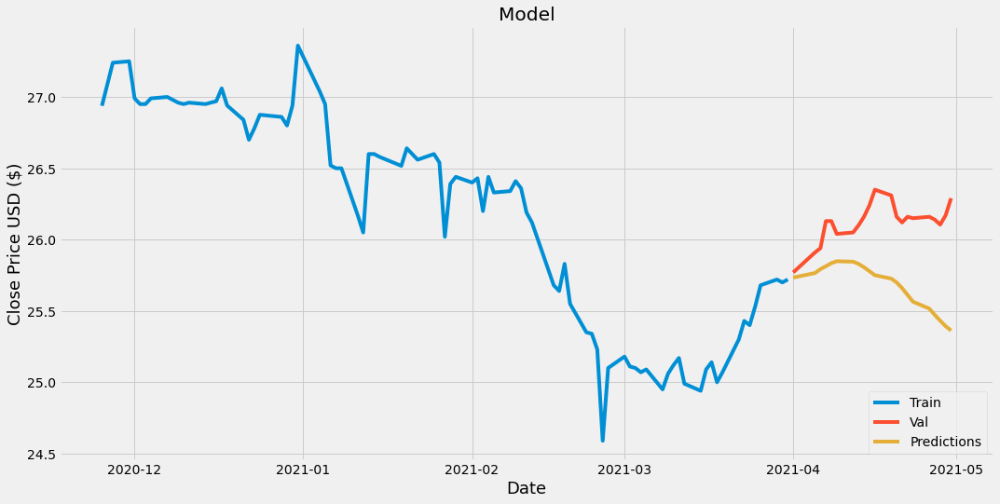

Accuracy: Close    0.160688
dtype: float64
Ticker Analyzed: AJAX
(91, 6)
Epoch 1/10
13/13 [==============================] - 2s 22ms/step - loss: 0.0059 - mse: 0.0059 - mae: 0.0660 - mape: 101.9682
Epoch 2/10
13/13 [==============================] - 0s 18ms/step - loss: 0.0025 - mse: 0.0025 - mae: 0.0367 - mape: 79.6311
Epoch 3/10
13/13 [==============================] - 0s 19ms/step - loss: 0.0037 - mse: 0.0037 - mae: 0.0492 - mape: 91.1143
Epoch 4/10
13/13 [==============================] - 0s 18ms/step - loss: 0.0016 - mse: 0.0016 - mae: 0.0315 - mape: 65.6788
Epoch 5/10
13/13 [==============================] - 0s 19ms/step - loss: 0.0022 - mse: 0.0022 - mae: 0.0340 - mape: 50.9920
Epoch 6/10
13/13 [==============================] - 0s 19ms/step - loss: 0.0013 - mse: 0.0013 - mae: 0.0258 - mape: 32.8863  
Epoch 7/10
13/13 [==============================] - 0s 19ms/step - loss: 0.0015 - mse: 0.0015 - mae: 0.0304 - mape: 64.4661
Epoch 8/10
13/13 [==============================] - 0s 1

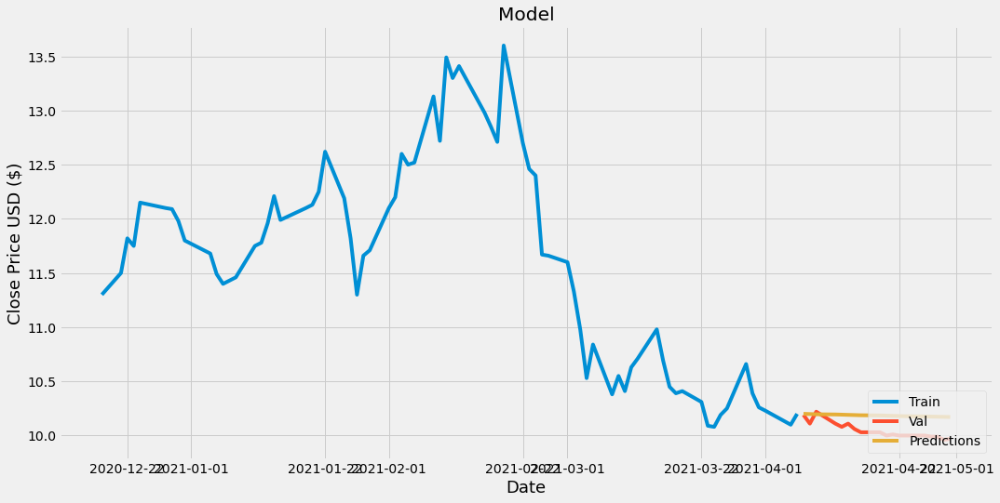

Accuracy: Close    0.037634
dtype: float64
Ticker Analyzed: AJG
(1050, 6)
Epoch 1/10
780/780 [==============================] - 17s 19ms/step - loss: 0.0049 - mse: 0.0049 - mae: 0.0439 - mape: 26.5453
Epoch 2/10
780/780 [==============================] - 15s 19ms/step - loss: 5.7589e-04 - mse: 5.7589e-04 - mae: 0.0178 - mape: 10.9976
Epoch 3/10
780/780 [==============================] - 15s 19ms/step - loss: 7.1549e-04 - mse: 7.1549e-04 - mae: 0.0189 - mape: 11.6633
Epoch 4/10
780/780 [==============================] - 15s 19ms/step - loss: 0.0012 - mse: 0.0012 - mae: 0.0240 - mape: 7.0870
Epoch 7/10
780/780 [==============================] - 15s 19ms/step - loss: 0.0012 - mse: 0.0012 - mae: 0.0241 - mape: 8.3812
Epoch 8/10
780/780 [==============================] - 14s 18ms/step - loss: 0.0011 - mse: 0.0011 - mae: 0.0246 - mape: 7.2595
Epoch 9/10
780/780 [==============================] - 14s 18ms/step - loss: 0.0011 - mse: 0.0011 - mae: 0.0239 - mape: 8.8962
Epoch 10/10
780/780 [====

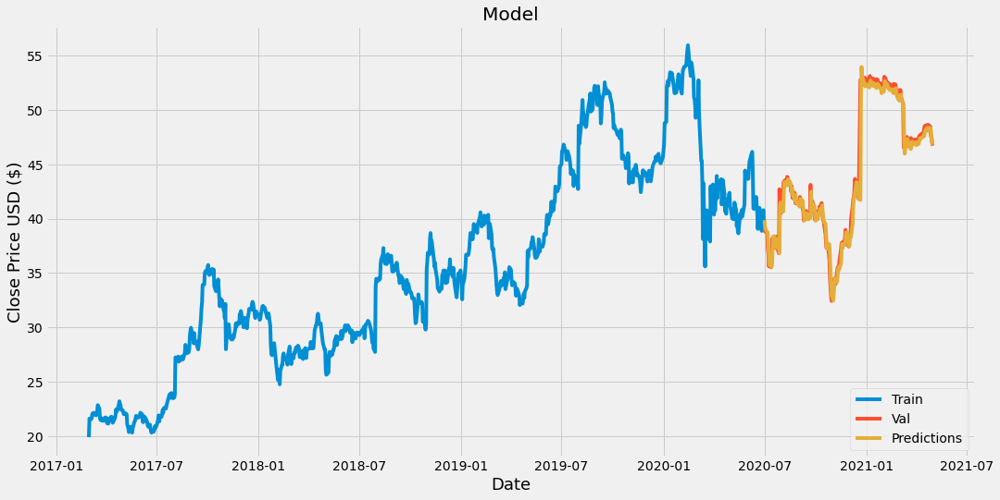

Accuracy: Close    0.006357
dtype: float64
Ticker Analyzed: AJX
(1050, 6)
Epoch 1/10
780/780 [==============================] - 14s 18ms/step - loss: 0.0016 - mse: 0.0016 - mae: 0.0223 - mape: 1839158.1171


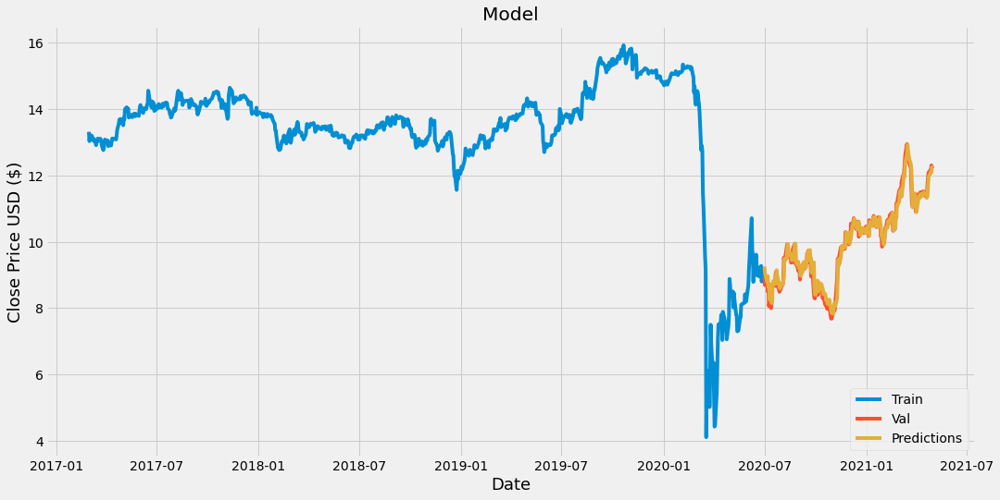

Accuracy: Close    0.001245
dtype: float64
Ticker Analyzed: AJXA
(1009, 6)
Epoch 1/10
748/748 [==============================] - 16s 19ms/step - loss: 0.0223 - mse: 0.0223 - mae: 0.0752 - mape: 143752.4021
Epoch 2/10
748/748 [==============================] - 15s 20ms/step - loss: 0.0027 - mse: 0.0027 - mae: 0.0338 - mape: 528170.4544
Epoch 3/10
748/748 [==============================] - 14s 18ms/step - loss: 0.0016 - mse: 0.0016 - mae: 0.0260 - mape: 234299.3373
Epoch 4/10
748/748 [==============================] - 14s 18ms/step - loss: 0.0018 - mse: 0.0018 - mae: 0.0259 - mape: 222265.0259
Epoch 5/10
780/780 [==============================] - 15s 19ms/step - loss: 8.1388e-04 - mse: 8.1388e-04 - mae: 0.0213 - mape: 46959.7648
Epoch 7/10
780/780 [==============================] - 14s 18ms/step - loss: 6.6300e-04 - mse: 6.6300e-04 - mae: 0.0187 - mape: 52603.4729
Epoch 8/10
780/780 [==============================] - 15s 19ms/step - loss: 6.4107e-04 - mse: 6.4107e-04 - mae: 0.0184 - mape

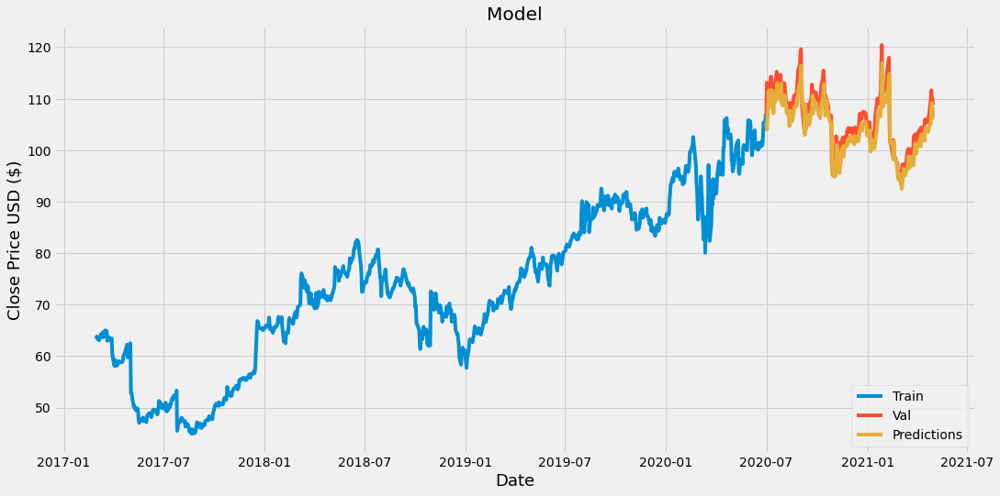

Accuracy: Close    0.023752
dtype: float64
Ticker Analyzed: AKBA
(1050, 6)
Epoch 1/10
780/780 [==============================] - 16s 18ms/step - loss: 0.0176 - mse: 0.0176 - mae: 0.0771 - mape: 16.4916
Epoch 2/10
780/780 [==============================] - 14s 18ms/step - loss: 0.0023 - mse: 0.0023 - mae: 0.0367 - mape: 8.5284
Epoch 3/10
780/780 [==============================] - 14s 18ms/step - loss: 0.0016 - mse: 0.0016 - mae: 0.0300 - mape: 7.1699
Epoch 4/10
780/780 [==============================] - 15s 19ms/step - loss: 0.0014 - mse: 0.0014 - mae: 0.0294 - mape: 7.6848
Epoch 5/10
780/780 [==============================] - 14s 18ms/step - loss: 0.0011 - mse: 0.0011 - mae: 0.0255 - mape: 6.5862
Epoch 6/10
780/780 [==============================] - 15s 19ms/step - loss: 9.6826e-04 - mse: 9.6826e-04 - mae: 0.0237 - mape: 8398.1905
Epoch 3/10
780/780 [==============================] - 14s 18ms/step - loss: 6.4538e-04 - mse: 6.4538e-04 - mae: 0.0197 - mape: 3980.7675
Epoch 4/10
780/780 [

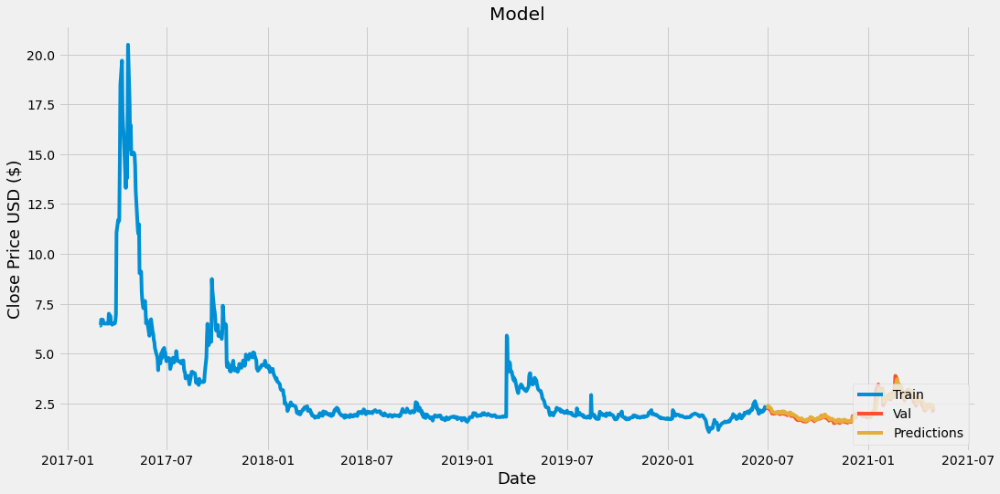

Accuracy: Close    0.001714
dtype: float64
Ticker Analyzed: AKU
(165, 6)
Epoch 1/10
72/72 [==============================] - 3s 18ms/step - loss: 0.0553 - mse: 0.0553 - mae: 0.1822 - mape: 68.2715
Epoch 2/10
72/72 [==============================] - 1s 18ms/step - loss: 0.0157 - mse: 0.0157 - mae: 0.0889 - mape: 32.8195
Epoch 3/10
72/72 [==============================] - 1s 18ms/step - loss: 0.0116 - mse: 0.0116 - mae: 0.0800 - mape: 37.4630
Epoch 4/10
72/72 [==============================] - 1s 20ms/step - loss: 0.0127 - mse: 0.0127 - mae: 0.0794 - mape: 23.7061
Epoch 5/10
72/72 [==============================] - 1s 19ms/step - loss: 0.0148 - mse: 0.0148 - mae: 0.0772 - mape: 24.0525
Epoch 6/10
72/72 [==============================] - 1s 18ms/step - loss: 0.0090 - mse: 0.0090 - mae: 0.0727 - mape: 26.0518
Epoch 7/10
72/72 [==============================] - 1s 18ms/step - loss: 0.0096 - mse: 0.0096 - mae: 0.0754 - mape: 24.8777
Epoch 8/10
72/72 [==============================] - 1s 18ms

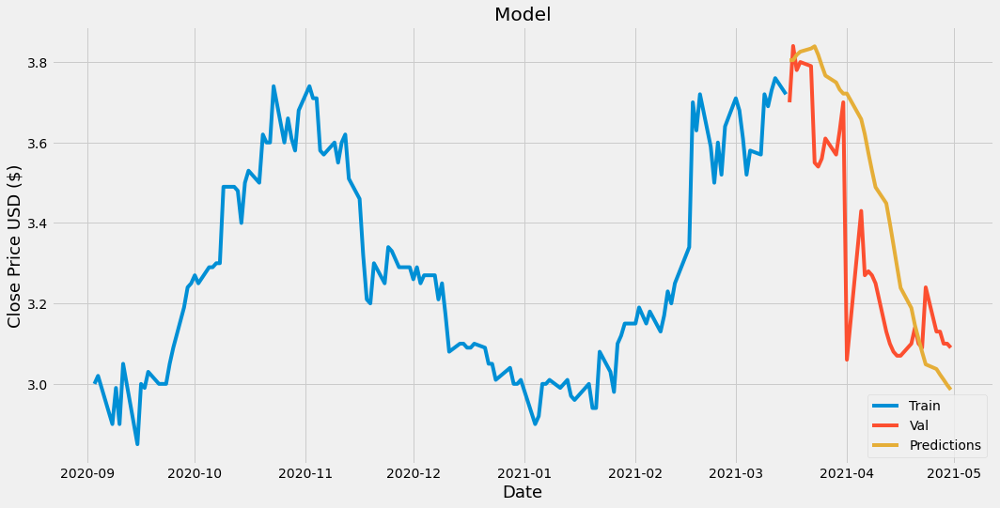

Accuracy: Close    0.127003
dtype: float64
Ticker Analyzed: AKUS
(213, 6)
Epoch 1/10
111/111 [==============================] - 4s 20ms/step - loss: 0.0429 - mse: 0.0429 - mae: 0.1642 - mape: 40.8653
Epoch 2/10
111/111 [==============================] - 2s 20ms/step - loss: 0.0097 - mse: 0.0097 - mae: 0.0721 - mape: 18.3216
Epoch 3/10
111/111 [==============================] - 2s 18ms/step - loss: 0.0112 - mse: 0.0112 - mae: 0.0805 - mape: 20.6843
Epoch 4/10
111/111 [==============================] - 2s 19ms/step - loss: 0.0099 - mse: 0.0099 - mae: 0.0739 - mape: 18.9990
Epoch 5/10
111/111 [==============================] - 2s 18ms/step - loss: 0.0080 - mse: 0.0080 - mae: 0.0737 - mape: 19.2117
Epoch 6/10
111/111 [==============================] - 2s 18ms/step - loss: 0.0144 - mse: 0.0144 - mae: 0.0916 - mape: 23.5443
Epoch 7/10
111/111 [==============================] - 2s 19ms/step - loss: 0.0093 - mse: 0.0093 - mae: 0.0772 - mape: 19.9684
Epoch 8/10
111/111 [========================

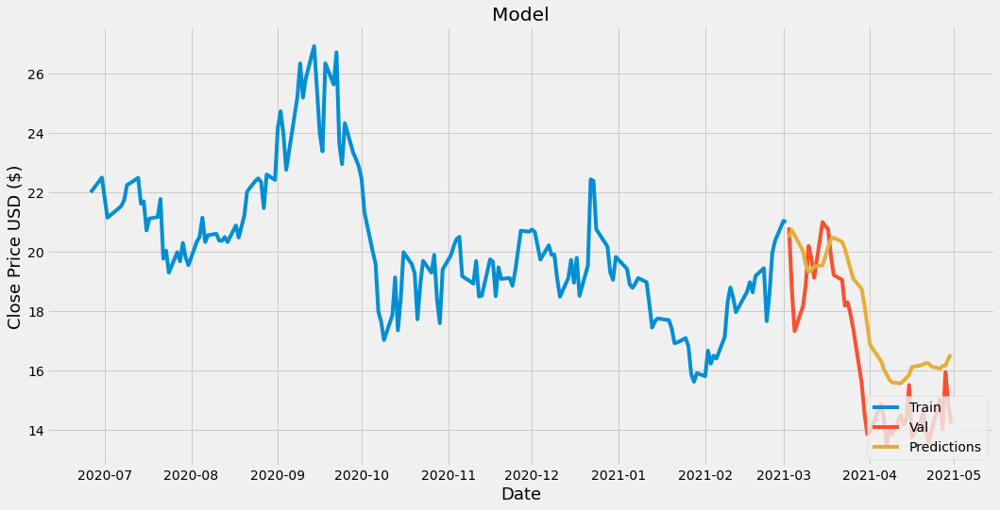

Accuracy: Close    0.105891
dtype: float64
Ticker Analyzed: AL
(1050, 6)
Epoch 1/10
780/780 [==============================] - 15s 19ms/step - loss: 9.1794e-04 - mse: 9.1794e-04 - mae: 0.0217 - mape: 198949.6979
Epoch 10/10
780/780 [==============================] - 14s 18ms/step - loss: 8.0811e-04 - mse: 8.0811e-04 - mae: 0.0209 - mape: 444458.3269


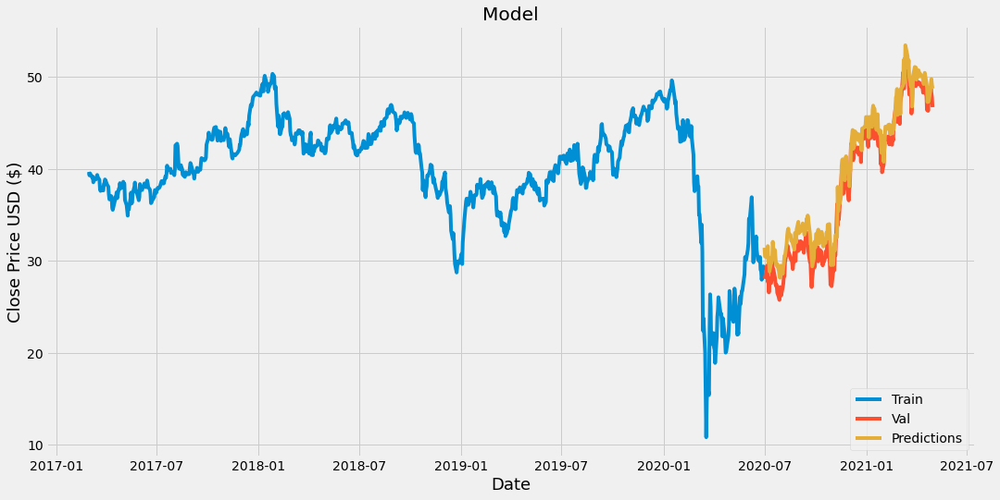

Accuracy: Close    0.036921
dtype: float64
Error on AL^A!
Ticker Analyzed: ALAC
(613, 6)
Epoch 1/10
431/431 [==============================] - 10s 19ms/step - loss: 5.3874e-04 - mse: 5.3874e-04 - mae: 0.0153 - mape: 15.2973
Epoch 2/10
431/431 [==============================] - 8s 18ms/step - loss: 1.9563e-04 - mse: 1.9563e-04 - mae: 0.0101 - mape: 10.2584
Epoch 3/10
431/431 [==============================] - 8s 18ms/step - loss: 1.6185e-04 - mse: 1.6185e-04 - mae: 0.0090 - mape: 8.9740
Epoch 4/10
431/431 [==============================] - 8s 18ms/step - loss: 8.6961e-05 - mse: 8.6961e-05 - mae: 0.0072 - mape: 7.5079
Epoch 5/10
431/431 [==============================] - 8s 18ms/step - loss: 1.7159e-04 - mse: 1.7159e-04 - mae: 0.0090 - mape: 8.8509
Epoch 6/10
431/431 [==============================] - 8s 18ms/step - loss: 6.7611e-05 - mse: 6.7611e-05 - mae: 0.0062 - mape: 6.4064
Epoch 7/10
431/431 [==============================] - 8s 18ms/step - loss: 9.1642e-05 - mse: 9.1642e-05 - mae:

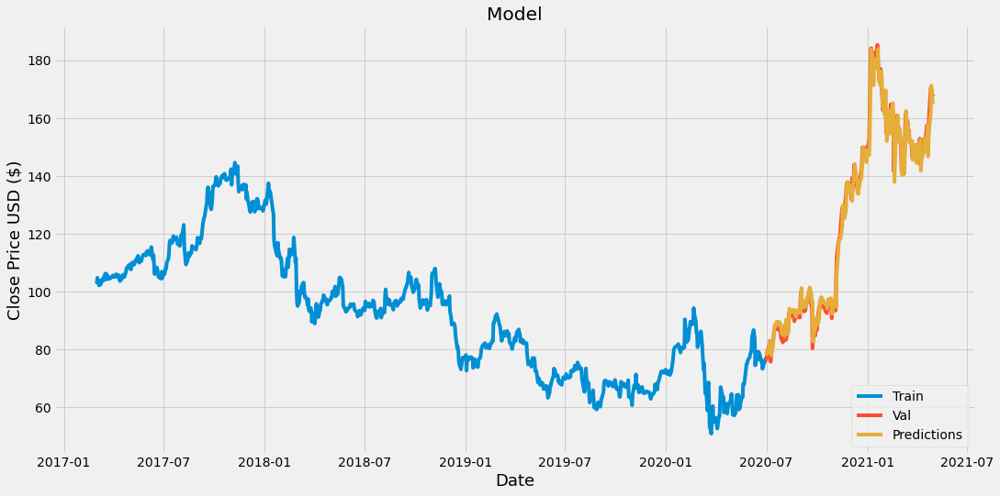

Accuracy: Close    0.00092
dtype: float64
Ticker Analyzed: ALBO
(1050, 6)
Epoch 1/10
780/780 [==============================] - 17s 19ms/step - loss: 0.0107 - mse: 0.0107 - mae: 0.0733 - mape: 67010.4423
Epoch 2/10
356/356 [==============================] - 7s 21ms/step - loss: 0.0017 - mse: 0.0017 - mae: 0.0312 - mape: 654194.4644
Epoch 7/10
356/356 [==============================] - 6s 18ms/step - loss: 0.0017 - mse: 0.0017 - mae: 0.0303 - mape: 632711.5858
Epoch 8/10
356/356 [==============================] - 7s 18ms/step - loss: 0.0017 - mse: 0.0017 - mae: 0.0303 - mape: 814803.5780
Epoch 9/10
356/356 [==============================] - 7s 19ms/step - loss: 0.0015 - mse: 0.0015 - mae: 0.0300 - mape: 432932.0134
Epoch 10/10
356/356 [==============================] - 7s 19ms/step - loss: 0.0015 - mse: 0.0015 - mae: 0.0285 - mape: 245298.1607


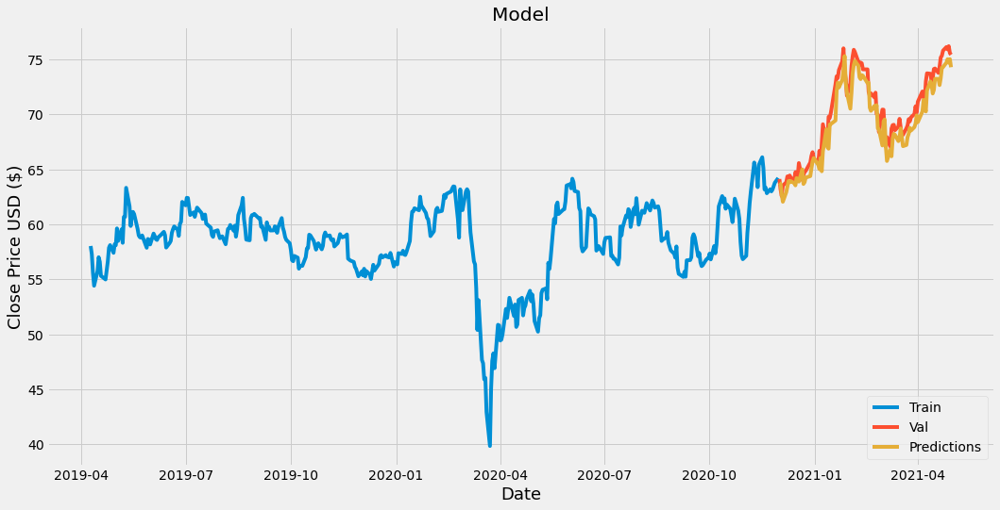

Accuracy: Close    0.02652
dtype: float64
Ticker Analyzed: ALCO
(1050, 6)
Epoch 1/10
780/780 [==============================] - 17s 19ms/step - loss: 0.0123 - mse: 0.0123 - mae: 0.0799 - mape: 324179.9139
Epoch 2/10
780/780 [==============================] - 15s 20ms/step - loss: 0.0039 - mse: 0.0039 - mae: 0.0478 - mape: 257607.5469
Epoch 3/10
780/780 [==============================] - 14s 18ms/step - loss: 0.0028 - mse: 0.0028 - mae: 0.0407 - mape: 233767.3283
Epoch 4/10
780/780 [==============================] - 17s 22ms/step - loss: 0.0025 - mse: 0.0025 - mae: 0.0357 - mape: 236357.2043


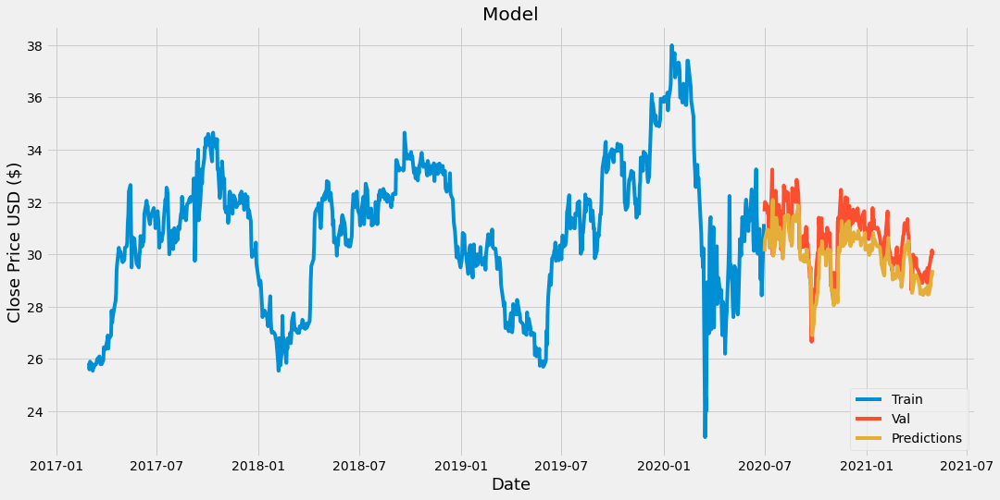

Accuracy: Close    0.044676
dtype: float64
Ticker Analyzed: ALDX
(1050, 6)
Epoch 1/10
780/780 [==============================] - 22s 25ms/step - loss: 0.0089 - mse: 0.0089 - mae: 0.0624 - mape: 107808.9737
Epoch 2/10
780/780 [==============================] - 16s 20ms/step - loss: 0.0023 - mse: 0.0023 - mae: 0.0315 - mape: 130741.8569
Epoch 3/10
780/780 [==============================] - 15s 20ms/step - loss: 0.0013 - mse: 0.0013 - mae: 0.0251 - mape: 1499.0862
Epoch 4/10
780/780 [==============================] - 15s 19ms/step - loss: 0.0015 - mse: 0.0015 - mae: 0.0257 - mape: 2182.9785
Epoch 5/10
780/780 [==============================] - 17s 22ms/step - loss: 0.0016 - mse: 0.0016 - mae: 0.0302 - mape: 74584.4811
Epoch 7/10
780/780 [==============================] - 24s 31ms/step - loss: 0.0011 - mse: 0.0011 - mae: 0.0250 - mape: 80914.9656
Epoch 8/10
780/780 [==============================] - 23s 29ms/step - loss: 0.0014 - mse: 0.0014 - mae: 0.0271 - mape: 14334.2128
Epoch 9/10
780/

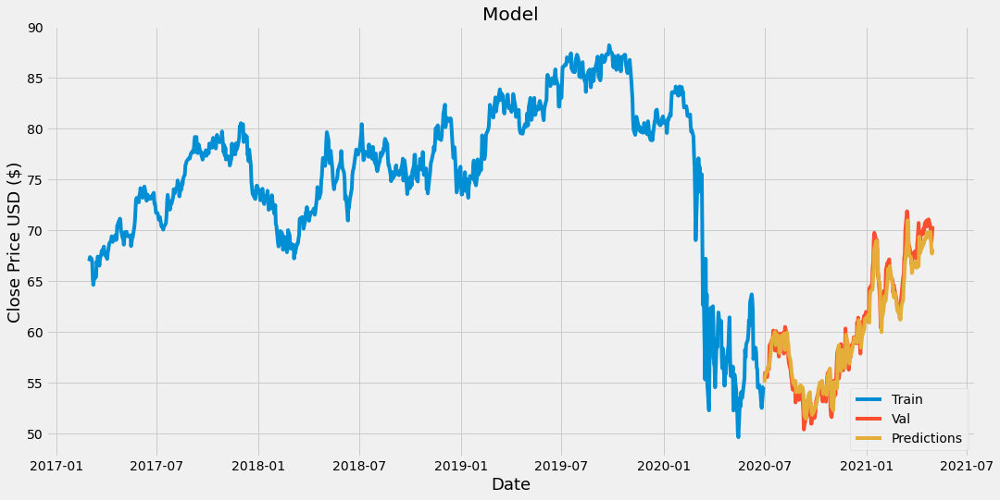

Accuracy: Close    0.004603
dtype: float64
Ticker Analyzed: ALEC
(562, 6)
Epoch 1/10
780/780 [==============================] - 16s 20ms/step - loss: 0.0015 - mse: 0.0015 - mae: 0.0205 - mape: 289660.0404
Epoch 8/10
780/780 [==============================] - 15s 19ms/step - loss: 4.3776e-04 - mse: 4.3776e-04 - mae: 0.0140 - mape: 453.6153
Epoch 9/10
780/780 [==============================] - 15s 19ms/step - loss: 4.6093e-04 - mse: 4.6093e-04 - mae: 0.0152 - mape: 2749.3128
Epoch 10/10
780/780 [==============================] - 17s 21ms/step - loss: 0.0011 - mse: 0.0011 - mae: 0.0246 - mape: 10.6801
Epoch 3/10
780/780 [==============================] - 15s 19ms/step - loss: 8.1826e-04 - mse: 8.1826e-04 - mae: 0.0216 - mape: 9.0550
Epoch 4/10
780/780 [==============================] - 16s 21ms/step - loss: 6.0696e-04 - mse: 6.0696e-04 - mae: 0.0178 - mape: 7.3705
Epoch 5/10
780/780 [==============================] - 17s 21ms/step - loss: 4.2128e-04 - mse: 4.2128e-04 - mae: 0.0153 - mape:

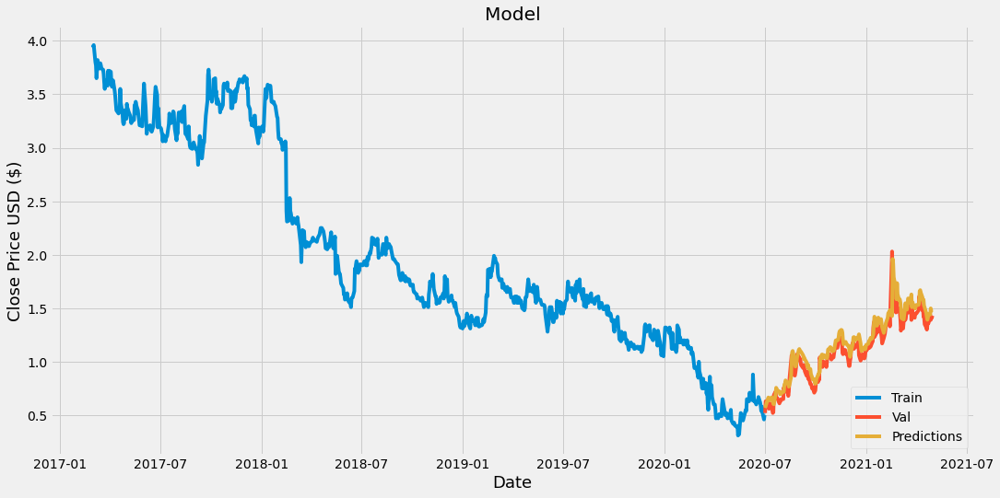

Accuracy: Close    0.018534
dtype: float64
Ticker Analyzed: ALK
(1050, 6)
Epoch 1/10
780/780 [==============================] - 19s 22ms/step - loss: 0.0119 - mse: 0.0119 - mae: 0.0653 - mape: 193306.4351
Epoch 2/10
780/780 [==============================] - 15s 19ms/step - loss: 9.6657e-04 - mse: 9.6657e-04 - mae: 0.0227 - mape: 16344.8014
Epoch 6/10
780/780 [==============================] - 14s 18ms/step - loss: 0.0011 - mse: 0.0011 - mae: 0.0222 - mape: 40318.9483
Epoch 7/10
780/780 [==============================] - 15s 19ms/step - loss: 6.8311e-04 - mse: 6.8311e-04 - mae: 0.0189 - mape: 45168.9357
Epoch 8/10
780/780 [==============================] - 16s 21ms/step - loss: 8.6339e-04 - mse: 8.6339e-04 - mae: 0.0205 - mape: 99921.0791
Epoch 9/10
780/780 [==============================] - 14s 18ms/step - loss: 8.0360e-04 - mse: 8.0360e-04 - mae: 0.0206 - mape: 9522.0939
Epoch 10/10
780/780 [==============================] - 17s 18ms/step - loss: 0.0109 - mse: 0.0109 - mae: 0.0686 - 

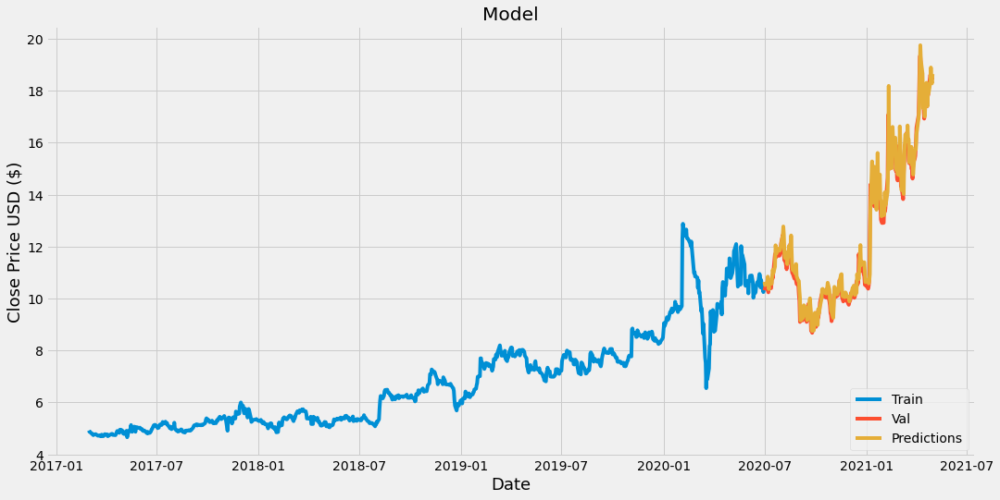

Accuracy: Close    0.010247
dtype: float64
Ticker Analyzed: ALLY
(1050, 6)
Epoch 1/10
780/780 [==============================] - 267s 339ms/step - loss: 0.0045 - mse: 0.0045 - mae: 0.0457 - mape: 87203.1749
Epoch 2/10
780/780 [==============================] - 22s 28ms/step - loss: 8.2230e-04 - mse: 8.2230e-04 - mae: 0.0208 - mape: 102670.3583
Epoch 3/10
780/780 [==============================] - 2030s 3s/step - loss: 5.2549e-04 - mse: 5.2549e-04 - mae: 0.0168 - mape: 64817.2515
Epoch 4/10
643/643 [==============================] - 953s 1s/step - loss: 0.0021 - mse: 0.0021 - mae: 0.0296 - mape: 17298.2615
Epoch 6/10
643/643 [==============================] - 16s 25ms/step - loss: 0.0015 - mse: 0.0015 - mae: 0.0244 - mape: 100897.7877
Epoch 7/10
643/643 [==============================] - 14s 22ms/step - loss: 0.0019 - mse: 0.0019 - mae: 0.0274 - mape: 28416.2066
Epoch 8/10
643/643 [==============================] - 18596s 29s/step - loss: 0.0011 - mse: 0.0011 - mae: 0.0215 - mape: 26971

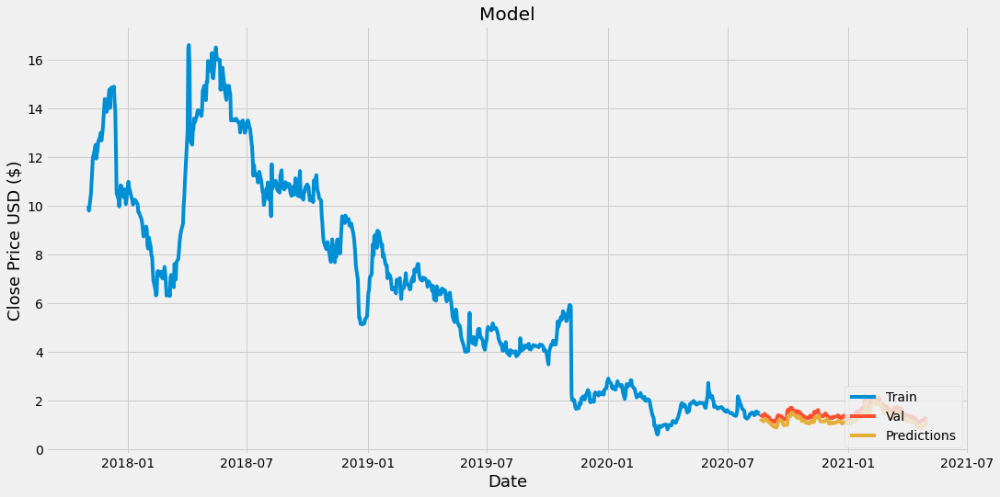

Accuracy: Close    0.013195
dtype: float64
Ticker Analyzed: ALNY
(1050, 6)
Epoch 1/10
780/780 [==============================] - 18s 19ms/step - loss: 0.0101 - mse: 0.0101 - mae: 0.0694 - mape: 19.0458
Epoch 2/10
780/780 [==============================] - 21s 27ms/step - loss: 0.0025 - mse: 0.0025 - mae: 0.0368 - mape: 10.9031
Epoch 3/10
780/780 [==============================] - 19s 24ms/step - loss: 0.0026 - mse: 0.0026 - mae: 0.0361 - mape: 3860.0169
Epoch 3/10
780/780 [==============================] - 16s 20ms/step - loss: 0.0021 - mse: 0.0021 - mae: 0.0348 - mape: 4953.4426
Epoch 4/10
780/780 [==============================] - 16s 20ms/step - loss: 0.0012 - mse: 0.0012 - mae: 0.0248 - mape: 5517.2564
Epoch 5/10
780/780 [==============================] - 19s 25ms/step - loss: 7.0014e-04 - mse: 7.0014e-04 - mae: 0.0194 - mape: 35067.8662
Epoch 6/10
780/780 [==============================] - 15s 19ms/step - loss: 0.0011 - mse: 0.0011 - mae: 0.0214 - mape: 71354.2184
Epoch 7/10
780/7

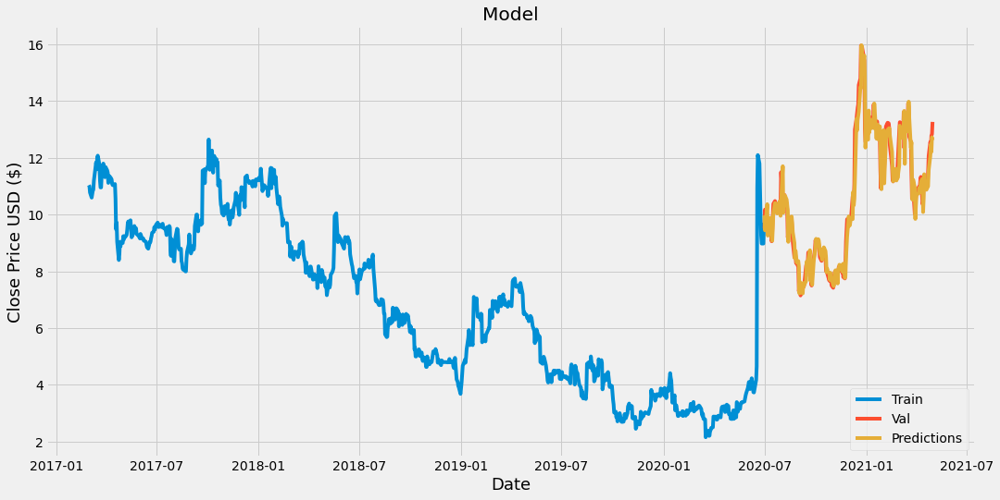

Accuracy: Close    0.004065
dtype: float64
Ticker Analyzed: ALRN
(966, 6)
Epoch 1/10
713/713 [==============================] - 16s 18ms/step - loss: 0.0039 - mse: 0.0039 - mae: 0.0395 - mape: 3303.1861
Epoch 2/10
780/780 [==============================] - 17s 18ms/step - loss: 0.0045 - mse: 0.0045 - mae: 0.0442 - mape: 6702.3312
Epoch 2/10
780/780 [==============================] - 14s 18ms/step - loss: 7.4893e-04 - mse: 7.4893e-04 - mae: 0.0197 - mape: 155953.9513
Epoch 3/10
780/780 [==============================] - 15s 19ms/step - loss: 5.6824e-04 - mse: 5.6824e-04 - mae: 0.0166 - mape: 43517.2419
Epoch 4/10
780/780 [==============================] - 14s 18ms/step - loss: 8.5870e-04 - mse: 8.5870e-04 - mae: 0.0213 - mape: 168019.4475
Epoch 5/10
780/780 [==============================] - 16s 21ms/step - loss: 5.8144e-04 - mse: 5.8144e-04 - mae: 0.0184 - mape: 4580.8698
Epoch 9/10
780/780 [==============================] - 17s 22ms/step - loss: 6.4724e-04 - mse: 6.4724e-04 - mae: 0.0

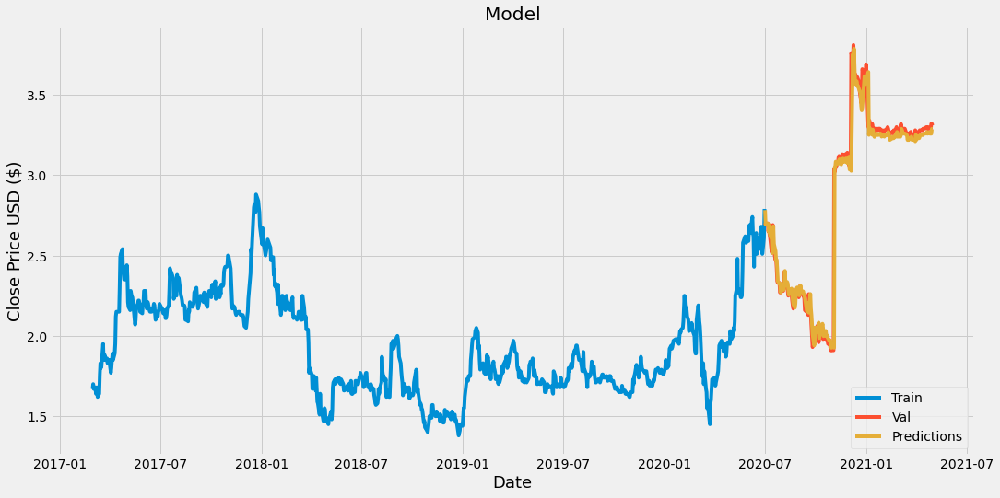

Accuracy: Close    0.007131
dtype: float64
Ticker Analyzed: ALSN
(1050, 6)
Epoch 1/10
780/780 [==============================] - 20s 22ms/step - loss: 0.0170 - mse: 0.0170 - mae: 0.0806 - mape: 31140.5952
Epoch 2/10
780/780 [==============================] - 17s 22ms/step - loss: 0.0028 - mse: 0.0028 - mae: 0.0408 - mape: 5835.6612
Epoch 3/10
732/732 [==============================] - 17s 19ms/step - loss: 0.0038 - mse: 0.0038 - mae: 0.0304 - mape: 5106.6514
Epoch 2/10
732/732 [==============================] - 15s 20ms/step - loss: 9.4950e-04 - mse: 9.4950e-04 - mae: 0.0208 - mape: 4538.2349
Epoch 3/10
732/732 [==============================] - 15s 21ms/step - loss: 7.7493e-04 - mse: 7.7493e-04 - mae: 0.0194 - mape: 3399.1791
Epoch 4/10
732/732 [==============================] - 15s 21ms/step - loss: 5.9137e-04 - mse: 5.9137e-04 - mae: 0.0159 - mape: 27687.9501
Epoch 5/10
732/732 [==============================] - 15s 21ms/step - loss: 5.4074e-04 - mse: 5.4074e-04 - mae: 0.0164 - mape

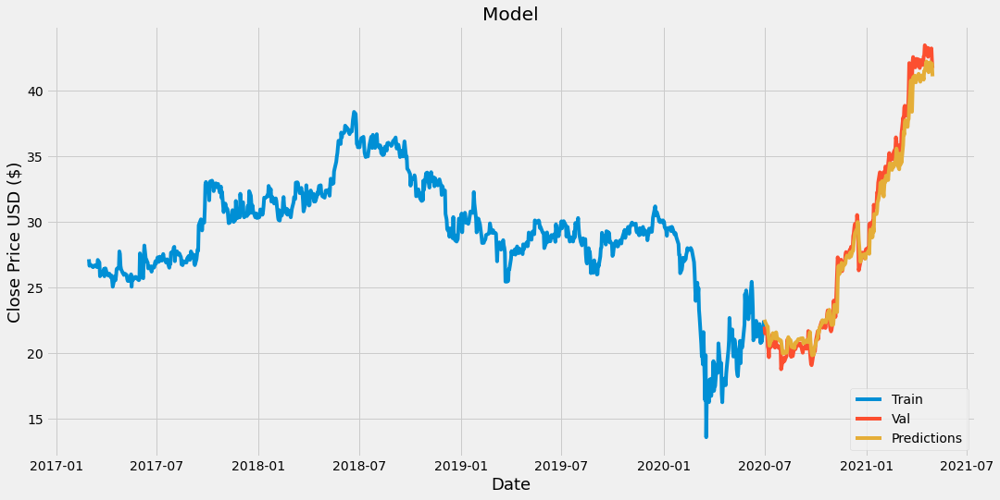

Accuracy: Close    0.009001
dtype: float64
Ticker Analyzed: ALTG
(509, 6)
Epoch 1/10
348/348 [==============================] - 15s 31ms/step - loss: 0.0205 - mse: 0.0205 - mae: 0.0864 - mape: 2015259.3045
Epoch 2/10
348/348 [==============================] - 8s 24ms/step - loss: 0.0026 - mse: 0.0026 - mae: 0.0372 - mape: 928961.8135
Epoch 3/10
348/348 [==============================] - 7s 20ms/step - loss: 0.0024 - mse: 0.0024 - mae: 0.0359 - mape: 202956.5670
Epoch 4/10
348/348 [==============================] - 6s 18ms/step - loss: 0.0023 - mse: 0.0023 - mae: 0.0341 - mape: 1334702.5606
Epoch 5/10
348/348 [==============================] - 7s 19ms/step - loss: 0.0025 - mse: 0.0025 - mae: 0.0370 - mape: 324170.2299
Epoch 6/10
348/348 [==============================] - 6s 18ms/step - loss: 0.0015 - mse: 0.0015 - mae: 0.0278 - mape: 646724.1560
Epoch 7/10
348/348 [==============================] - 7s 19ms/step - loss: 0.0015 - mse: 0.0015 - mae: 0.0292 - mape: 725813.9924
Epoch 8/10
34

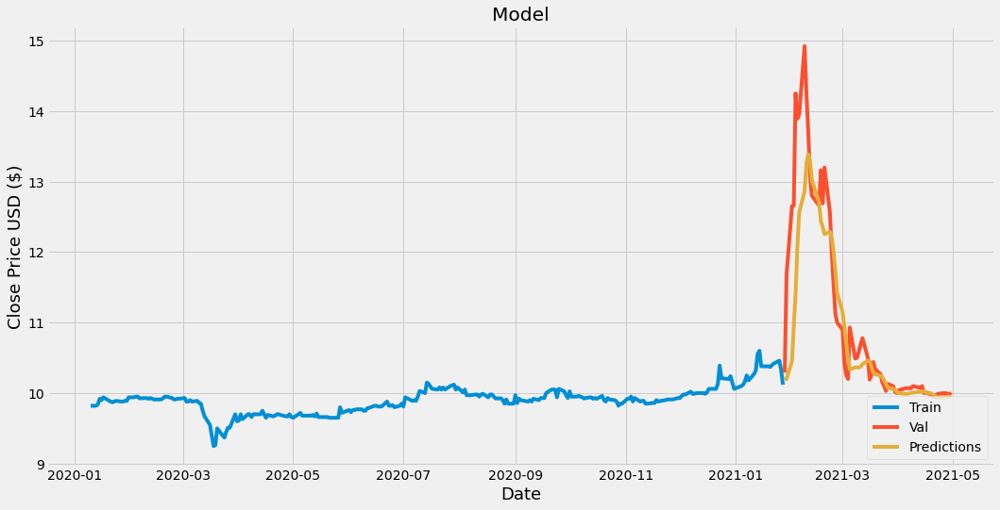

Accuracy: Close    0.043014
dtype: float64
Ticker Analyzed: ALV
(1050, 6)
Epoch 1/10
780/780 [==============================] - 22s 23ms/step - loss: 0.0143 - mse: 0.0143 - mae: 0.0750 - mape: 132543.6802
Epoch 2/10
780/780 [==============================] - 19s 24ms/step - loss: 0.0027 - mse: 0.0027 - mae: 0.0405 - mape: 447137.5316
Epoch 3/10
780/780 [==============================] - 16s 21ms/step - loss: 0.0016 - mse: 0.0016 - mae: 0.0302 - mape: 312733.5587
Epoch 4/10
780/780 [==============================] - 17s 22ms/step - loss: 0.0012 - mse: 0.0012 - mae: 0.0262 - mape: 31841.2622
Epoch 5/10
780/780 [==============================] - 15s 19ms/step - loss: 9.0462e-04 - mse: 9.0462e-04 - mae: 0.0227 - mape: 8958.3406
Epoch 8/10
780/780 [==============================] - 15s 19ms/step - loss: 8.1244e-04 - mse: 8.1244e-04 - mae: 0.0221 - mape: 12875.9327
Epoch 9/10
780/780 [==============================] - 14s 18ms/step - loss: 8.2994e-04 - mse: 8.2994e-04 - mae: 0.0220 - mape: 1

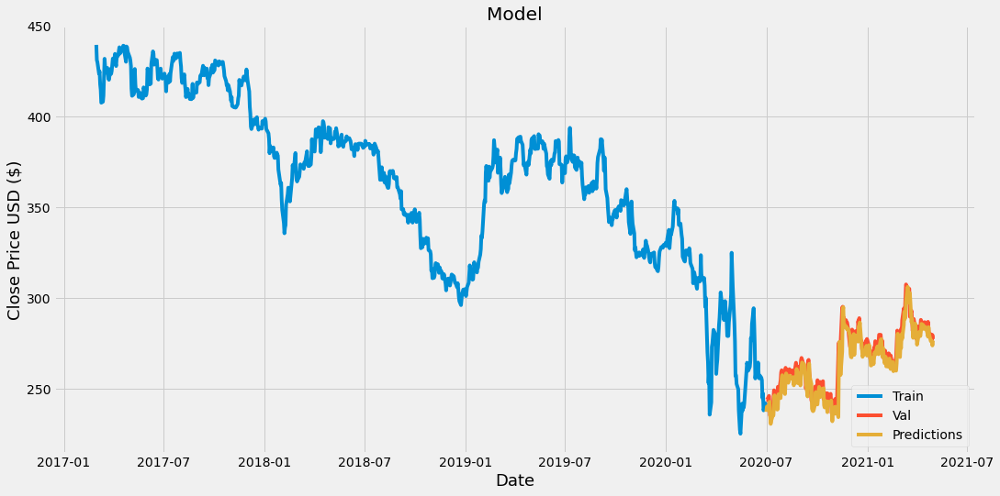

Accuracy: Close    0.016078
dtype: float64
Ticker Analyzed: ALXN
(1050, 6)
Epoch 1/10
780/780 [==============================] - 21s 24ms/step - loss: 0.0158 - mse: 0.0158 - mae: 0.0829 - mape: 110979.4909
Epoch 2/10
780/780 [==============================] - 15s 20ms/step - loss: 0.0014 - mse: 0.0014 - mae: 0.0293 - mape: 205669.9876
Epoch 4/10
780/780 [==============================] - 15s 19ms/step - loss: 9.7612e-04 - mse: 9.7612e-04 - mae: 0.0240 - mape: 207852.6574
Epoch 5/10
780/780 [==============================] - 14s 18ms/step - loss: 7.2720e-04 - mse: 7.2720e-04 - mae: 0.0204 - mape: 221982.2842
Epoch 6/10
780/780 [==============================] - 14s 18ms/step - loss: 6.9365e-04 - mse: 6.9365e-04 - mae: 0.0194 - mape: 54927.1556
Epoch 7/10
780/780 [==============================] - 14s 18ms/step - loss: 8.6515e-04 - mse: 8.6515e-04 - mae: 0.0222 - mape: 70287.9272
Epoch 8/10
489/489 [==============================] - 9s 19ms/step - loss: 0.0041 - mse: 0.0041 - mae: 0.0484

In [ ]:
models = {}
rmse = {}
for symbol in df_nasdaq['symbol']:
    try:
        df = m.getStockQuote(web, symbol, 'yahoo', from_data, today)
        if(df.notnull and df.shape[0] >= 60):
            print("Ticker Analyzed: {0}".format(symbol))
            print(df.shape)
            df_filtered = df.filter(['Close'])
            perc_train = .8
            models[symbol], rmse[symbol] = m.modelBase(df_filtered, 60, perc_train, 10, True)
            df_test = df_filtered.tail(math.ceil(df_filtered.shape[0] * 1 - perc_train))
            print("Accuracy: {0}".format(rmse[symbol] / (df_test.max() - df_test.min())))
    except:
        print("Error on {0}!".format(symbol))

In [ ]:
df.shape

In [ ]:
models

In [156]:

data = df.filter(['Close'])
dataset = data.values


training_data_len = math.ceil(len(dataset) * .8) #80/20 or 70/30

scaler = MinMaxScaler(feature_range=(0,1))
scaled_data = scaler.fit_transform(dataset)
train_data = scaled_data[0:training_data_len, :]

#Creating training dataset

x_train = []
y_train = []

windowLenght = 60

for i in range(windowLenght, len(train_data)):
    x_train.append(train_data[i - windowLenght:i, 0])
    y_train.append(train_data[i, 0])

# Convert and reshape x_train and y_train to numpy

x_train, y_train = np.array(x_train), np.array(y_train)
x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))

#Build the LSTM Model (50/50/25 are the number of neurons)

model = Sequential()
model.add(LSTM(50, return_sequences = True, input_shape = (x_train.shape[1], 1)))
model.add(LSTM(50, return_sequences = False))
model.add(Dense(25))
model.add(Dense(1))

#Compile the model

model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mse', 'mae', 'mape'])

#Train the model

model.fit(x_train, y_train, batch_size = 1, epochs = 10)

#Creating testing dataset

test_data = scaled_data[training_data_len - windowLenght: , :]

#Create dataset x_test and y_test

x_test = []
y_test = dataset[training_data_len: , :]

for i in range(windowLenght, len(test_data)):
    x_test.append(test_data[i - windowLenght:i, 0])

x_test = np.array(x_test)

x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1))

#Get the models predicted price values
predictions = model.predict(x_test)
predictions = scaler.inverse_transform(predictions)

#Get the root mean squared error (RMSE)
rmse = np.sqrt(np.mean(predictions - y_test) ** 2)



Epoch 1/10
746/746 [==============================] - 17s 20ms/step - loss: 0.0140 - mse: 0.0140 - mae: 0.0729 - mape: 29.8462
Epoch 2/10
746/746 [==============================] - 15s 20ms/step - loss: 0.0020 - mse: 0.0020 - mae: 0.0352 - mape: 14.7185
Epoch 3/10
746/746 [==============================] - 15s 20ms/step - loss: 0.0012 - mse: 0.0012 - mae: 0.0269 - mape: 12.7834
Epoch 4/10
746/746 [==============================] - 16s 21ms/step - loss: 0.0013 - mse: 0.0013 - mae: 0.0278 - mape: 11.1973
Epoch 5/10
746/746 [==============================] - 15s 21ms/step - loss: 0.0011 - mse: 0.0011 - mae: 0.0250 - mape: 10.9325
Epoch 6/10
746/746 [==============================] - 15s 20ms/step - loss: 7.9444e-04 - mse: 7.9444e-04 - mae: 0.0213 - mape: 8.0369
Epoch 7/10
746/746 [==============================] - 15s 20ms/step - loss: 7.7855e-04 - mse: 7.7855e-04 - mae: 0.0219 - mape: 7.4051
Epoch 8/10
746/746 [==============================] - 15s 20ms/step - loss: 6.8527e-04 - mse: 6.8

In [157]:
#Plot data
train = data[:training_data_len]
valid = data[training_data_len:]


In [158]:
valid.insert(1,'Predictions',predictions, True)

In [159]:
valid

,Close,Predictions
Date,,
2020-05-12,9.650000,9.381651
2020-05-13,9.110000,9.079196
2020-05-14,9.150000,8.580901
2020-05-15,9.040000,8.447747
2020-05-18,9.870000,8.344794
...,...,...
2021-02-22,20.440001,18.051409
2021-02-23,20.660000,19.653290
2021-02-24,21.820000,20.218176


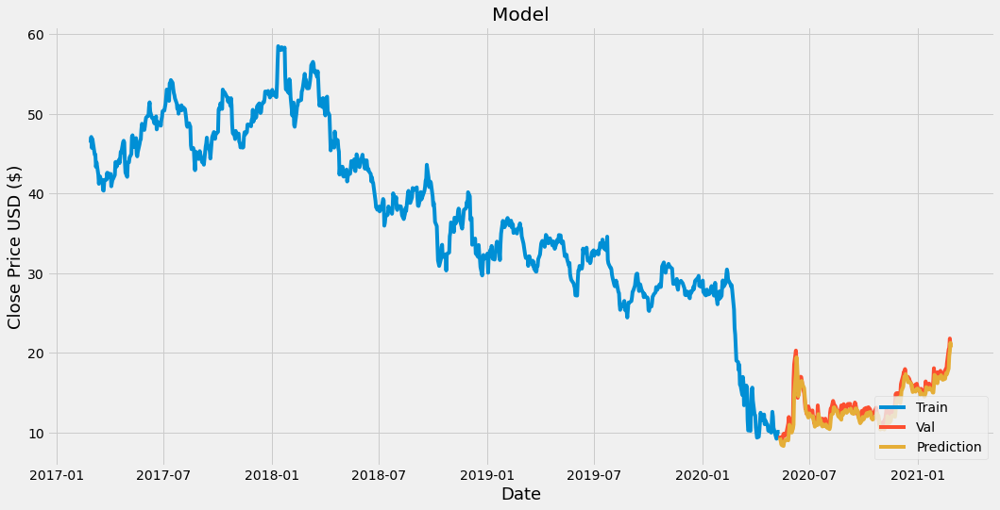

In [165]:
plt.figure(figsize=(16,8))
plt.title('Model')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price USD ($)', fontsize=18)
plt.plot(train['Close'])
plt.plot(valid[['Close', 'Predictions']])
plt.legend(['Train', 'Val', 'Prediction'], loc = 'lower right')
plt.show()

In [168]:
df = m.getStockQuote(web, df_nasdaq['symbol'][10], 'yahoo', from_data, to_data)
new_df = df.filter(['Close'])
scaler = MinMaxScaler(feature_range=(0,1))

In [169]:
last_60_days = new_df[-60:].values
last_60_days_scaled = scaler.fit_transform(last_60_days)
X_test = []
X_test.append(last_60_days_scaled)
X_test = np.array(X_test)
X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], 1))
pred_price = models[symbol].predict(X_test)
pred_price = scaler.inverse_transform(pred_price)
pred_price

array([[21.085342]], dtype=float32)

In [171]:
df = m.getStockQuote(web, df_nasdaq['symbol'][10], 'yahoo', to_data, today)
df

,High,Low,Open,Close,Volume,Adj Close
Date,,,,,,
2021-03-01,22.290001,21.049999,21.750000,21.180000,45229100,21.180000
2021-03-02,21.629999,21.120001,21.280001,21.440001,27395100,21.440001
2021-03-03,22.590000,21.730000,21.870001,22.170000,49114900,22.170000
2021-03-04,22.420000,20.410000,22.280001,21.240000,60619300,21.240000
2021-03-05,21.500000,18.940001,21.400000,20.450001,63066000,20.450001
2021-03-08,21.709999,20.650000,20.780001,21.469999,39620700,21.469999
2021-03-09,21.809999,20.660000,21.590000,21.600000,39678200,21.600000
2021-03-10,22.480000,21.370001,21.670000,21.750000,44114100,21.750000
2021-03-11,22.500000,21.770000,22.000000,22.150000,38834100,22.150000


In [139]:
plt.figure(figsize=(16,8))
plt.title('Model')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price USD ($)', fontsize=18)
plt.plot(train['Close'])
plt.plot(valid[['Close', 'Predictions']])
plt.legend(['Train', 'Val', 'Prediction'], loc = 'lower right')
plt.show()

array([[0.        ],
       [0.0781456 ],
       [0.24105959],
       [0.28211912],
       [0.38940383],
       [0.44503299],
       [0.38278141],
       [0.49271519],
       [0.3682118 ],
       [0.32185438],
       [0.36291391],
       [0.34304641],
       [0.33509921],
       [0.29668874],
       [0.24238412],
       [0.1602648 ],
       [0.21456954],
       [0.1841059 ],
       [0.23708599],
       [0.21059594],
       [0.24900654],
       [0.19867552],
       [0.11390725],
       [0.15364238],
       [0.16556293],
       [0.14701984],
       [0.11390725],
       [0.09668869],
       [0.14701984],
       [0.16688734],
       [0.28741726],
       [0.19735098],
       [0.22516556],
       [0.2516556 ],
       [0.20662247],
       [0.20529793],
       [0.15364238],
       [0.16688734],
       [0.30331116],
       [0.50728481],
       [0.38410595],
       [0.34039734],
       [0.30728476],
       [0.44105964],
       [0.41456947],
       [0.38675502],
       [0.46357621],
       [0.419

In [128]:
last_60_days_scaled = np.insert(last_60_days_scaled, 0, pred_price)


In [ ]:
plt.figure(figsize=(16,8))
plt.title('Close Price HIstory')
plt.plot(df['Close'])
plt.xlabel('Date', fontsize= 18)
plt.ylabel('Current Price USD ($)', fontsize= 18)


In [ ]:
data = df.filter(['Close'])
dataset = data.values
training_data_len = math.ceil(len(dataset) * .8) #80/20

In [ ]:
scaler = MinMaxScaler(feature_range=(0,1))
scaled_data = scaler.fit_transform(dataset)
scaled_data

In [ ]:
#Creating training dataset
train_data = scaled_data[0:training_data_len, :]
x_train = []
y_train = []
windowLenght = 60
for i in range(windowLenght, len(train_data)):
    x_train.append(train_data[i - windowLenght:i, 0])
    y_train.append(train_data[i, 0])
    if i <= windowLenght:
        print(x_train)
        print(y_train)
        

In [ ]:
# Convert x_train and y_train to numpy
x_train, y_train = np.array(x_train), np.array(y_train)

In [ ]:
#Reshape the Data
x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))
x_train.shape

In [ ]:
#Build the LSTM Model (50/50/25 are the number of neurons)

model = Sequential()
model.add(LSTM(50, return_sequences = True, input_shape = (x_train.shape[1], 1)))
model.add(LSTM(50, return_sequences = False))
model.add(Dense(25))
model.add(Dense(1))

In [ ]:
#Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

In [ ]:
#Train the model
model.fit(x_train, y_train, batch_size = 1, epochs = 100)

In [ ]:
#Creating testing dataset
test_data = scaled_data[training_data_len - windowLenght: , :]
#Create dataset x_test and y_test
x_test = []
y_test = dataset[training_data_len: , :]
for i in range(windowLenght, len(test_data)):
    x_test.append(test_data[i - windowLenght:i, 0])

In [ ]:
x_test = np.array(x_test)

In [ ]:
x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1))

In [ ]:
#Get the models predicted price values
predictions = model.predict(x_test)
predictions = scaler.inverse_transform(predictions)

In [ ]:
#Get the root mean squared error (RMSE)
rmse = np.sqrt(np.mean(predictions - y_test) ** 2)
rmse

In [ ]:
#Plot data
train = data[:training_data_len]
valid = data[training_data_len:]
valid['Predictions'] = predictions
plt.figure(figsize=(16,8))
plt.title('Model')
plt.xlabel('Date', fontsize=18)
plt.ylabel('Close Price USD ($)', fontsize=18)
plt.plot(train['Close'])
plt.plot(valid[['Close', 'Predictions']])
plt.show()